In [74]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from collections import defaultdict
from functools import reduce
import os
import statistics

import seaborn as sns
import matplotlib.pyplot as plt

import pickle

In [75]:
#Files Einlesen

In [76]:
with open(r"..\data\stationDataDictionary.pkl", "rb") as f:
    stationDataDictionary= pickle.load(f)

with open("..\data\missingValueDictionary.pkl", "rb") as f:
    missingValueDictionary= pickle.load(f)

rowwiseDf = pd.read_pickle(r"..\data\rowwiseDf.pkl")
colwiseDf = pd.read_pickle(r"..\data\colwiseDf.pkl")

In [77]:
#Evaluation

In [78]:
#General Information about the Data

In [79]:
stationDataDictionary["01270"].columns

Index(['MESS_DATUM', 'STATIONS_ID', 'TT_TU', 'RF_TU', '  R1', 'RS_IND', 'WRTR',
       '   P', '  P0', '   F', '   D', 'Stationshoehe', 'geoBreite',
       'geoLaenge', 'Stationsname', 'hour', 'day', 'month', 'hour_sin',
       'hour_cos', 'month_sin', 'month_cos'],
      dtype='object')

In [80]:
rowwiseDf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1665312 entries, 0 to 1665311
Data columns (total 22 columns):
 #   Column         Non-Null Count    Dtype         
---  ------         --------------    -----         
 0   MESS_DATUM     1665312 non-null  datetime64[ns]
 1   STATIONS_ID    1665312 non-null  float64       
 2   TT_TU          1661091 non-null  float64       
 3   RF_TU          1659974 non-null  float64       
 4     R1           1644851 non-null  float64       
 5   RS_IND         1644879 non-null  float64       
 6   WRTR           849399 non-null   float64       
 7      P           1385232 non-null  float64       
 8     P0           1648059 non-null  float64       
 9      F           1649809 non-null  float64       
 10     D           1652549 non-null  float64       
 11  Stationshoehe  1665312 non-null  int64         
 12  geoBreite      1665312 non-null  float64       
 13  geoLaenge      1665312 non-null  float64       
 14  Stationsname   1665312 non-null  o

In [81]:
rowwiseDf[['MESS_DATUM', 'TT_TU', 'RF_TU', '  R1', '  P0', '   F', 'Stationshoehe', 'geoBreite', 'geoLaenge', 'hour', 'day', 'month']].describe()

,MESS_DATUM,TT_TU,RF_TU,R1,P0,F,Stationshoehe,geoBreite,geoLaenge,hour,day,month
count,1665312,1.661091e+06,1.659974e+06,1.644851e+06,1.648059e+06,1.649809e+06,1.665312e+06,1.665312e+06,1.665312e+06,1.665312e+06,1.665312e+06,1.665312e+06
mean,2018-12-31 23:29:59.999996672,9.202060e+00,7.764430e+01,8.087541e-02,9.645508e+02,3.504332e+00,4.387368e+02,5.095655e+01,1.095700e+01,1.150000e+01,1.572782e+01,6.523549e+00
min,2014-01-01 00:00:00,-2.340000e+01,4.000000e+00,0.000000e+00,8.646000e+02,0.000000e+00,1.640000e+02,5.030660e+01,9.737700e+00,0.000000e+00,1.000000e+00,1.000000e+00
25%,2016-07-01 23:45:00,3.100000e+00,6.600000e+01,0.000000e+00,9.514000e+02,1.900000e+00,2.720000e+02,5.050030e+01,1.036210e+01,5.750000e+00,8.000000e+00,4.000000e+00
50%,2018-12-31 23:30:00,8.800000e+00,8.200000e+01,0.000000e+00,9.721000e+02,3.100000e+00,3.560000e+02,5.088120e+01,1.096080e+01,1.150000e+01,1.600000e+01,7.000000e+00
75%,2021-07-01 23:15:00,1.490000e+01,9.200000e+01,0.000000e+00,9.844000e+02,4.600000e+00,5.650000e+02,5.139320e+01,1.180410e+01,1.725000e+01,2.300000e+01,1.000000e+01
max,2023-12-31 23:00:00,3.860000e+01,1.000000e+02,5.080000e+01,1.027000e+03,2.390000e+01,9.380000e+02,5.184540e+01,1.213000e+01,2.300000e+01,3.100000e+01,1.200000e+01
std,NaN,7.917817e+00,1.780497e+01,5.002413e-01,2.802630e+01,2.172689e+00,2.315516e+02,4.833830e-01,7.349703e-01,6.922189e+00,8.799327e+00,3.448534e+00


In [82]:
rowwiseDf.isnull().sum()

MESS_DATUM            0
STATIONS_ID           0
TT_TU              4221
RF_TU              5338
  R1              20461
RS_IND            20433
WRTR             815913
   P             280080
  P0              17253
   F              15503
   D              12763
Stationshoehe         0
geoBreite             0
geoLaenge             0
Stationsname          0
hour                  0
day                   0
month                 0
hour_sin              0
hour_cos              0
month_sin             0
month_cos             0
dtype: int64

In [83]:
rowwiseDf.isnull().mean() * 100

MESS_DATUM        0.000000
STATIONS_ID       0.000000
TT_TU             0.253466
RF_TU             0.320541
  R1              1.228659
RS_IND            1.226977
WRTR             48.994603
   P             16.818470
  P0              1.036022
   F              0.930937
   D              0.766403
Stationshoehe     0.000000
geoBreite         0.000000
geoLaenge         0.000000
Stationsname      0.000000
hour              0.000000
day               0.000000
month             0.000000
hour_sin          0.000000
hour_cos          0.000000
month_sin         0.000000
month_cos         0.000000
dtype: float64

In [84]:
#MissingvalueGaps
gapsListe= []
for _, data in missingValueDictionary.items():
    for i in data[3]:
        gapsListe.append(i)

In [85]:
summary = {
    'count': len(gapsListe),
    'min': min(gapsListe),
    'max': max(gapsListe),
    'mean': statistics.mean(gapsListe),
    'median': statistics.median(gapsListe),
    'stdev': statistics.stdev(gapsListe),
    'sorted_desc': sorted(gapsListe, reverse=True)
}

for key, value in summary.items():
    print(f"{key}: {value}")

count: 1275
min: 1
max: 6054
mean: 49.23607843137255
median: 8
stdev: 319.3941796987315
sorted_desc: [6054, 6048, 3987, 3986, 2815, 2815, 2717, 816, 606, 485, 484, 362, 360, 334, 329, 285, 282, 282, 281, 276, 267, 201, 201, 201, 201, 201, 201, 193, 193, 192, 192, 192, 189, 185, 169, 168, 167, 163, 163, 159, 157, 157, 157, 156, 156, 156, 156, 156, 156, 153, 152, 143, 142, 142, 138, 137, 124, 123, 123, 123, 122, 120, 119, 119, 119, 119, 119, 117, 116, 113, 113, 112, 112, 107, 107, 107, 105, 105, 102, 102, 102, 102, 102, 101, 97, 97, 97, 96, 96, 95, 95, 95, 95, 94, 94, 94, 94, 94, 94, 94, 93, 93, 93, 93, 93, 93, 93, 89, 89, 89, 88, 88, 88, 88, 88, 88, 87, 87, 87, 86, 86, 86, 86, 86, 86, 85, 85, 85, 85, 85, 85, 85, 85, 84, 84, 84, 84, 84, 83, 83, 83, 83, 83, 82, 78, 78, 77, 77, 76, 76, 75, 75, 75, 75, 75, 75, 74, 74, 74, 74, 74, 74, 73, 73, 73, 72, 72, 72, 71, 71, 71, 69, 69, 69, 69, 68, 68, 68, 68, 67, 66, 64, 64, 64, 63, 63, 62, 62, 62, 61, 61, 60, 60, 60, 60, 60, 58, 58, 58, 57, 57, 57,

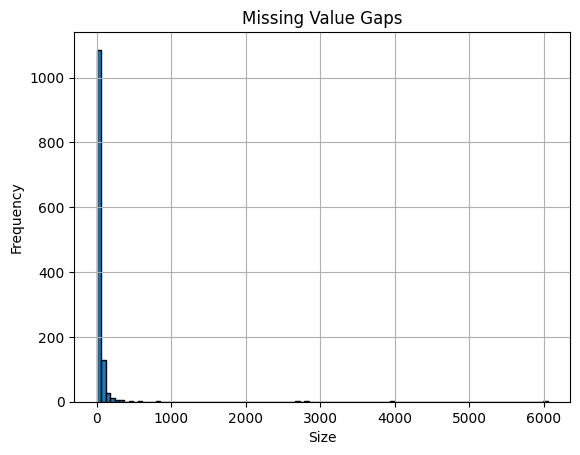

In [86]:
plt.hist(gapsListe, bins=100, edgecolor='black')
plt.title("Missing Value Gaps")
plt.xlabel("Size")
plt.ylabel("Frequency")
plt.grid(True)
plt.show()

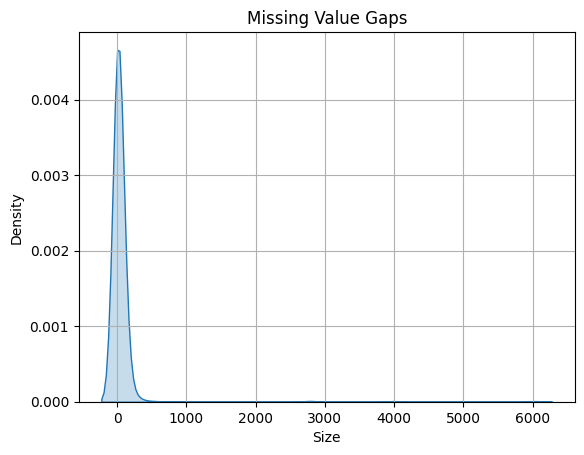

In [87]:
sns.kdeplot(gapsListe, fill=True)
plt.title("Missing Value Gaps")
plt.xlabel("Size")
plt.ylabel("Density")
plt.grid(True)
plt.show()

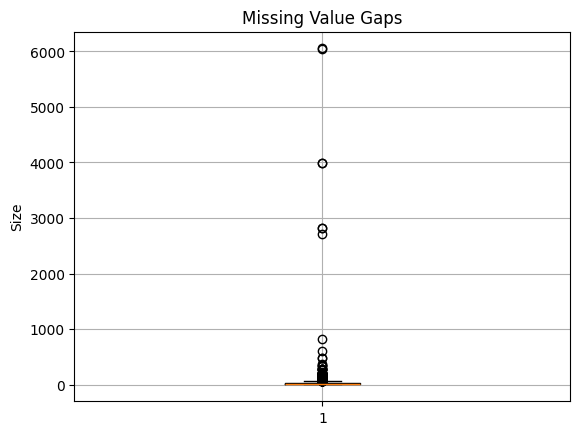

In [88]:
plt.boxplot(gapsListe)
plt.title("Missing Value Gaps")
plt.ylabel("Size")
plt.grid(True)
plt.show()

In [89]:
#Missing Value Precentage
missingValuePrec= []

for _, data in missingValueDictionary.items():
    missingValuePrec.append(data[2])

In [90]:
summary = {
    'min': min(missingValuePrec),
    'max': max(missingValuePrec)
    }

for key, value in summary.items():
    print(f"{key}: {value}")

min: 0.011409273457466229
max: 7.609985396129974


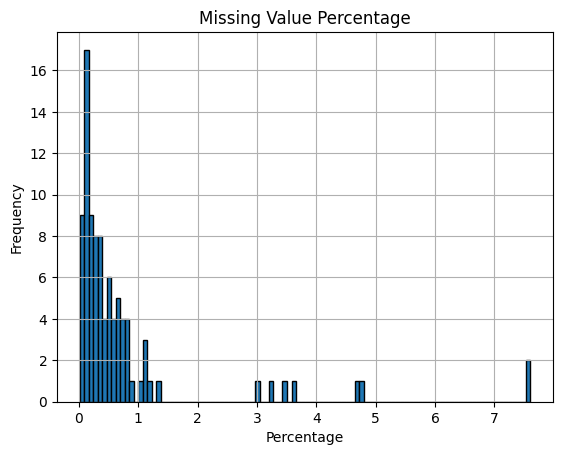

In [91]:
plt.hist(missingValuePrec, bins=100, edgecolor='black')
plt.title("Missing Value Percentage")
plt.xlabel("Percentage")
plt.ylabel("Frequency")
plt.grid(True)

plt.savefig("../results/Missing_Value_Precentage_hist.png", dpi=300, bbox_inches="tight")
plt.show()
plt.close()

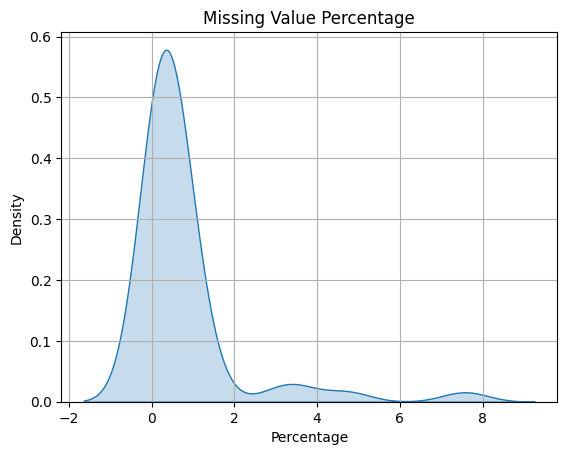

In [92]:
sns.kdeplot(missingValuePrec, fill=True)
plt.title("Missing Value Percentage")
plt.xlabel("Percentage")
plt.ylabel("Density")
plt.grid(True)
plt.show()

In [93]:
#Values

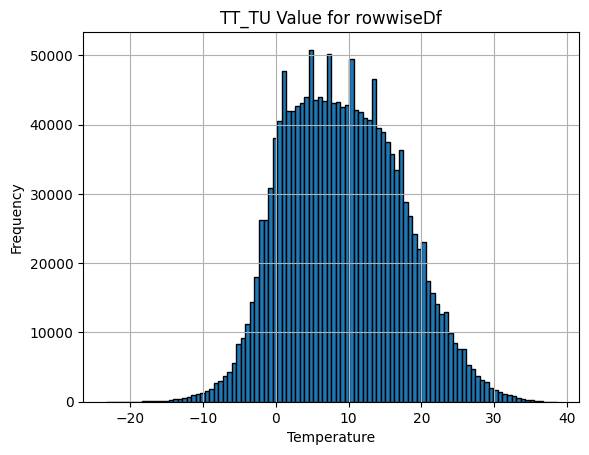

In [94]:
#TT_TU für rowwiseDf
plt.hist(rowwiseDf["TT_TU"], bins=100, edgecolor='black')
plt.title("TT_TU Value for rowwiseDf")
plt.xlabel("Temperature")
plt.ylabel("Frequency")
plt.grid(True)


plt.savefig("../results/TT_TU_Values.png", dpi=300, bbox_inches="tight")
plt.show()
plt.close()

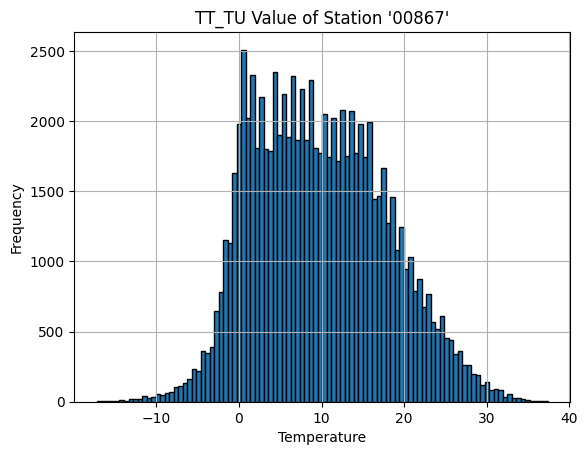

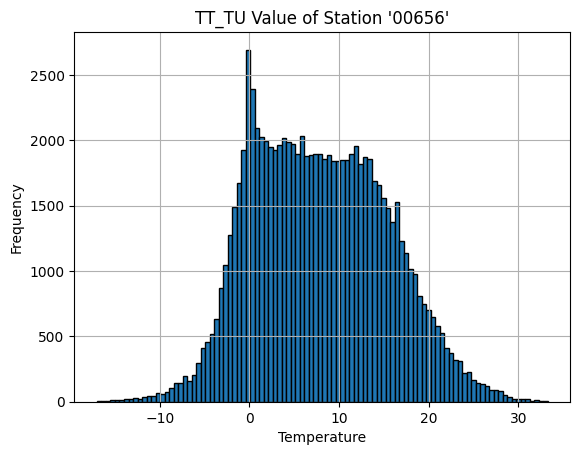

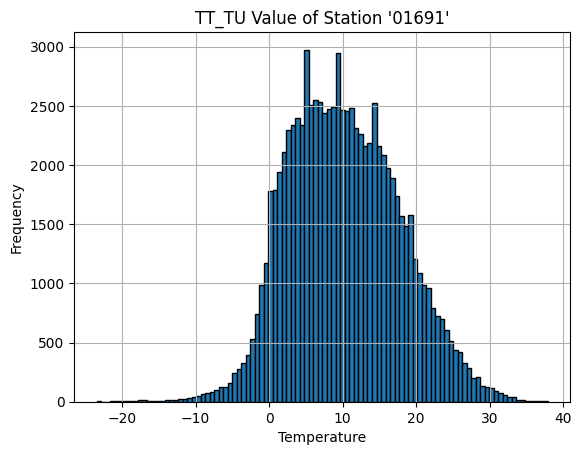

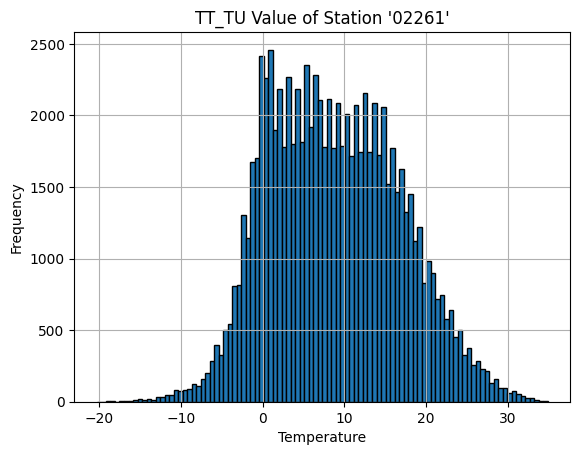

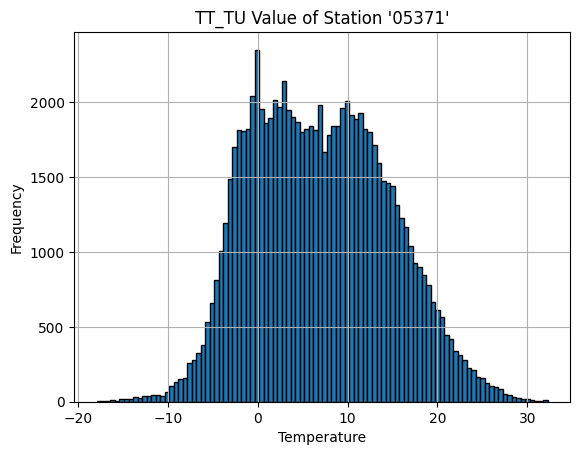

...

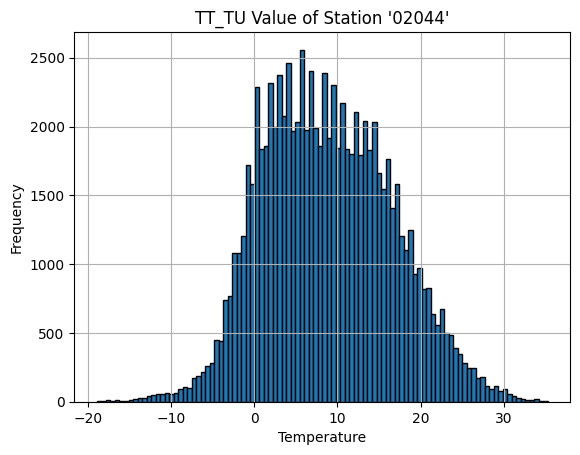

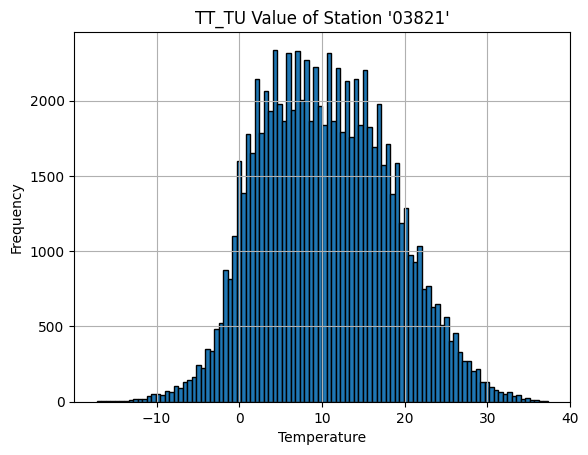

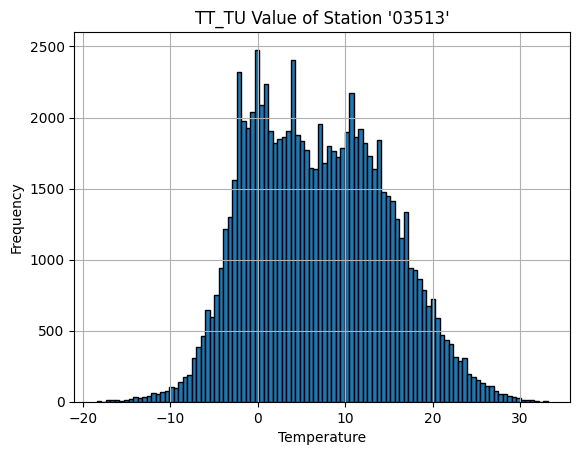

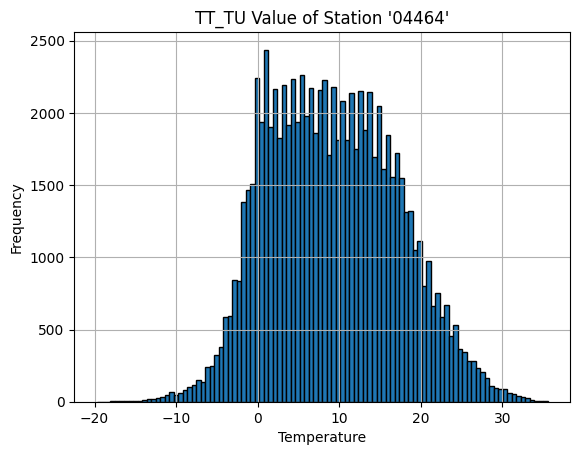

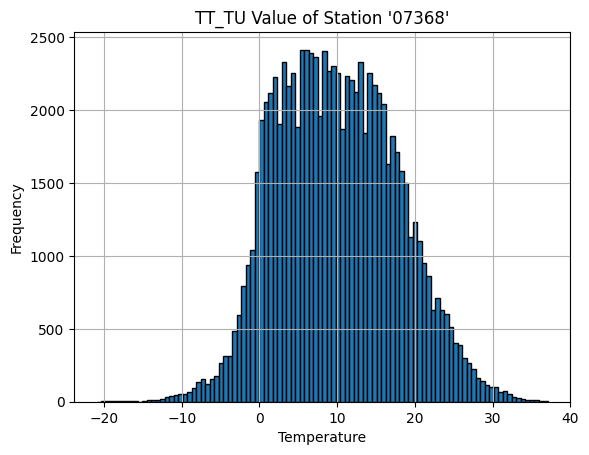

In [95]:
#TT_TU pro Station
for key, data in stationDataDictionary.items():
    plt.hist(data["TT_TU"], bins=100, edgecolor='black')
    plt.title(f"TT_TU Value of Station '{key}'")
    plt.xlabel("Temperature")
    plt.ylabel("Frequency")
    plt.grid(True)
    plt.show()

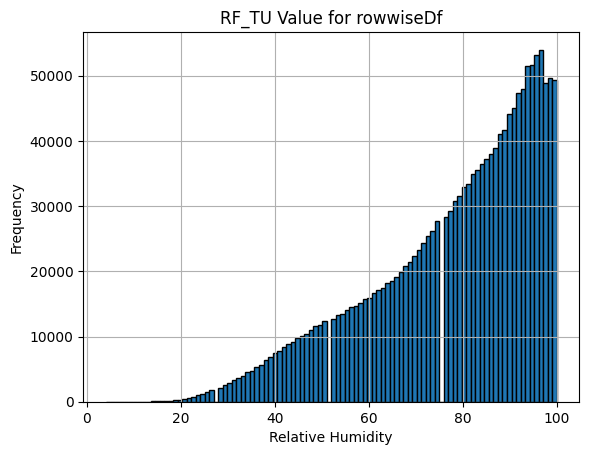

In [96]:
#RF_TU für rowwiseDf
plt.hist(rowwiseDf["RF_TU"], bins=100, edgecolor='black')
plt.title("RF_TU Value for rowwiseDf")
plt.xlabel("Relative Humidity")
plt.ylabel("Frequency")
plt.grid(True)

plt.savefig("../results/RF_TU_Values.png", dpi=300, bbox_inches="tight")
plt.show()
plt.close()

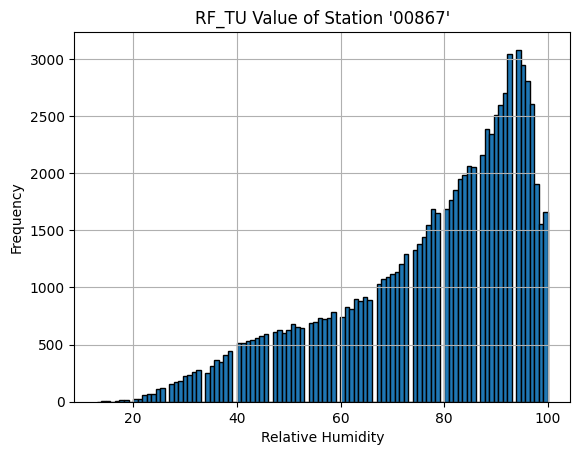

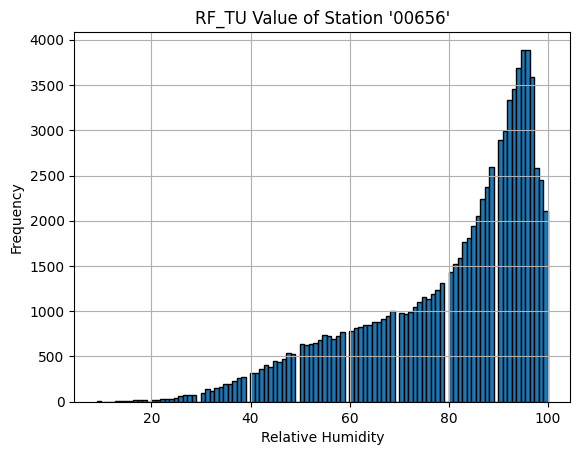

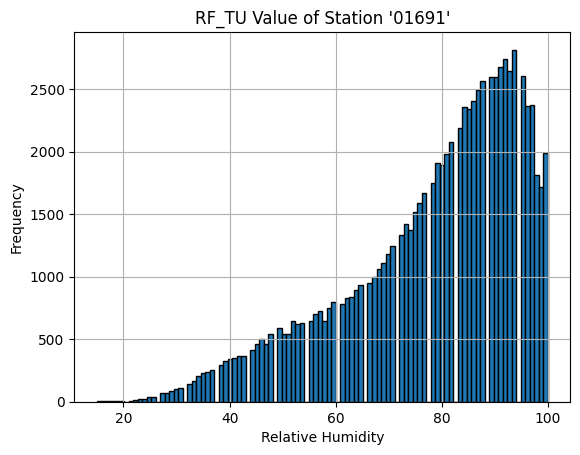

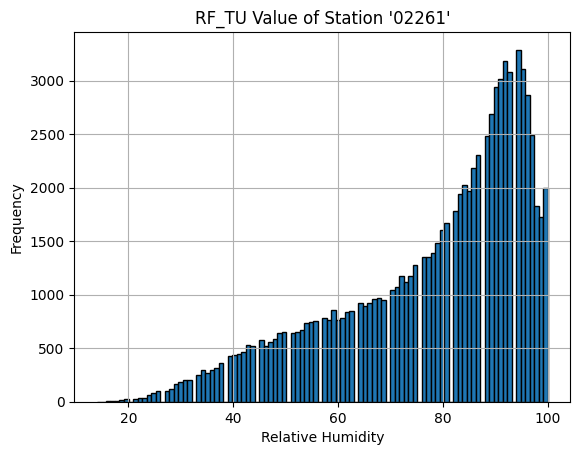

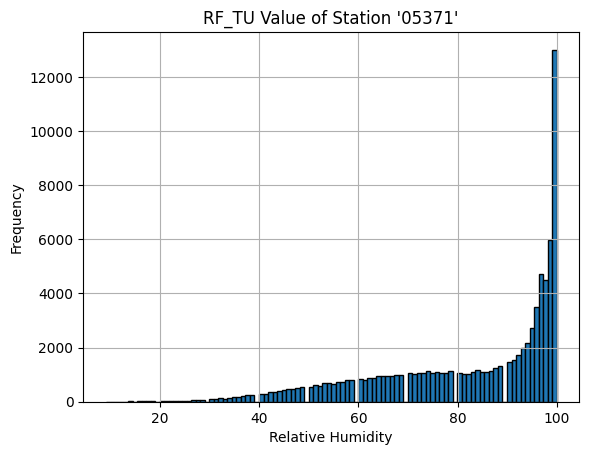

...

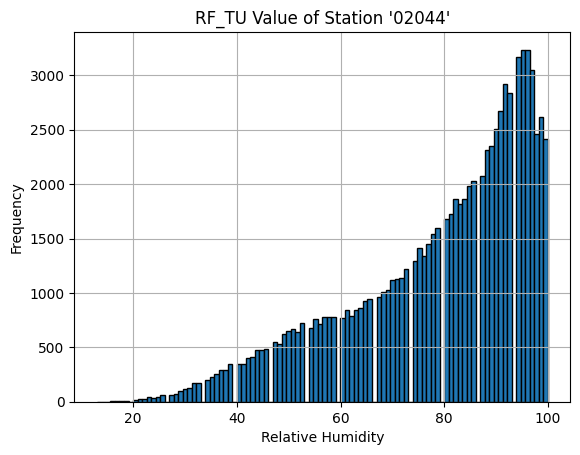

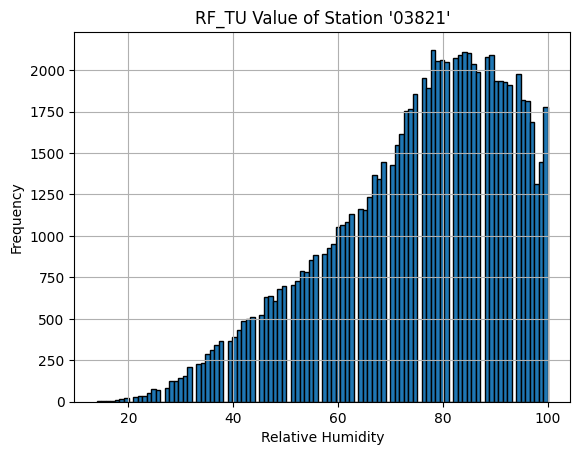

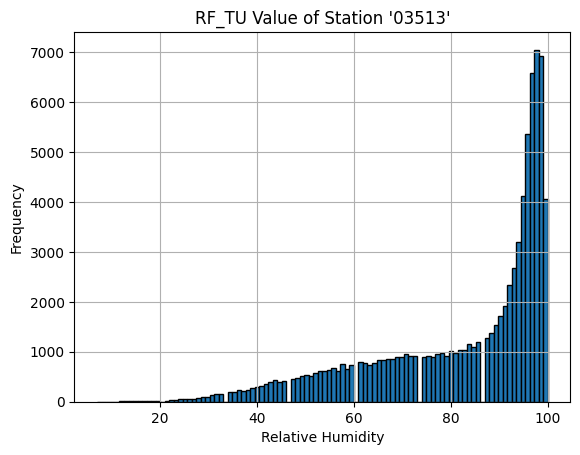

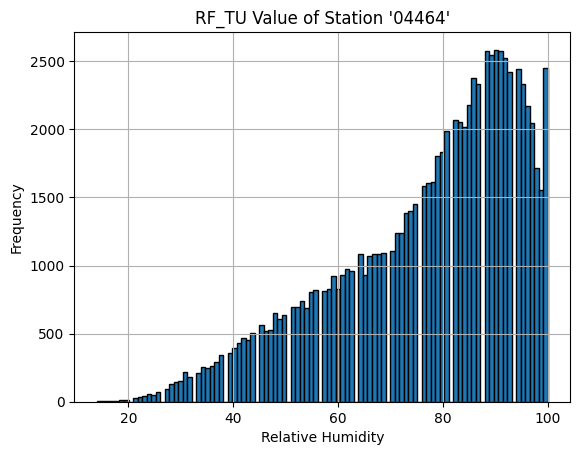

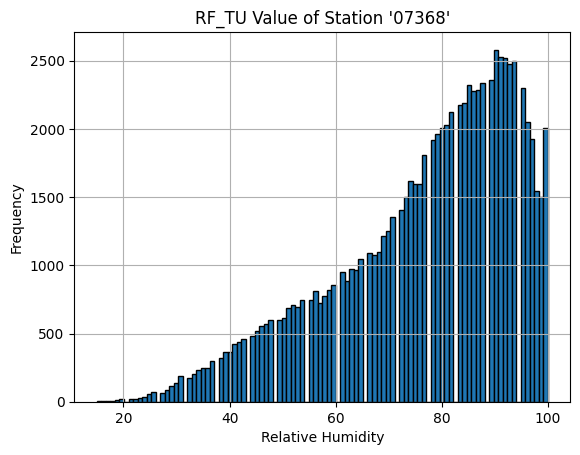

In [97]:
#RF_TU pro Station
for key, data in stationDataDictionary.items():
    plt.hist(data["RF_TU"], bins=100, edgecolor='black')
    plt.title(f"RF_TU Value of Station '{key}'")
    plt.xlabel("Relative Humidity")
    plt.ylabel("Frequency")
    plt.grid(True)
    plt.show()

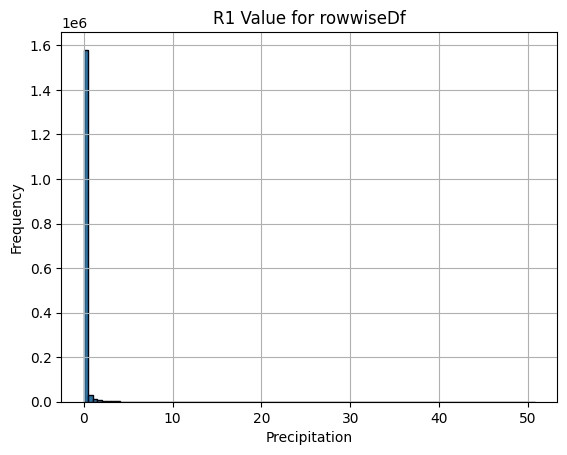

In [98]:
#R1 für rowwiseDf
plt.hist(rowwiseDf["  R1"], bins=100, edgecolor='black')
plt.title("R1 Value for rowwiseDf")
plt.xlabel("Precipitation")
plt.ylabel("Frequency")
plt.grid(True)

plt.savefig("../results/R1_Values.png", dpi=300, bbox_inches="tight")
plt.show()
plt.close()

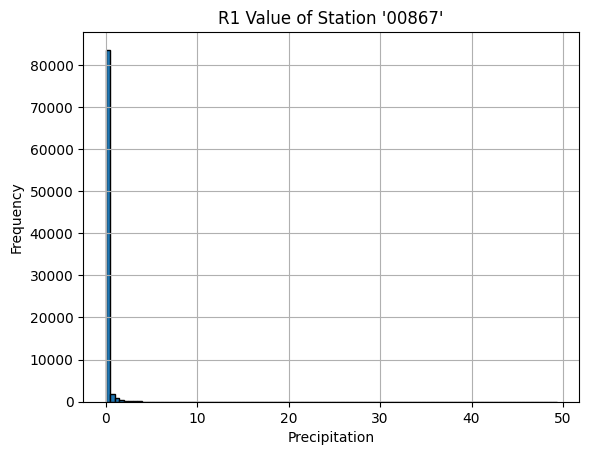

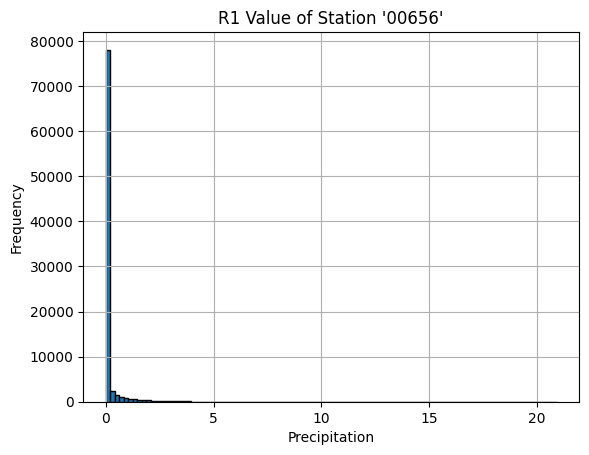

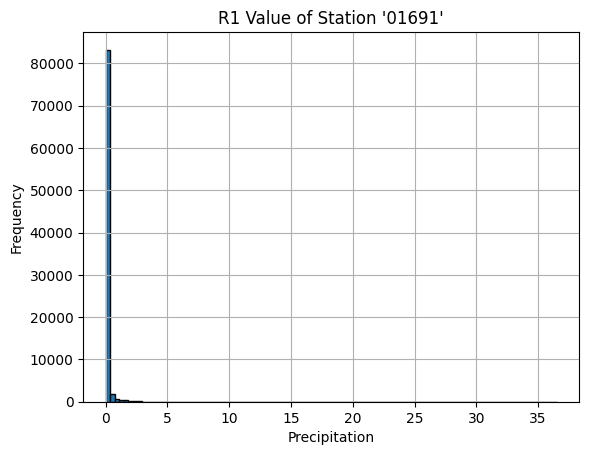

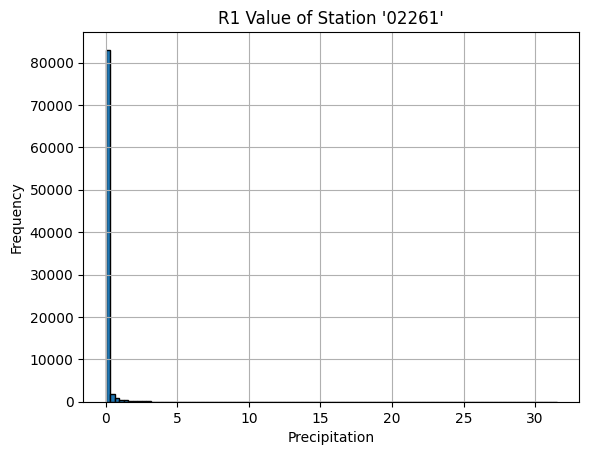

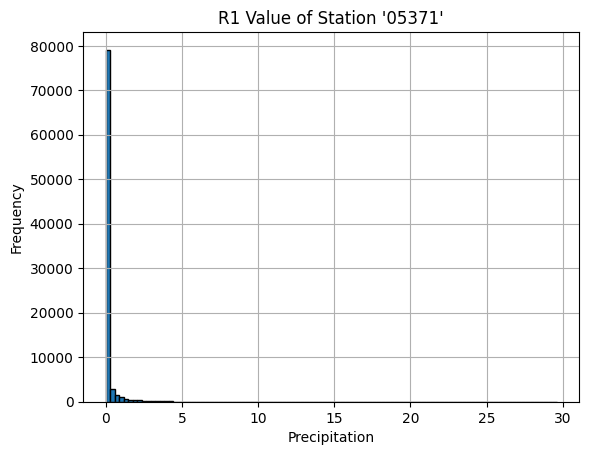

...

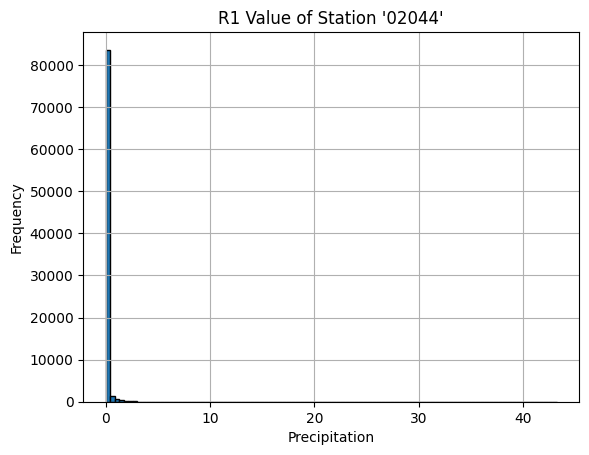

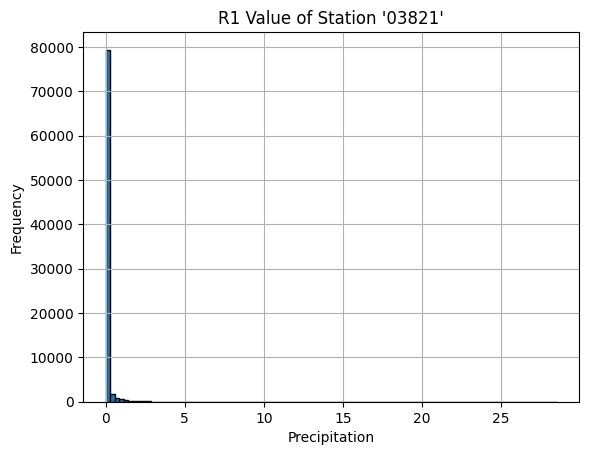

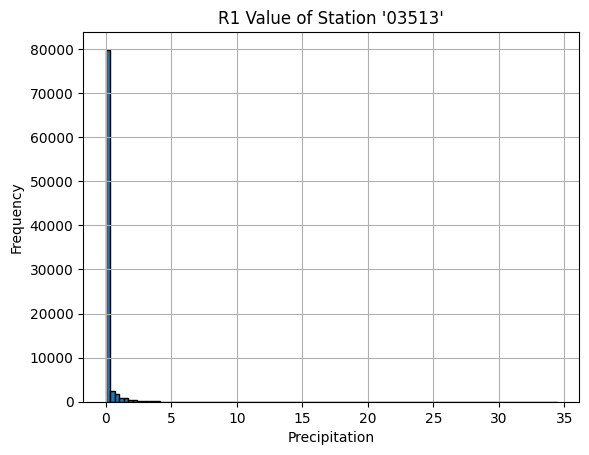

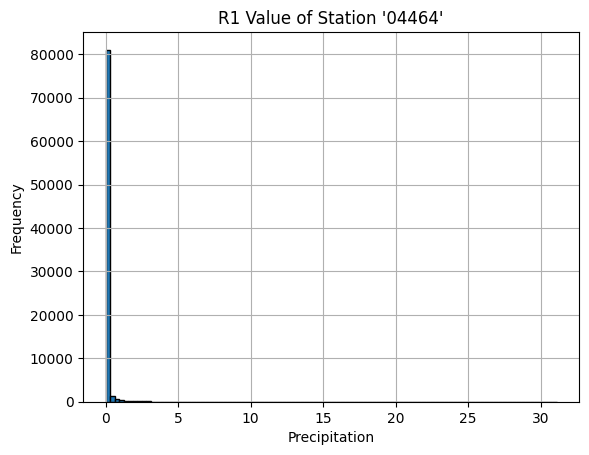

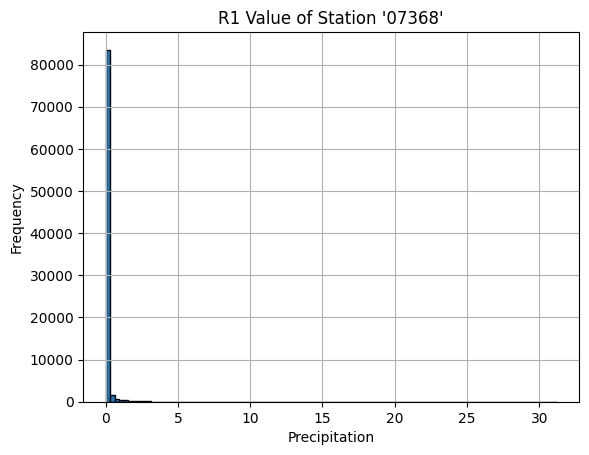

In [99]:
#R1 pro Station
for key, data in stationDataDictionary.items():
    plt.hist(data["  R1"], bins=100, edgecolor='black')
    plt.title(f"R1 Value of Station '{key}'")
    plt.xlabel("Precipitation")
    plt.ylabel("Frequency")
    plt.grid(True)
    plt.show()

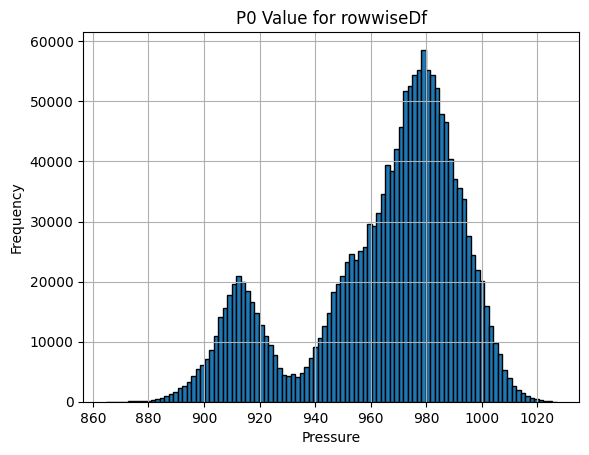

In [100]:
#PO fü rowwiseDf
plt.hist(rowwiseDf["  P0"], bins=100, edgecolor='black')
plt.title("P0 Value for rowwiseDf")
plt.xlabel("Pressure")
plt.ylabel("Frequency")
plt.grid(True)

plt.savefig("../results/P0_Values.png", dpi=300, bbox_inches="tight")
plt.show()
plt.close()

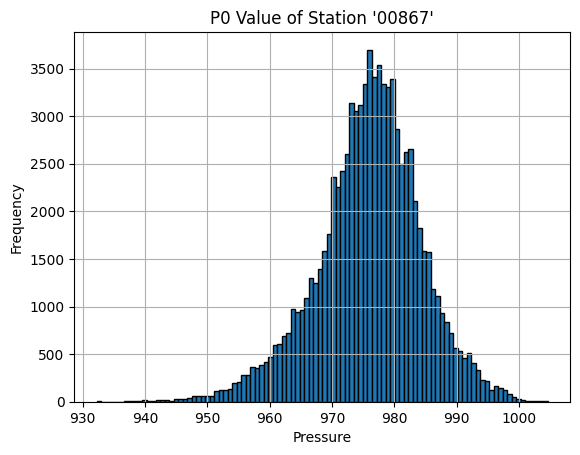

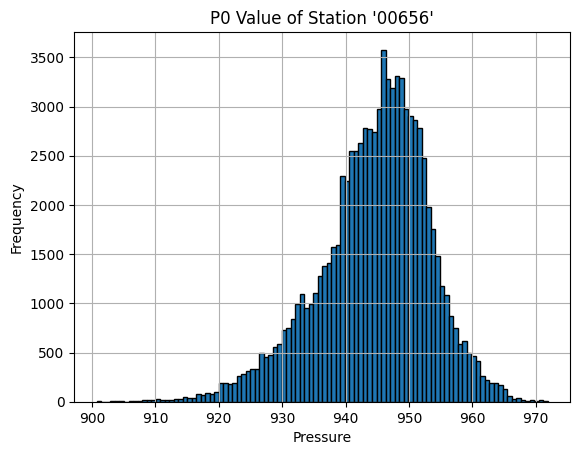

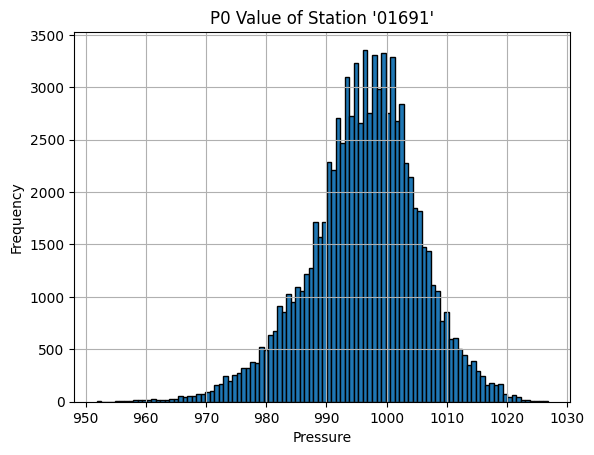

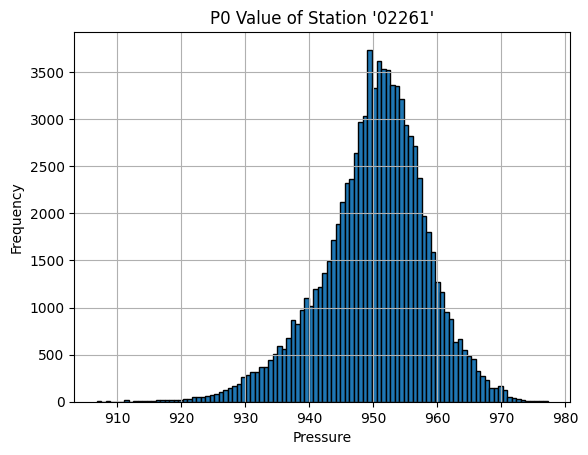

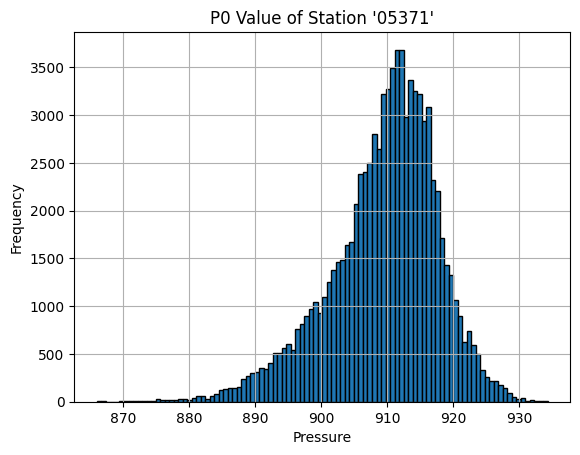

...

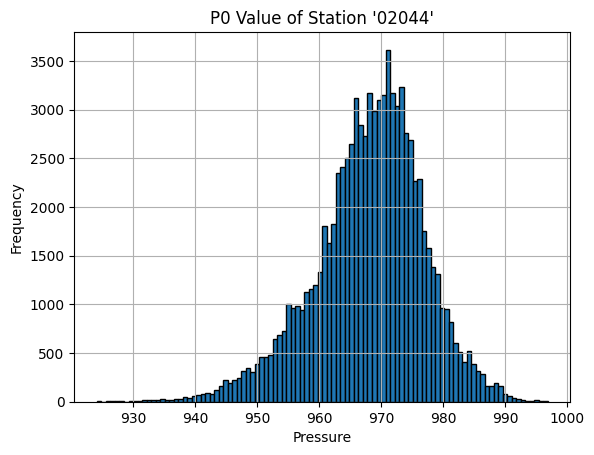

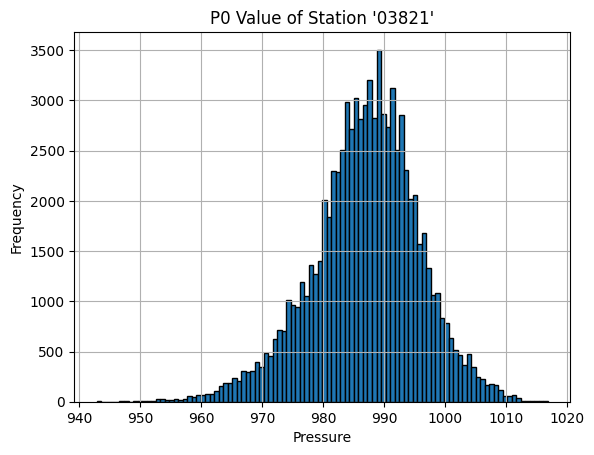

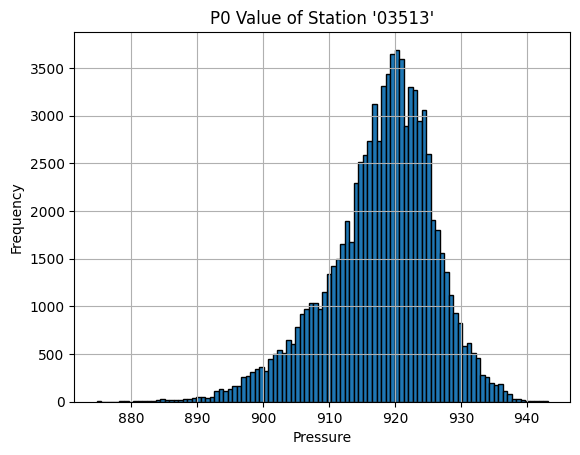

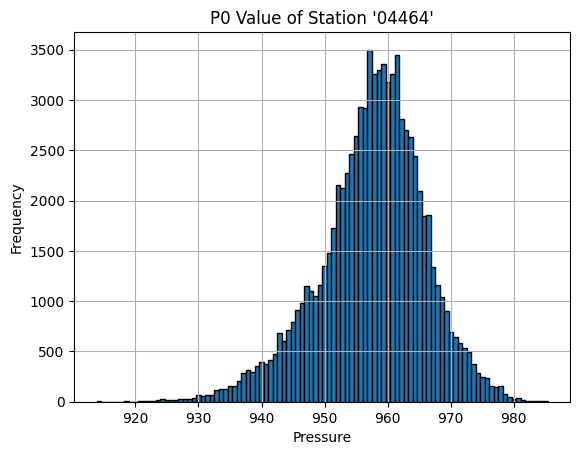

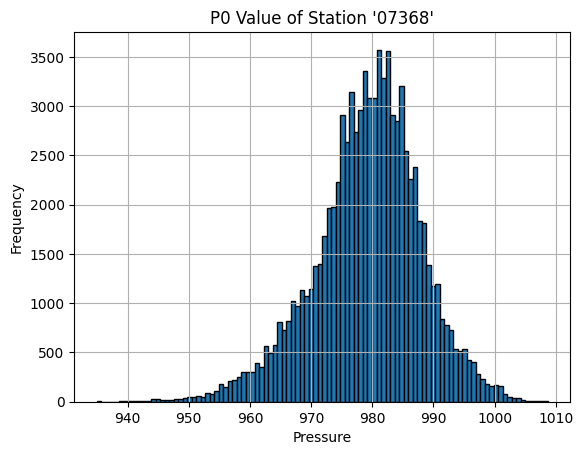

In [101]:
#PO pro Station
for key, data in stationDataDictionary.items():
    plt.hist(data["  P0"], bins=100, edgecolor='black')
    plt.title(f"P0 Value of Station '{key}'")
    plt.xlabel("Pressure")
    plt.ylabel("Frequency")
    plt.grid(True)
    plt.show()

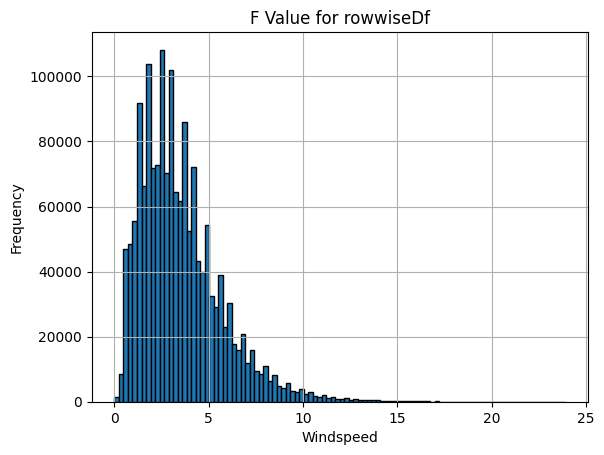

In [102]:
#F für rowwisDf
plt.hist(rowwiseDf["   F"], bins=100, edgecolor='black')
plt.title("F Value for rowwiseDf")
plt.xlabel("Windspeed")
plt.ylabel("Frequency")
plt.grid(True)

plt.savefig("../results/F_Values.png", dpi=300, bbox_inches="tight")
plt.show()
plt.close()

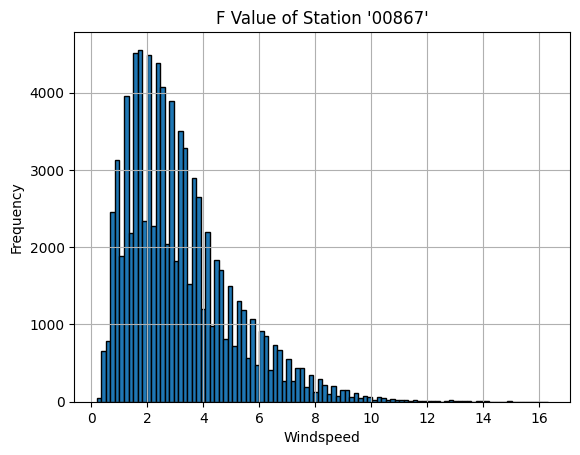

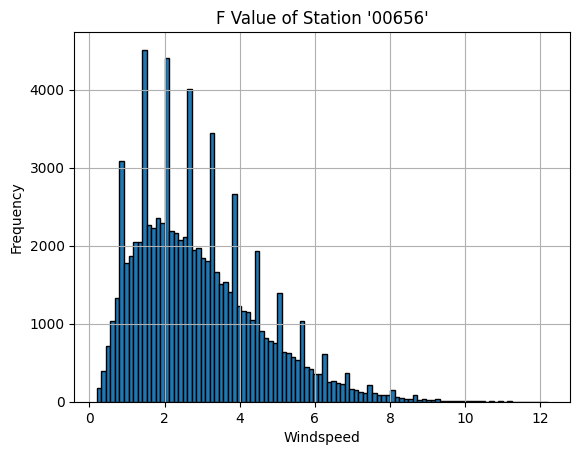

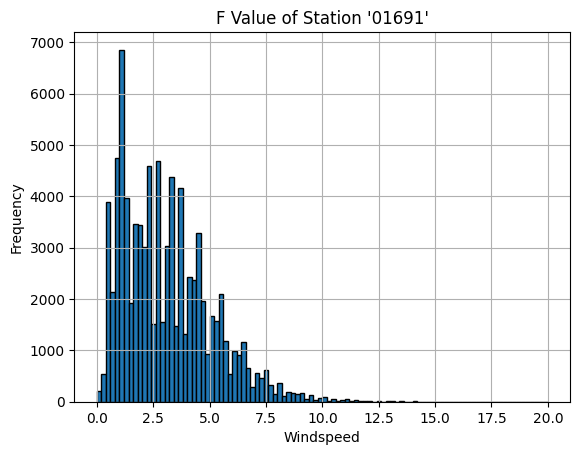

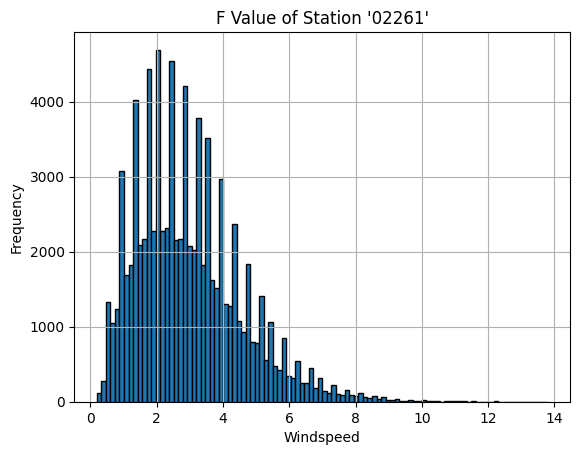

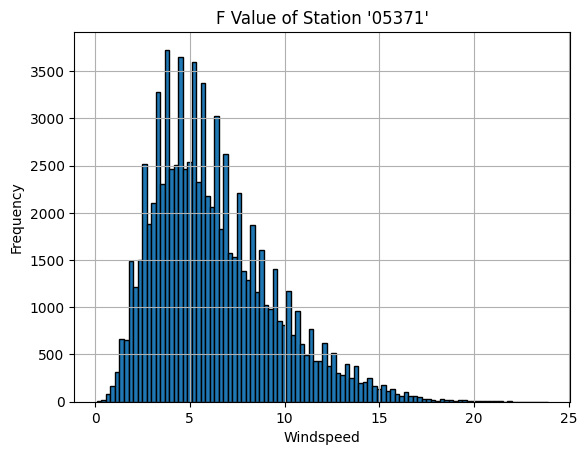

...

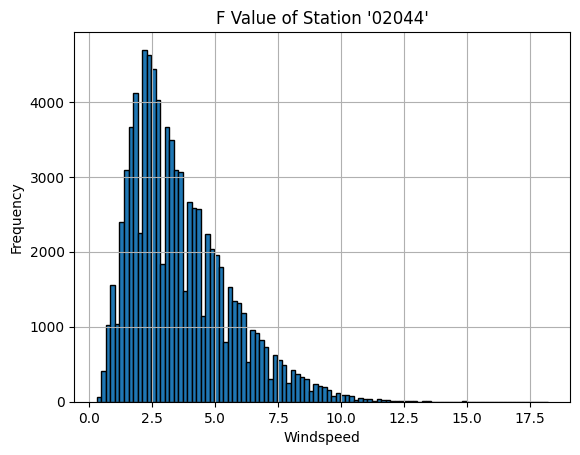

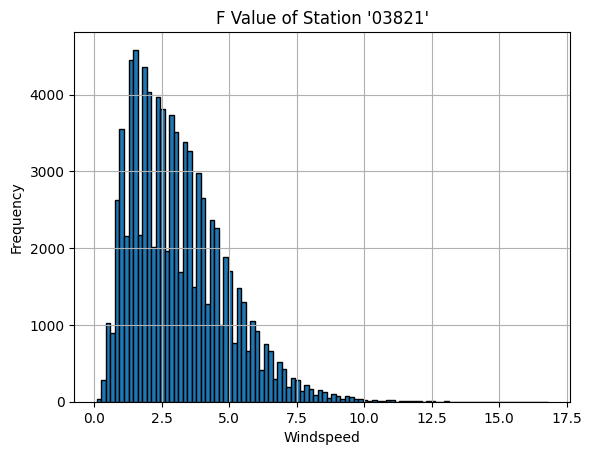

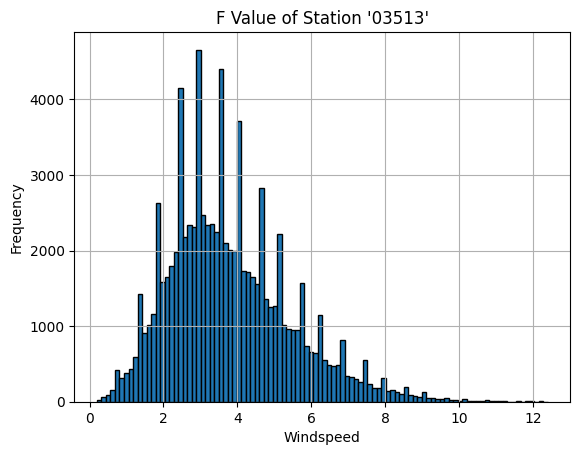

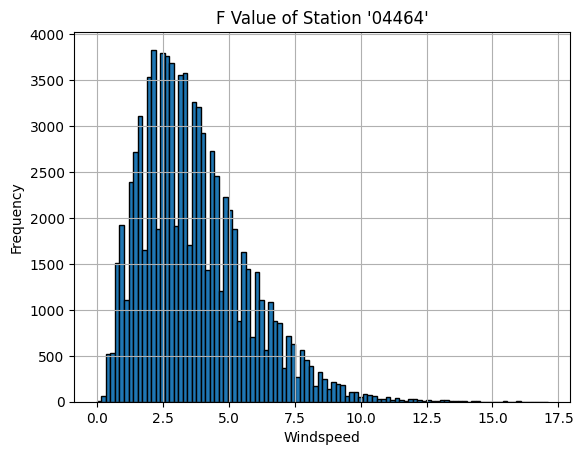

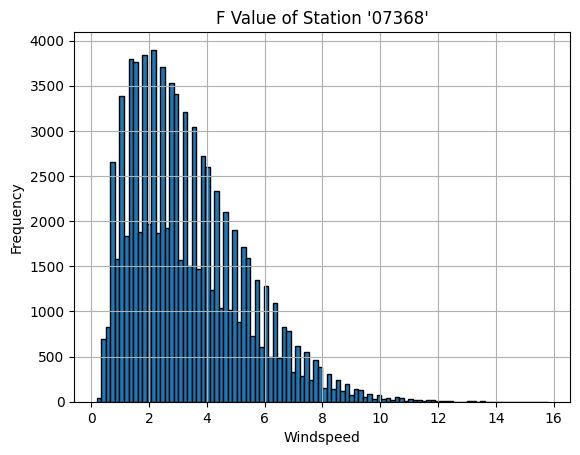

In [103]:
#F pro Station
for key, data in stationDataDictionary.items():
    plt.hist(data["   F"], bins=100, edgecolor='black')
    plt.title(f"F Value of Station '{key}'")
    plt.xlabel("Windspeed")
    plt.ylabel("Frequency")
    plt.grid(True)
    plt.show()

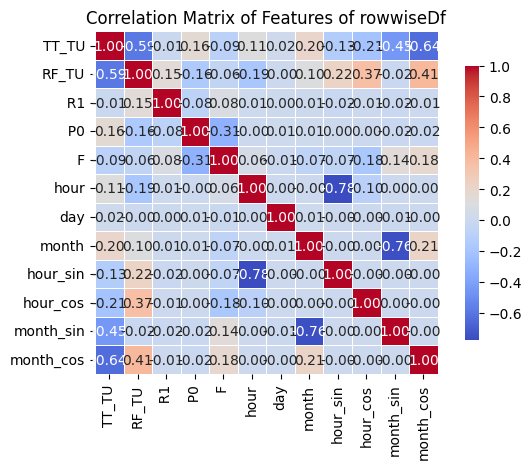

In [104]:
#Heatmaps der Verschieden Parameter für rowwiseDf
sns.heatmap(rowwiseDf[["TT_TU", "RF_TU", "  R1", "  P0", "   F", "hour", "day", "month", "hour_sin", "hour_cos", "month_sin", "month_cos"]].corr(), cmap="coolwarm", annot=True, fmt=".2f", square=True,
        cbar_kws={"shrink": 0.8}, linewidths=0.5)

plt.title("Correlation Matrix of Features of rowwiseDf")
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()

plt.savefig("../results/Corr.png", dpi=300, bbox_inches="tight")
plt.show()
plt.close()

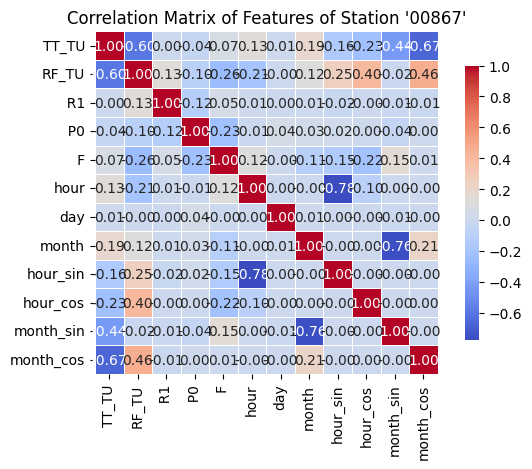

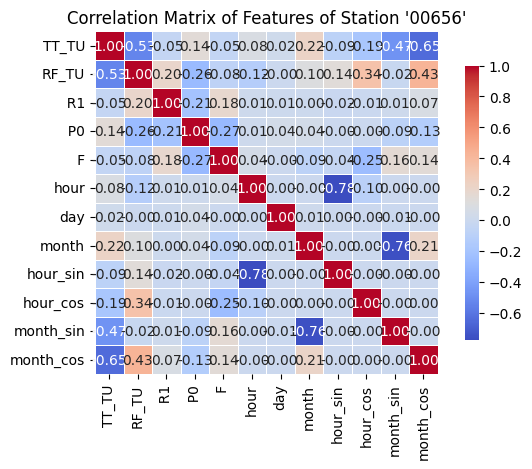

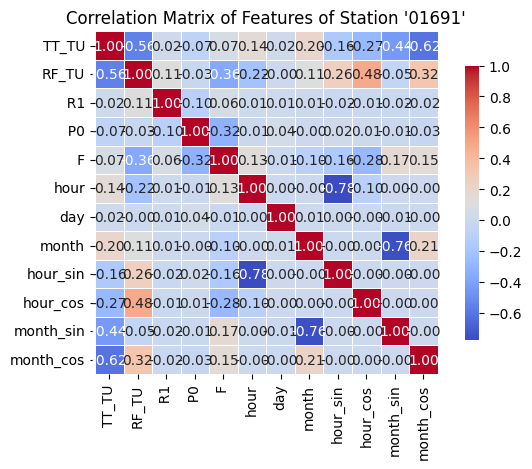

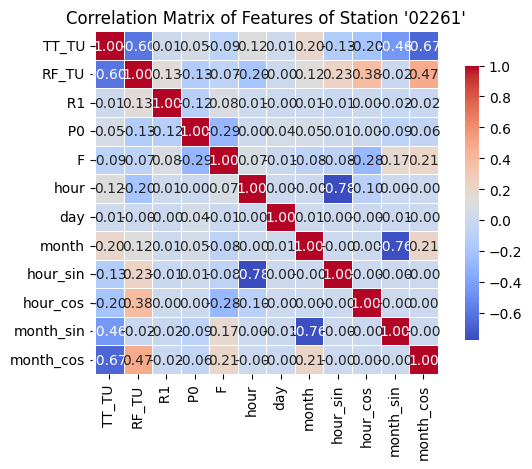

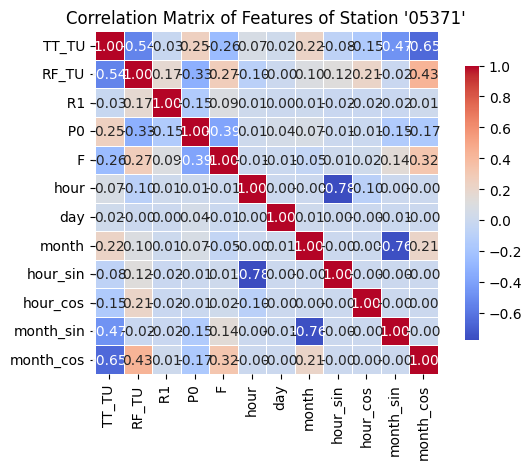

...

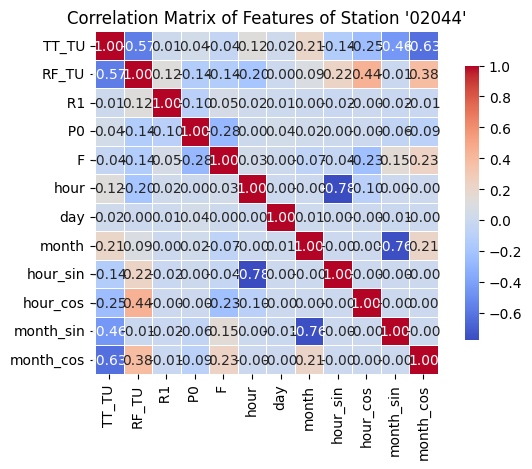

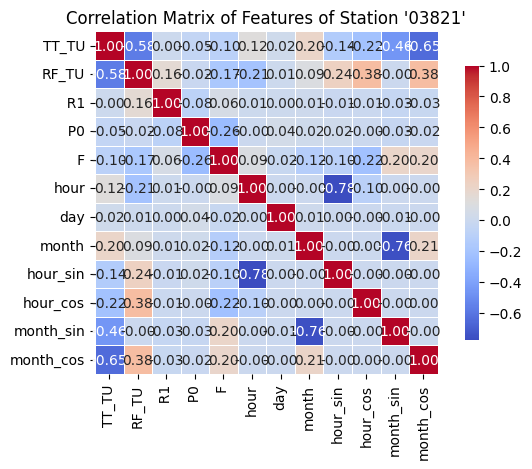

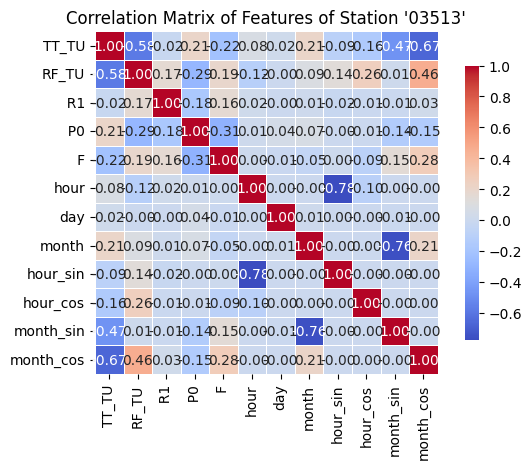

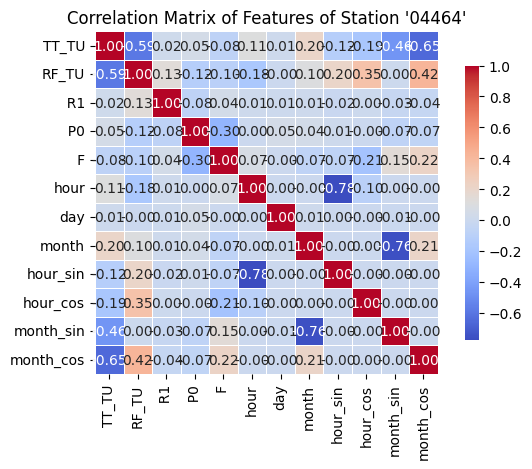

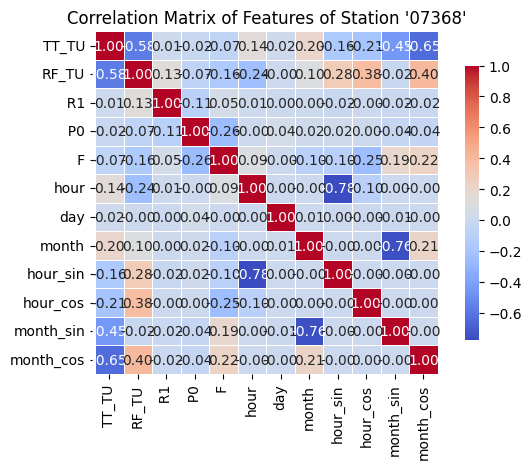

In [105]:
#Heatmaps der Verschieden Parameter pro Station
for key, data in stationDataDictionary.items():
    sns.heatmap(data[["TT_TU", "RF_TU", "  R1", "  P0", "   F", "hour", "day", "month", "hour_sin", "hour_cos", "month_sin", "month_cos"]].corr(), cmap="coolwarm", annot=True, fmt=".2f", square=True,
            cbar_kws={"shrink": 0.8}, linewidths=0.5)

    plt.title(f"Correlation Matrix of Features of Station '{key}'")
    plt.xticks(rotation=90)
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

In [106]:
#Zeitanalyse

In [107]:
#Stundenanalyse

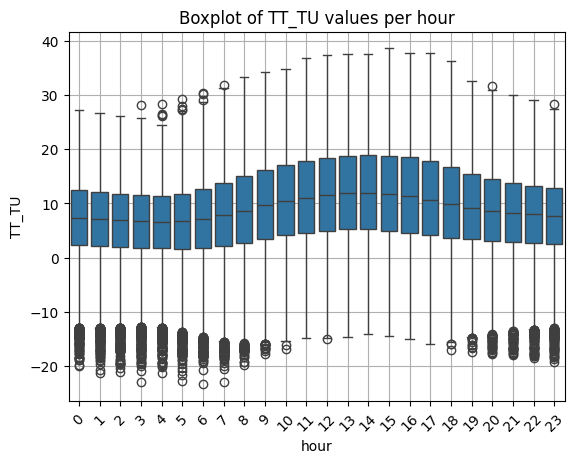

In [108]:
#Stundenanalyse TT_TU Boxplot für rowwiseDf
sns.boxplot(data= rowwiseDf, x= 'hour', y= 'TT_TU')
plt.title("Boxplot of TT_TU values per hour")
plt.xticks(rotation=45)
plt.grid(True)

plt.savefig("../results/TT_TU_hourly.png", dpi=300, bbox_inches="tight")
plt.show()
plt.close()

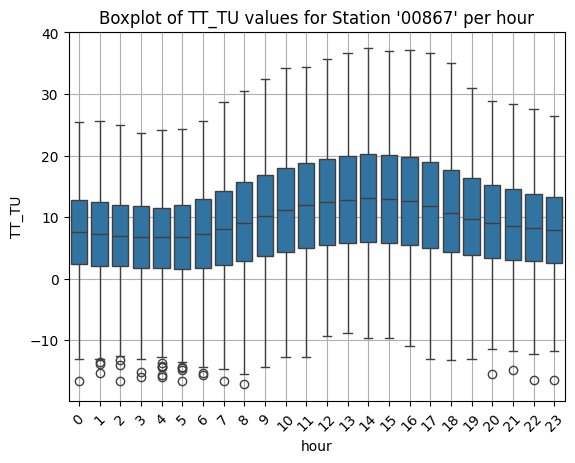

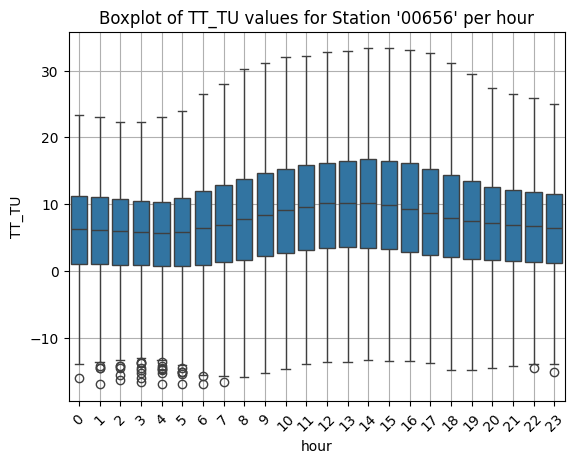

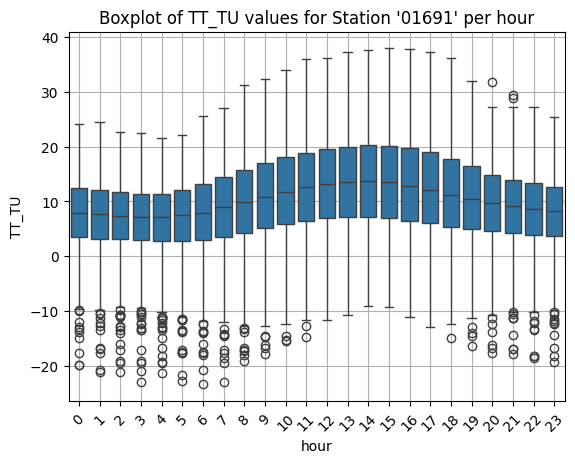

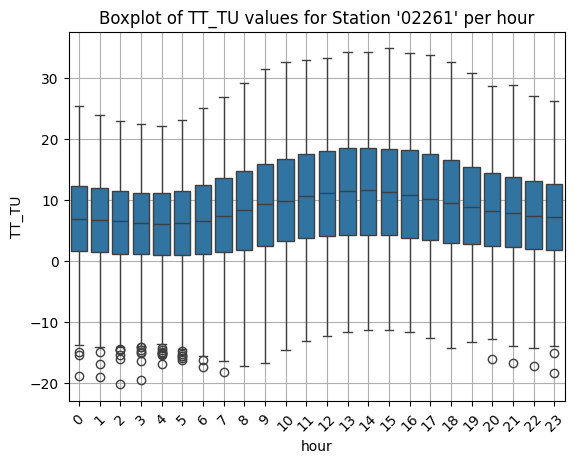

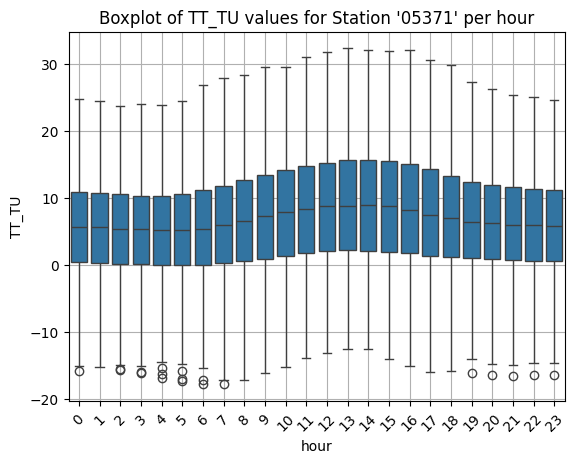

...

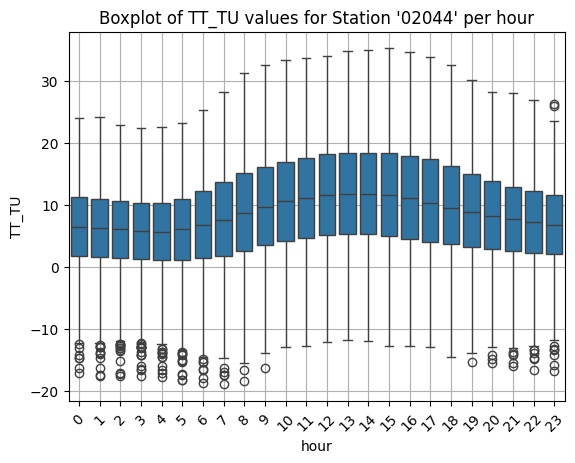

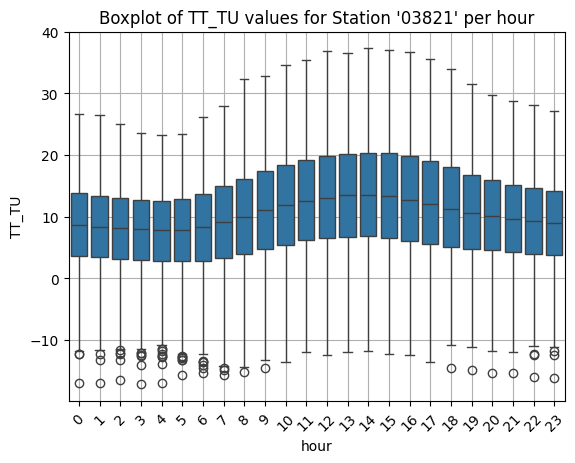

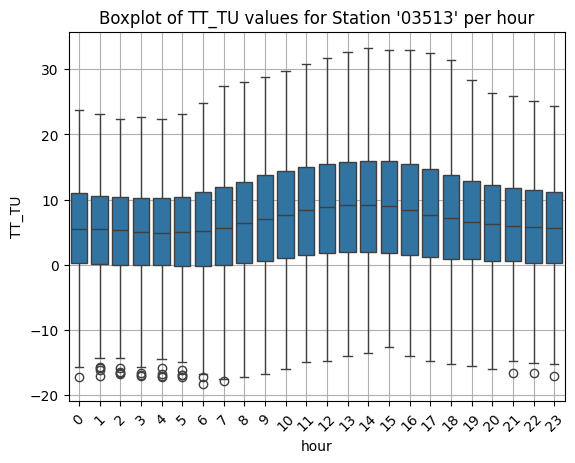

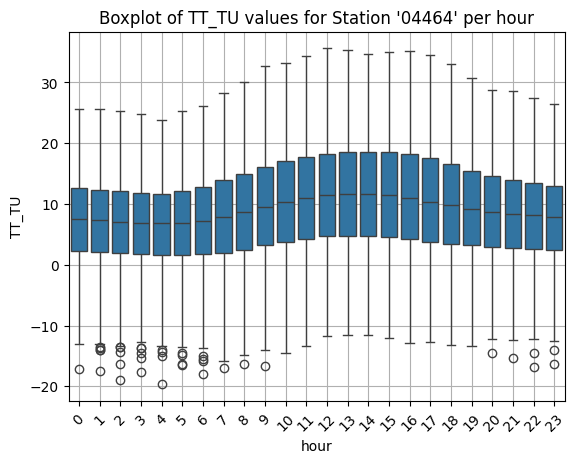

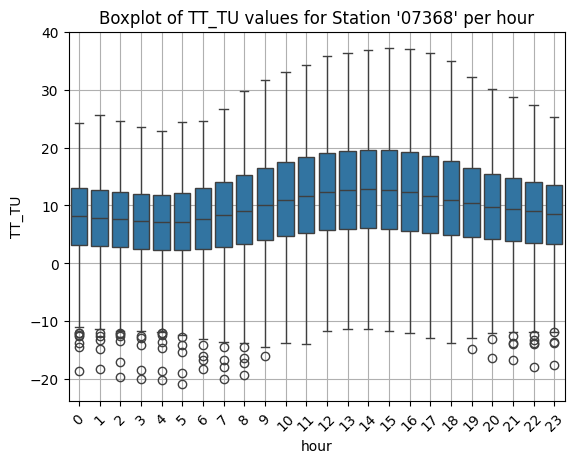

In [109]:
#Stundenanalyse TT_TU Boxplot pro Station
for key, tmpDf in stationDataDictionary.items():
    sns.boxplot(data= tmpDf, x= 'hour', y= 'TT_TU')
    plt.title(f"Boxplot of TT_TU values for Station '{key}' per hour")
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.show()

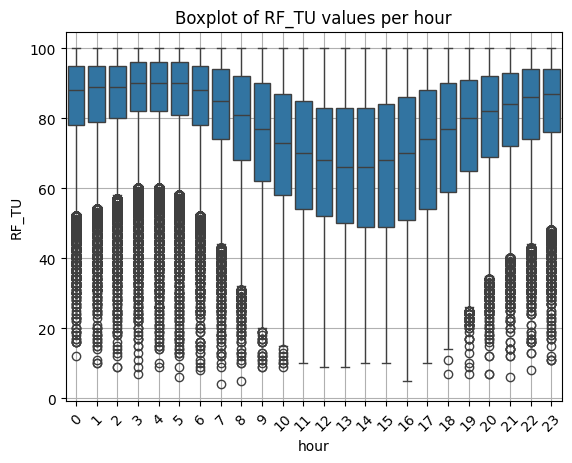

In [110]:
#Stundenanalyse RF_TU Boxplot für rowwiseDf
sns.boxplot(data= rowwiseDf, x= 'hour', y= 'RF_TU')
plt.title("Boxplot of RF_TU values per hour")
plt.xticks(rotation=45)
plt.grid(True)

plt.savefig("../results/RF_TU_hourly.png", dpi=300, bbox_inches="tight")
plt.show()
plt.close()

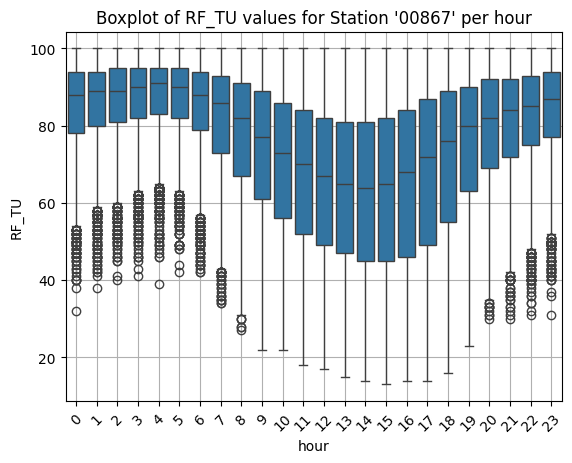

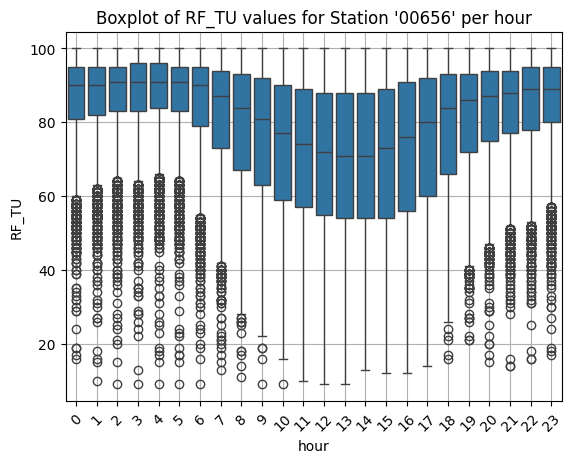

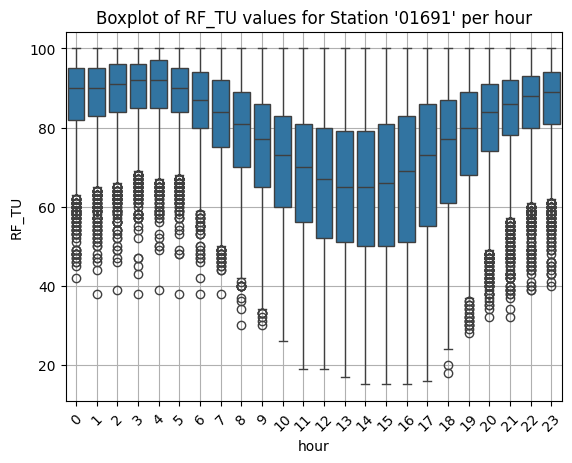

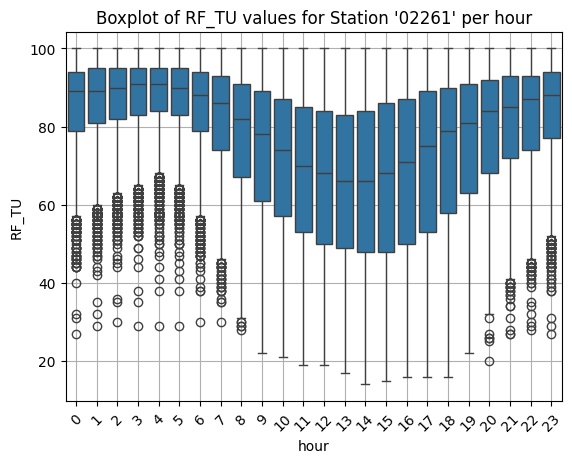

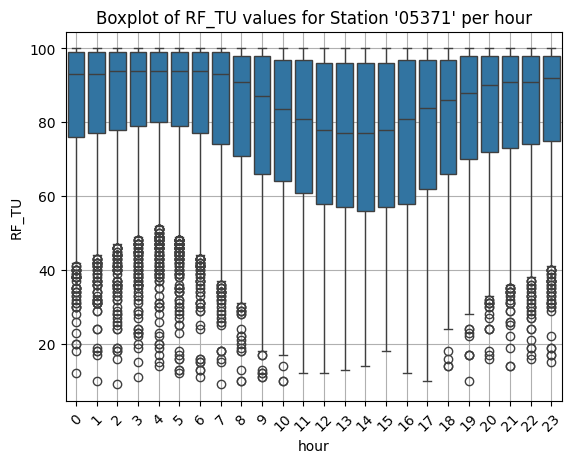

...

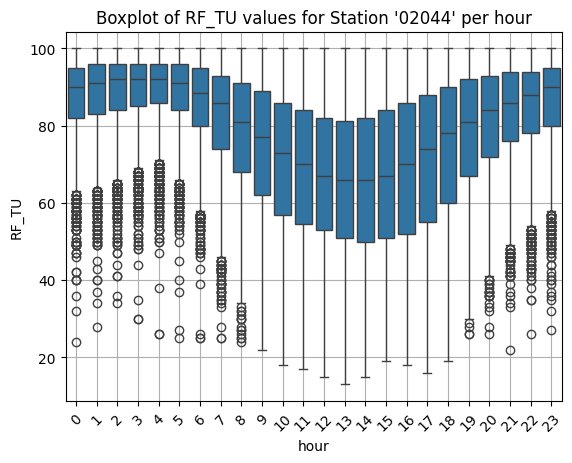

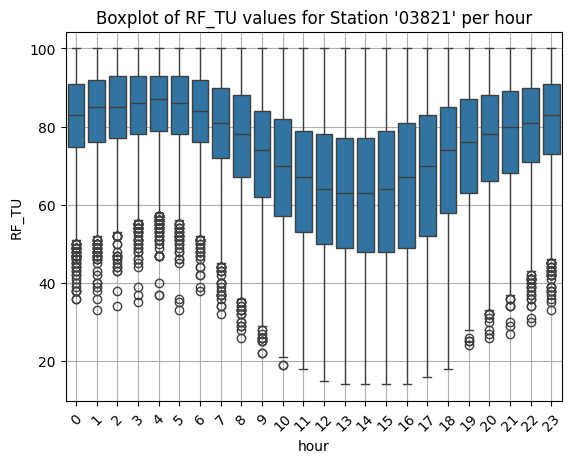

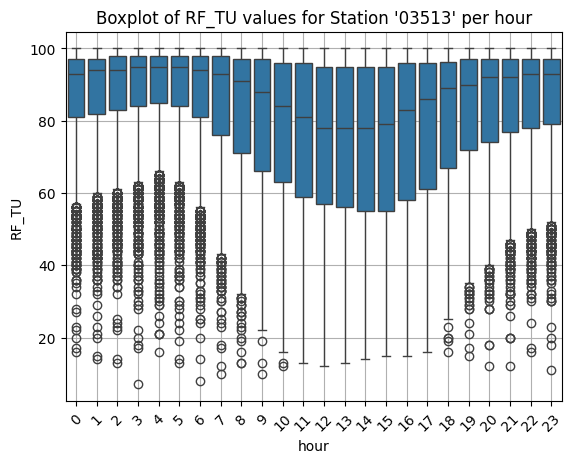

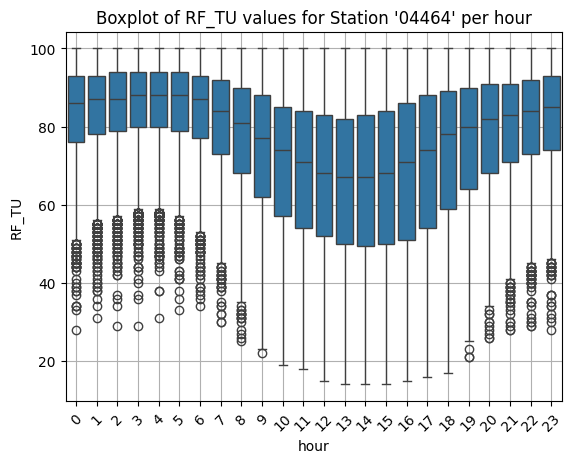

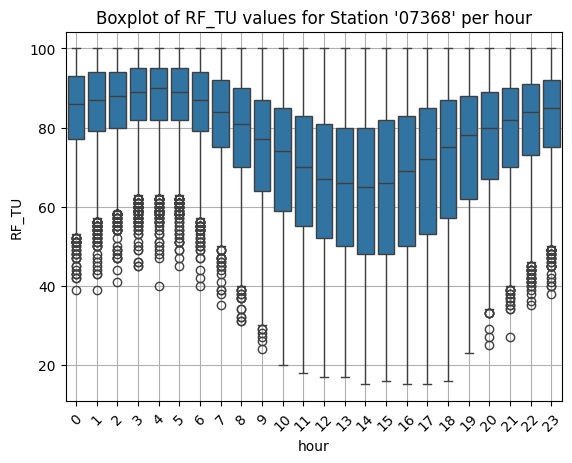

In [111]:
#Stundenanalyse RF_TU Boxplot pro Station
for key, tmpDf in stationDataDictionary.items():
    sns.boxplot(data= tmpDf, x= 'hour', y= 'RF_TU')
    plt.title(f"Boxplot of RF_TU values for Station '{key}' per hour")
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.show()

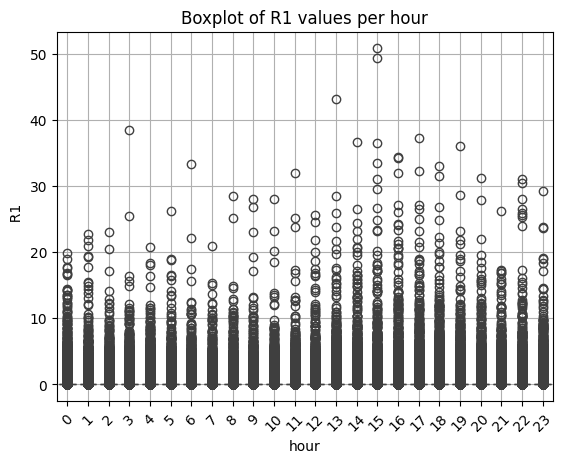

In [112]:
#Stundenanalyse R1 Boxplot für rowwiseDf
sns.boxplot(data= rowwiseDf, x= 'hour', y= '  R1')
plt.title("Boxplot of R1 values per hour")
plt.xticks(rotation=45)
plt.grid(True)

plt.savefig("../results/R1_hourly.png", dpi=300, bbox_inches="tight")
plt.show()
plt.close()

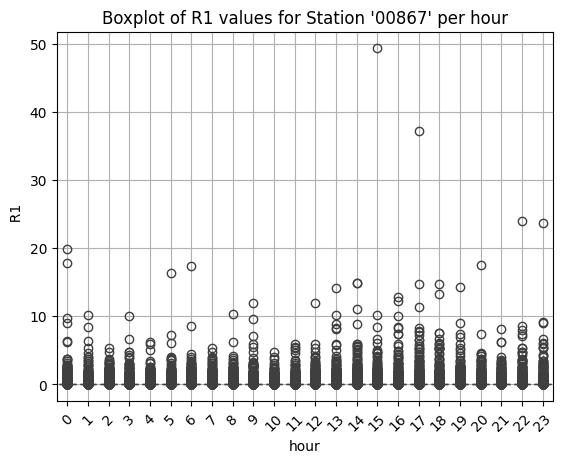

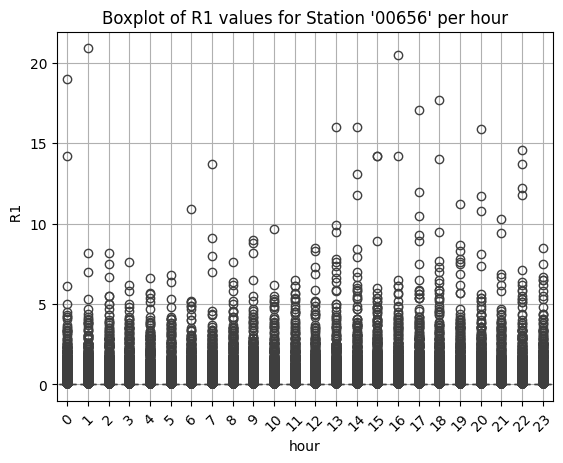

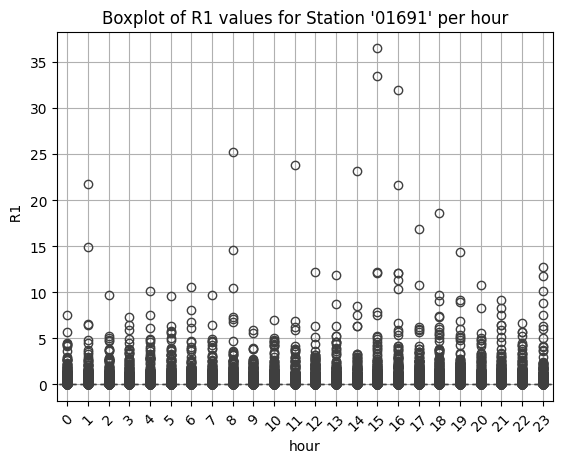

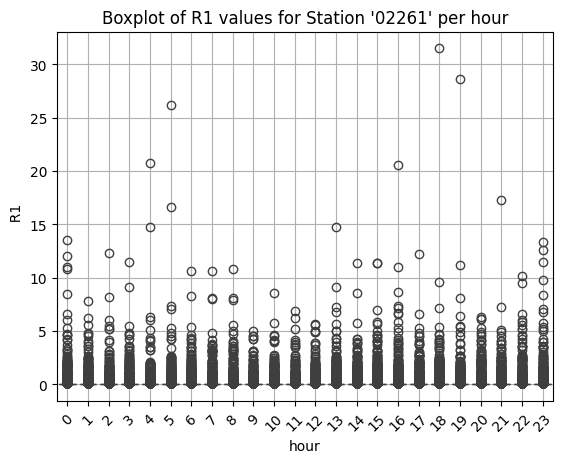

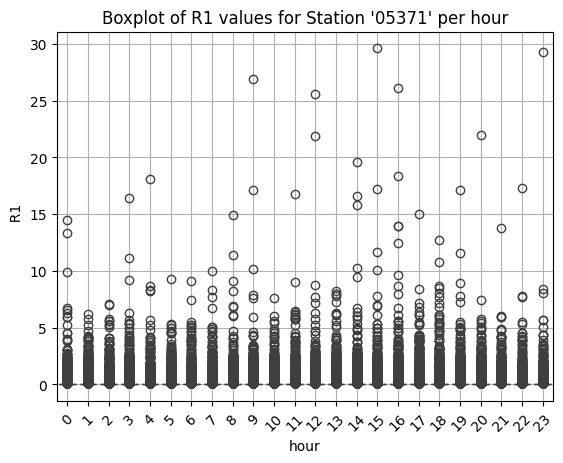

...

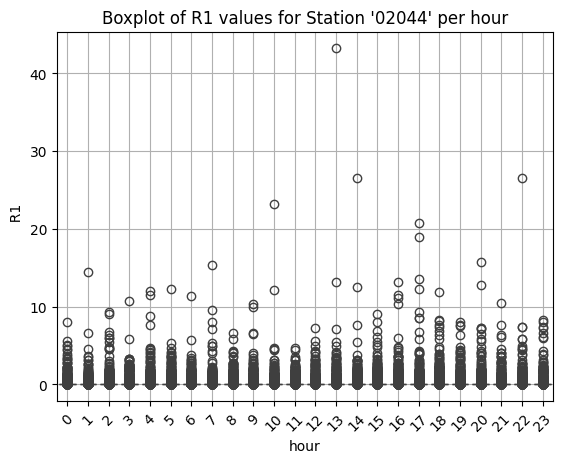

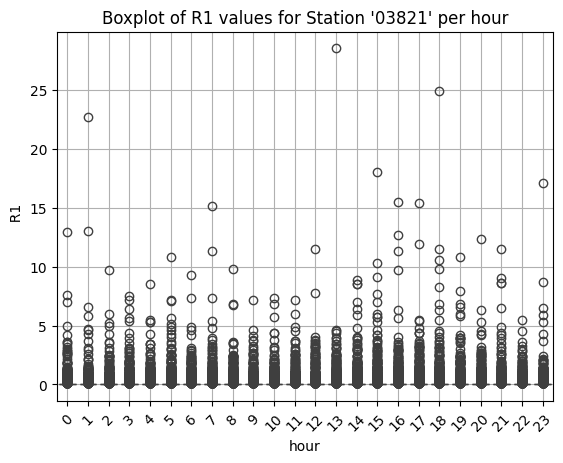

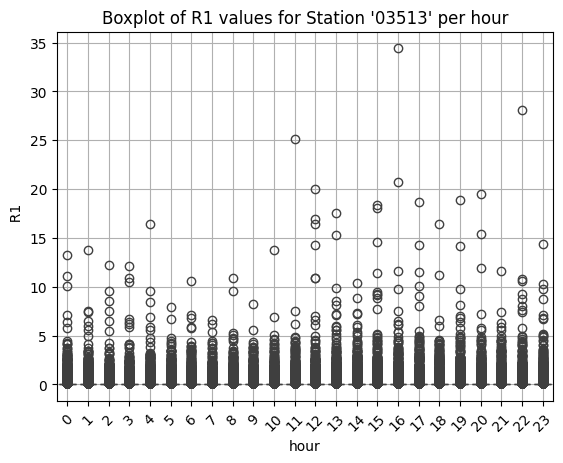

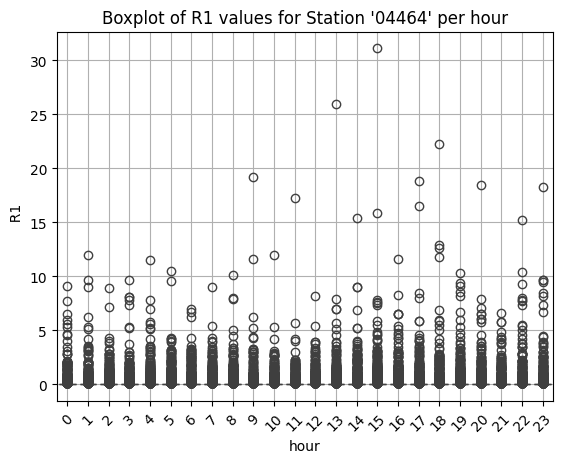

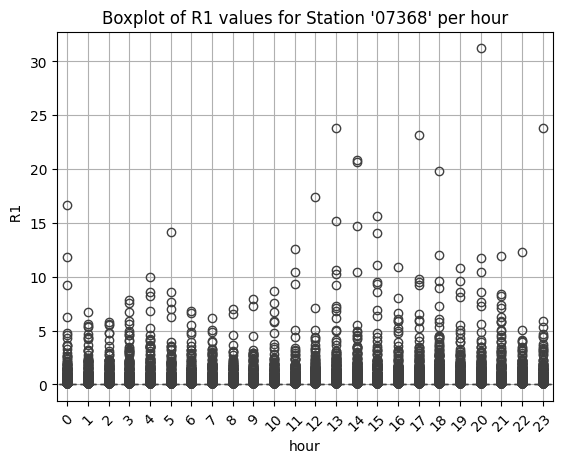

In [113]:
#Stundenanalyse R1 Boxplot pro Station
for key, tmpDf in stationDataDictionary.items():
    sns.boxplot(data= tmpDf, x= 'hour', y= '  R1')
    plt.title(f"Boxplot of R1 values for Station '{key}' per hour")
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.show()

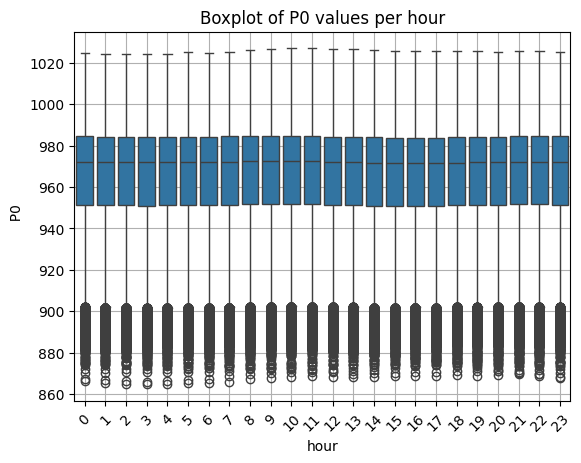

In [ ]:
#Stundenanalyse P0 Boxplot für rowwiseDf
sns.boxplot(data= rowwiseDf, x= 'hour', y= '  P0')
plt.title("Boxplot of P0 values per hour")
plt.xticks(rotation=45)
plt.grid(True)

plt.savefig("../results/P0_hourly.png", dpi=300, bbox_inches="tight")
plt.show()
plt.close()

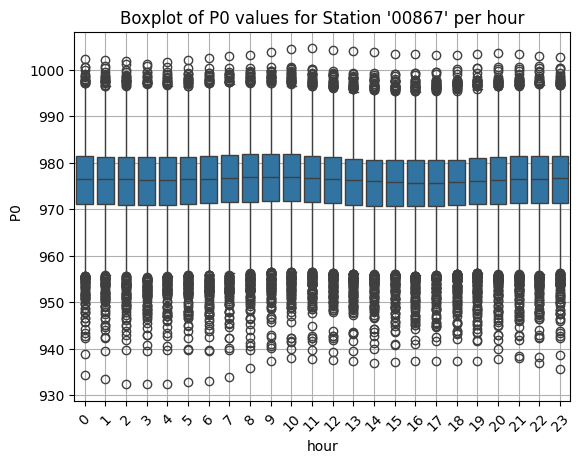

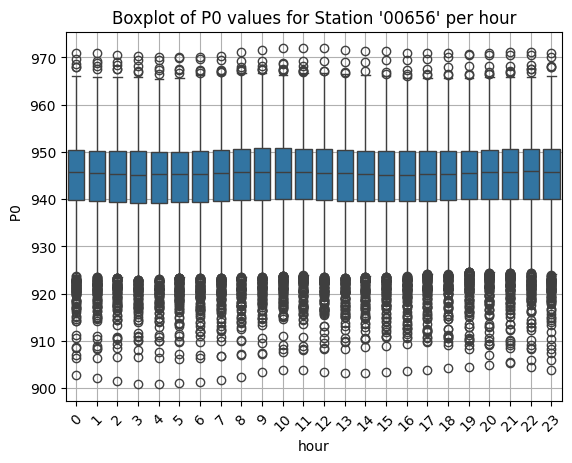

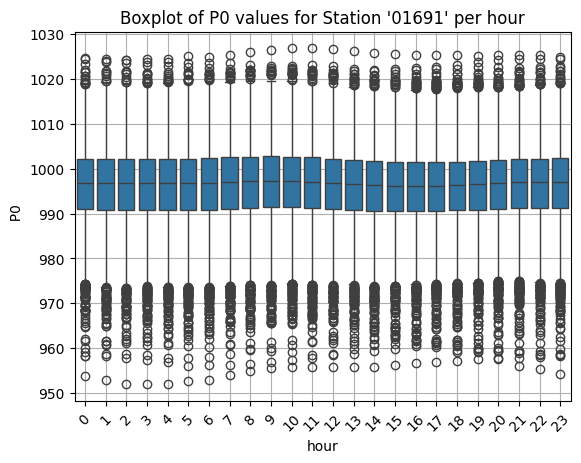

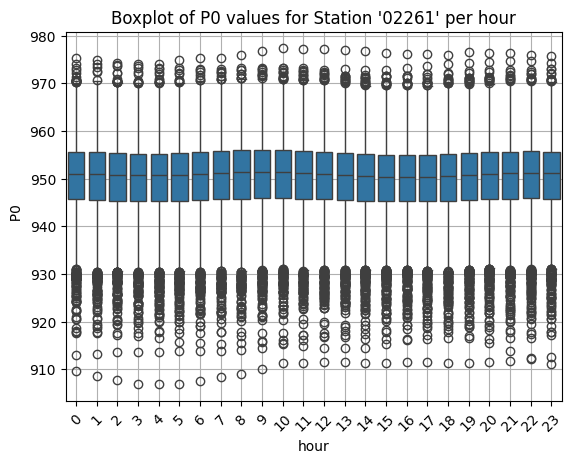

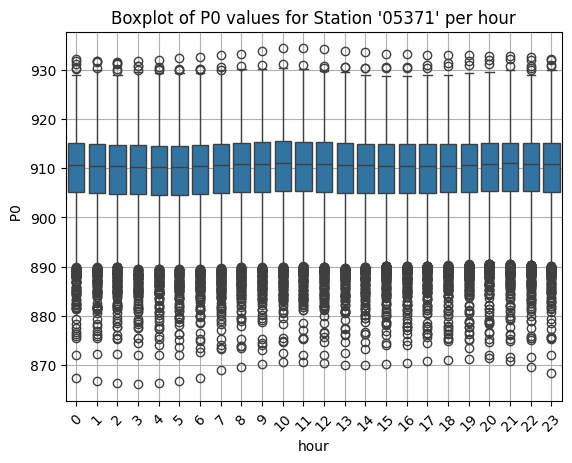

...

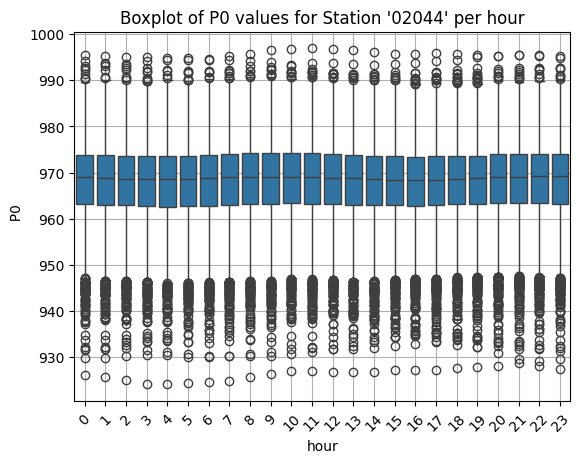

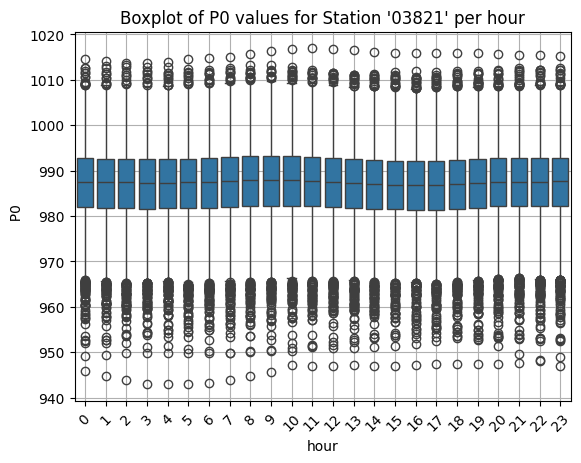

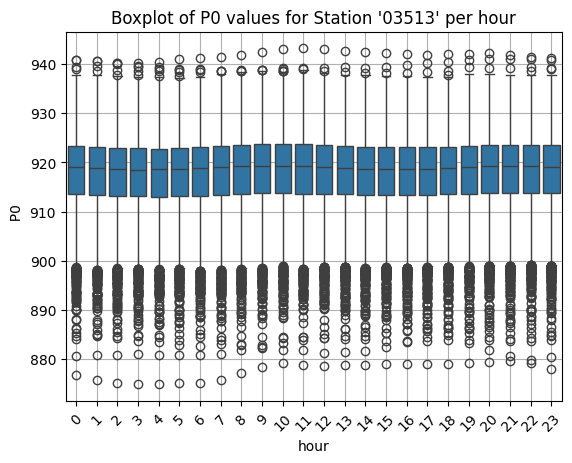

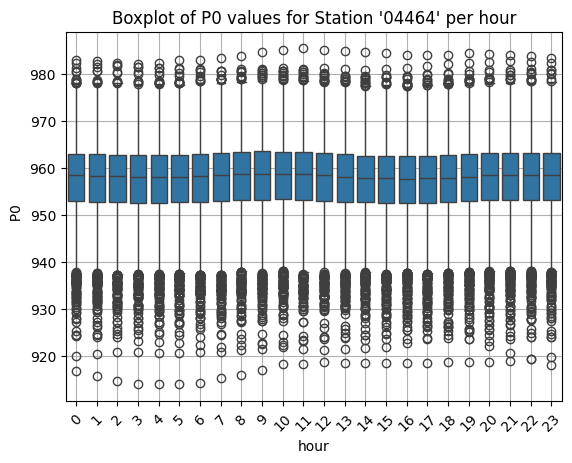

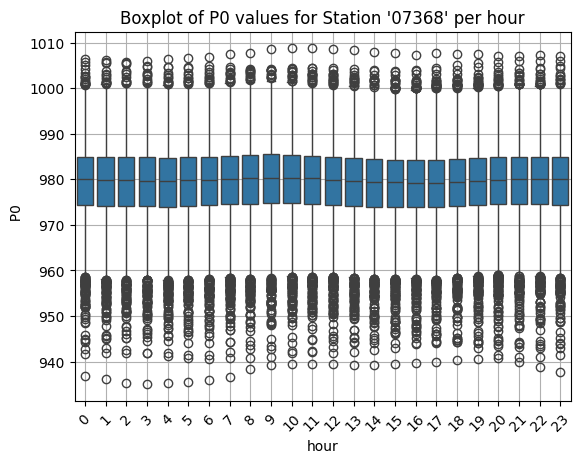

In [115]:
#Stundenanalyse P0 Boxplot pro Station
for key, tmpDf in stationDataDictionary.items():
    sns.boxplot(data= tmpDf, x= 'hour', y= '  P0')
    plt.title(f"Boxplot of P0 values for Station '{key}' per hour")
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.show()

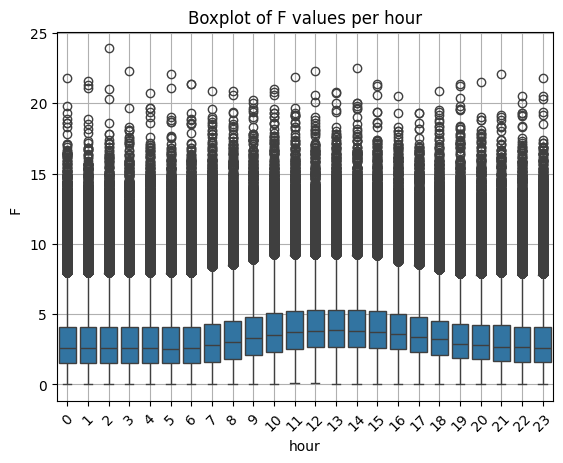

In [116]:
#Stundenanalyse F Boxplot für rowwiseDf
sns.boxplot(data= rowwiseDf, x= 'hour', y= '   F')
plt.title("Boxplot of F values per hour")
plt.xticks(rotation=45)
plt.grid(True)

plt.savefig("../results/F_hourly.png", dpi=300, bbox_inches="tight")
plt.show()
plt.close()

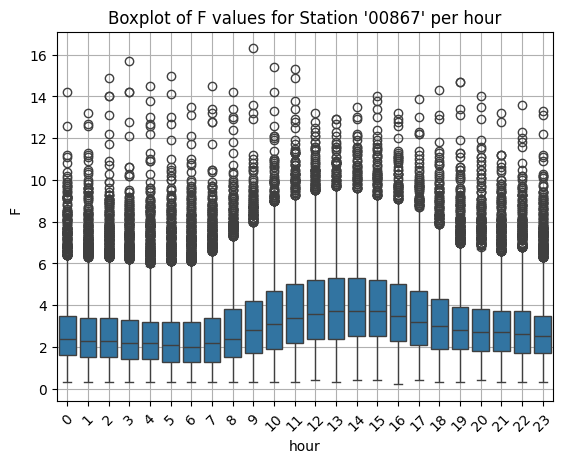

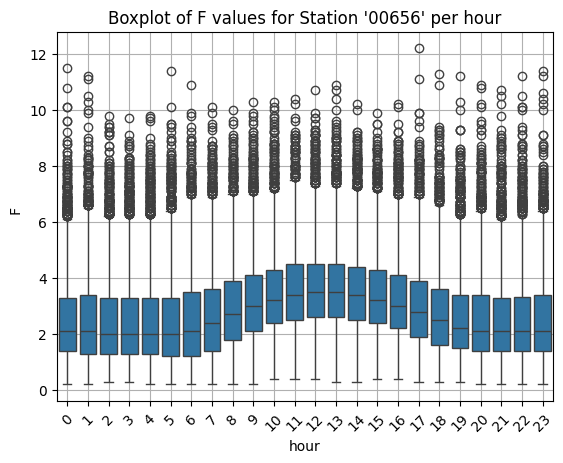

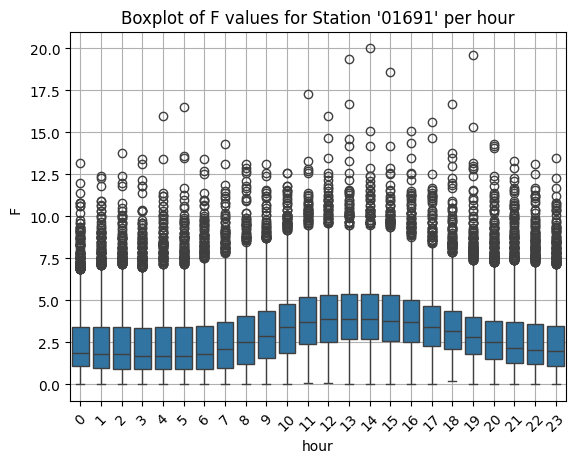

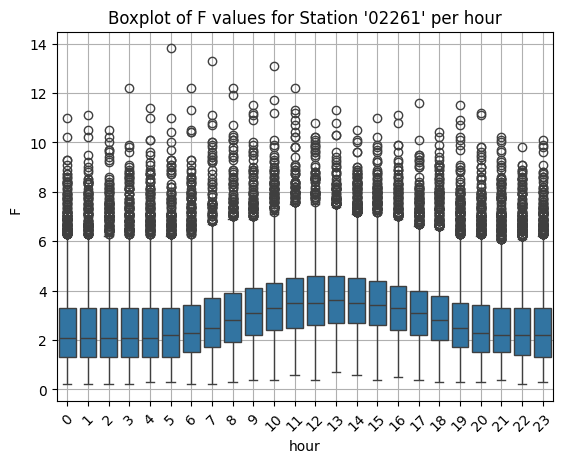

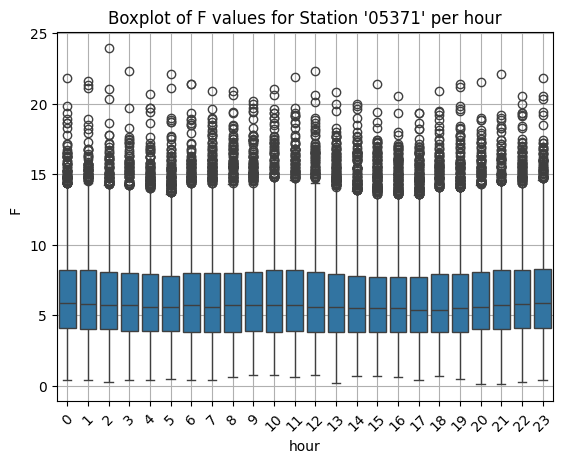

...

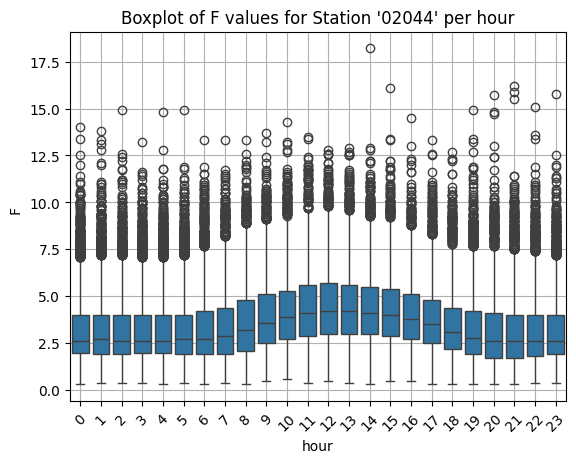

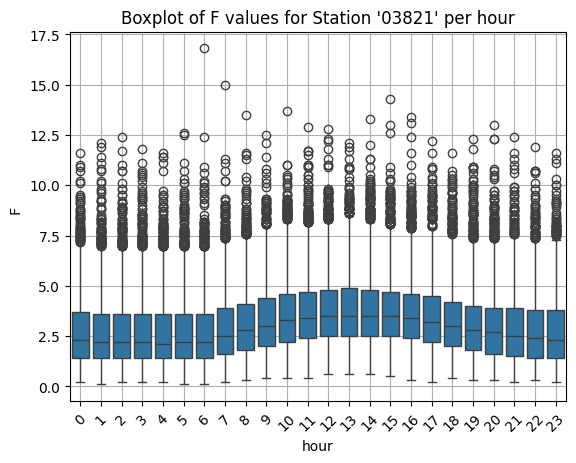

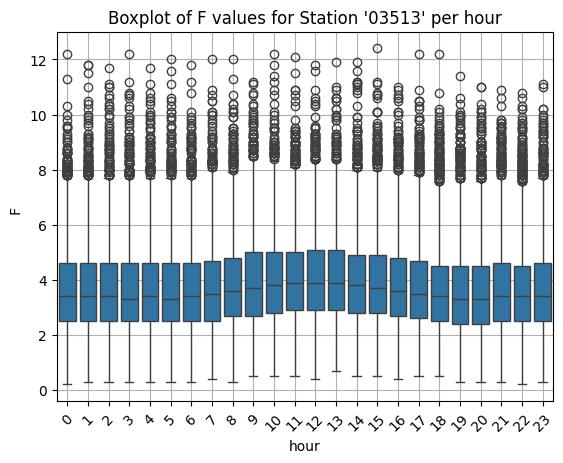

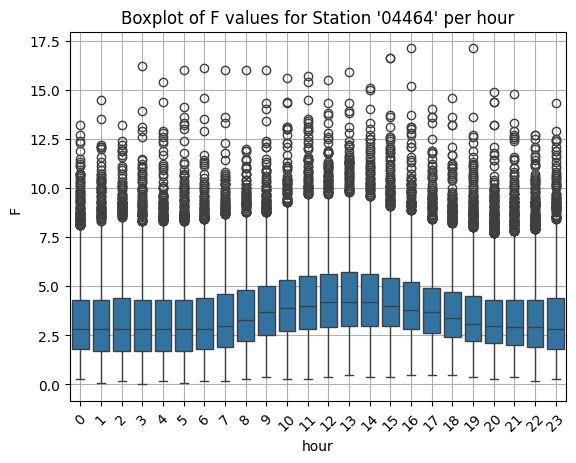

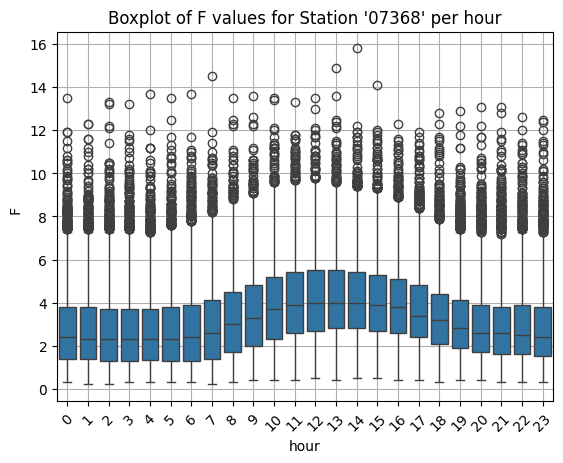

In [117]:
#Stundenanalyse F Boxplot pro Station
for key, tmpDf in stationDataDictionary.items():
    sns.boxplot(data= tmpDf, x= 'hour', y= '   F')
    plt.title(f"Boxplot of F values for Station '{key}' per hour")
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.show()

In [118]:
#Tagesanalyse

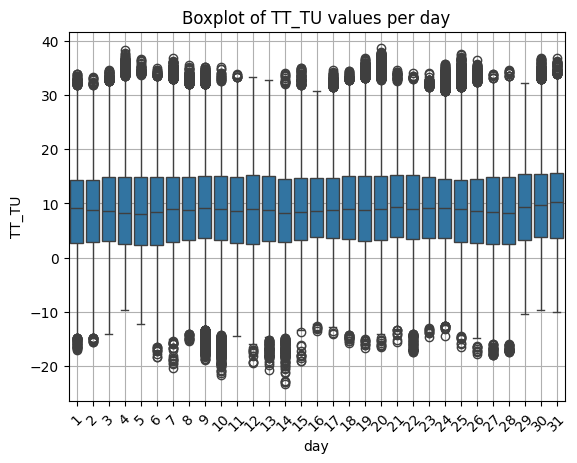

In [119]:
#Tagesanalyse TT_TU Boxplot für rowwiseDf
sns.boxplot(data= rowwiseDf, x= 'day', y= 'TT_TU')
plt.title("Boxplot of TT_TU values per day")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

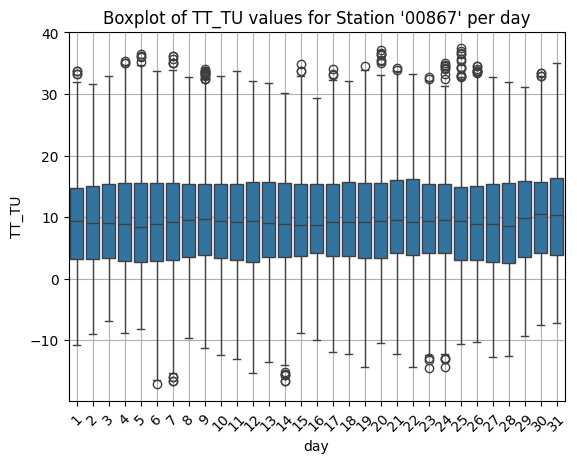

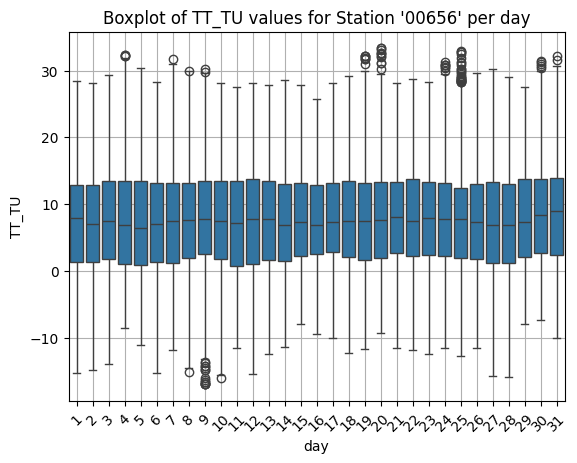

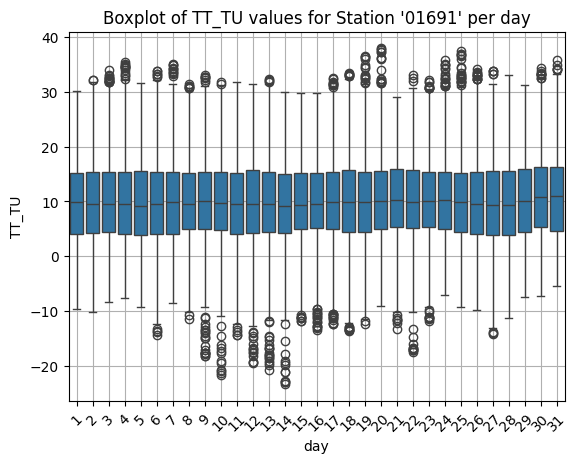

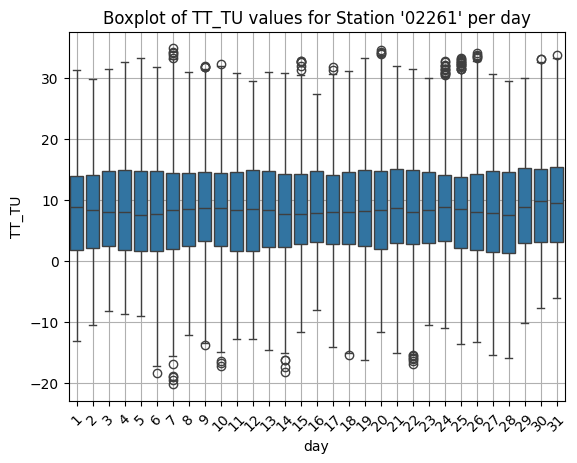

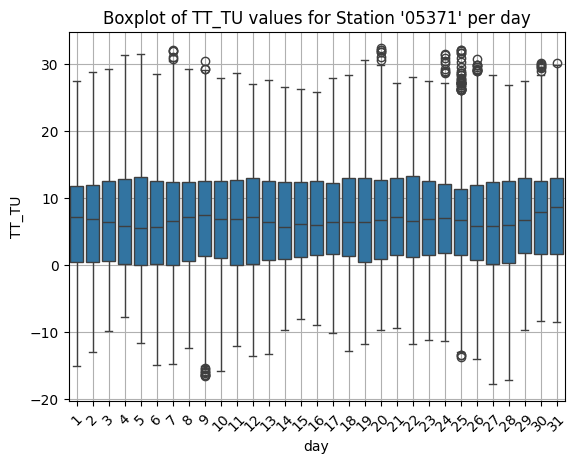

...

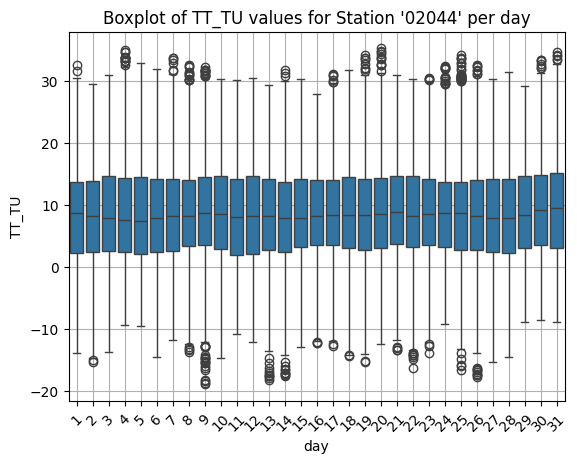

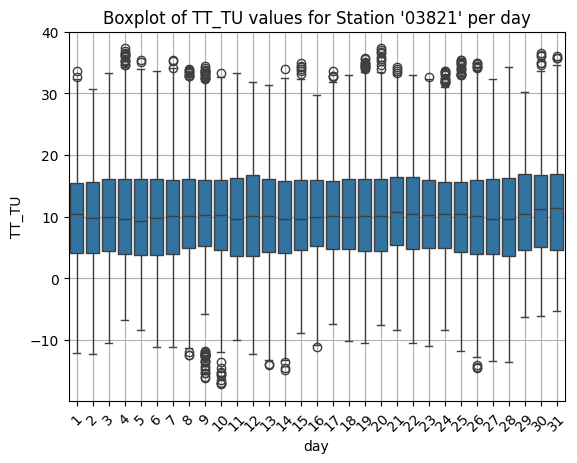

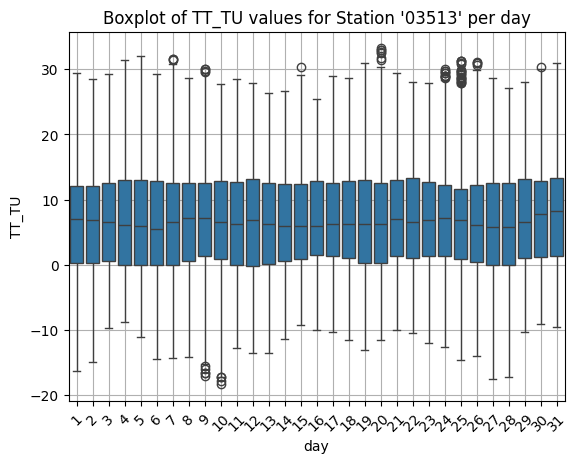

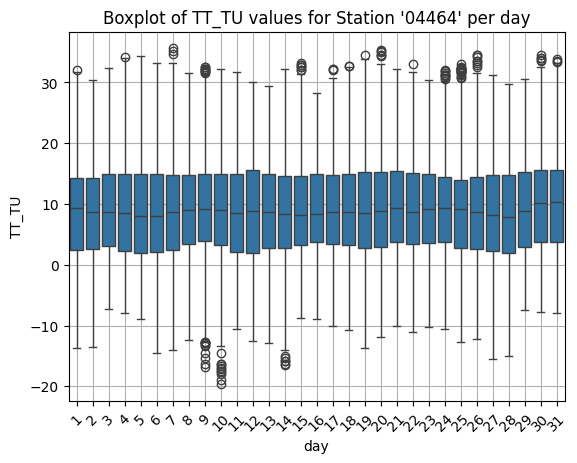

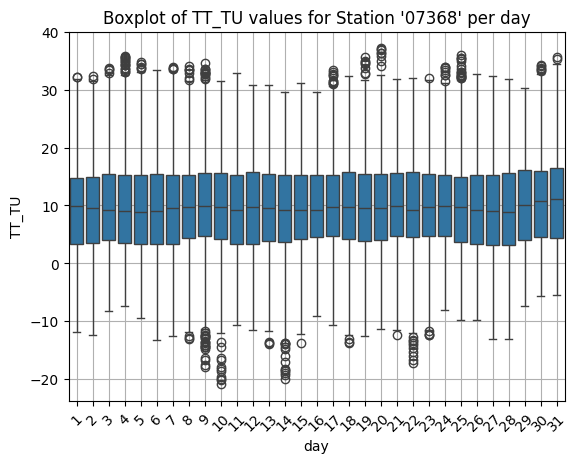

In [120]:
#Tagesanalyse TT_TU Boxplot pro Station
for key, tmpDf in stationDataDictionary.items():
    sns.boxplot(data= tmpDf, x= 'day', y= 'TT_TU')
    plt.title(f"Boxplot of TT_TU values for Station '{key}' per day")
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.show()

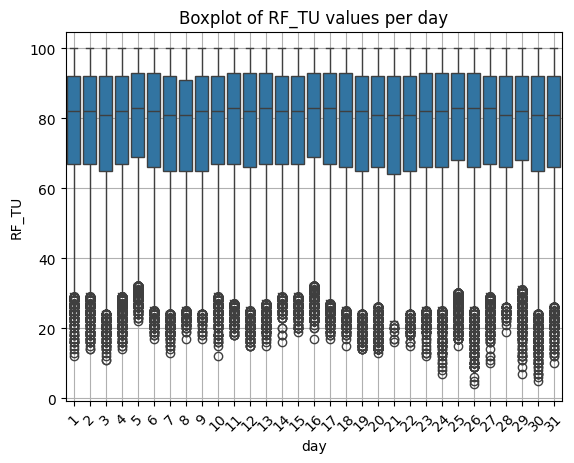

In [121]:
#Tagesanalyse RF_TU Boxplot für rowwiseDf
sns.boxplot(data= rowwiseDf, x= 'day', y= 'RF_TU')
plt.title("Boxplot of RF_TU values per day")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

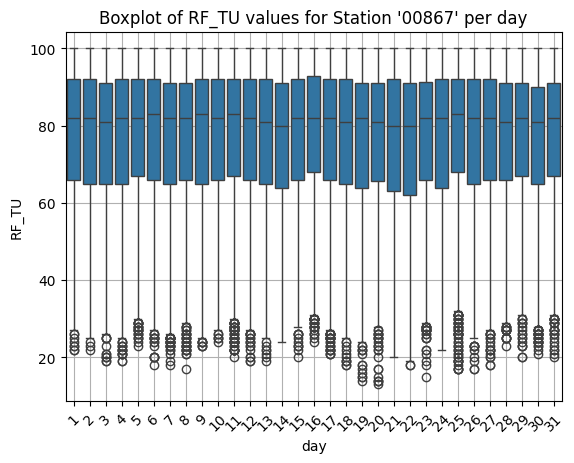

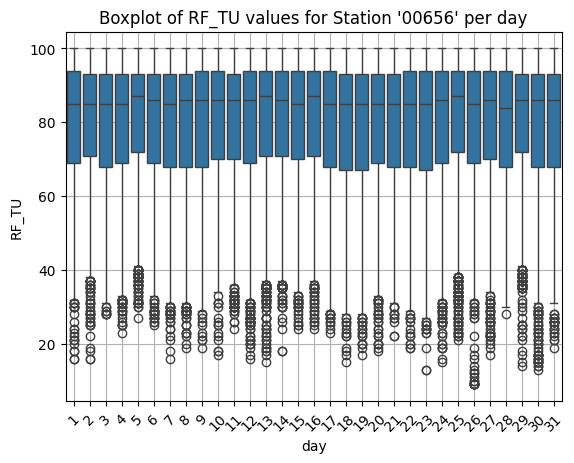

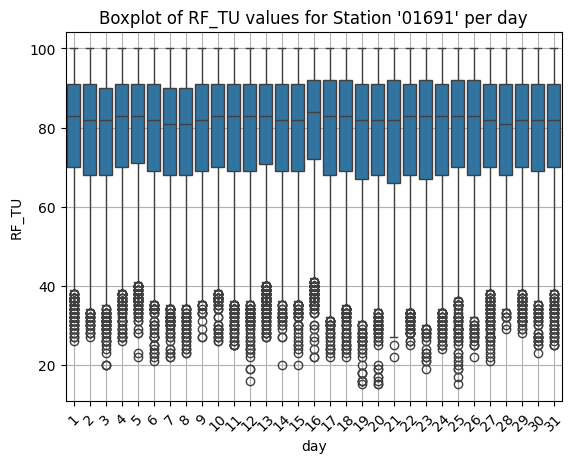

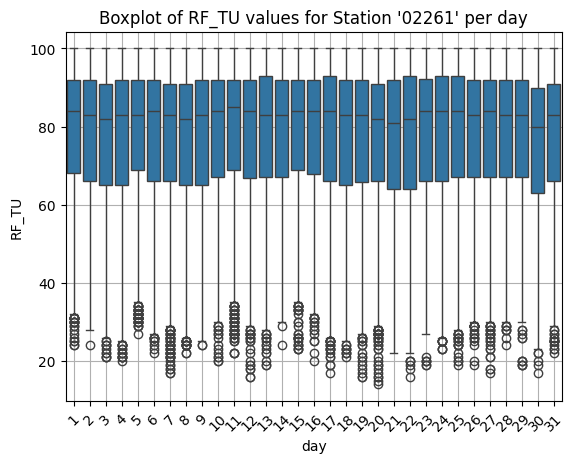

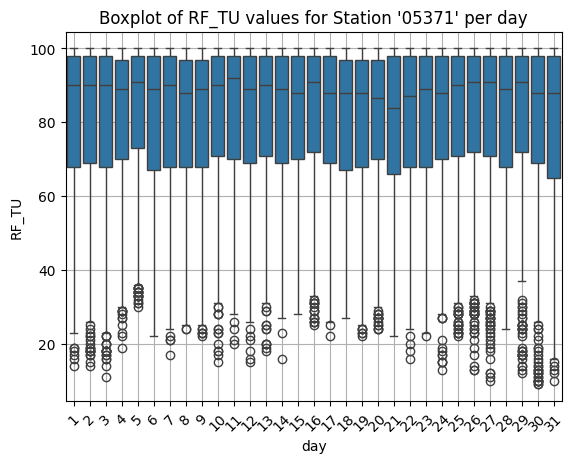

...

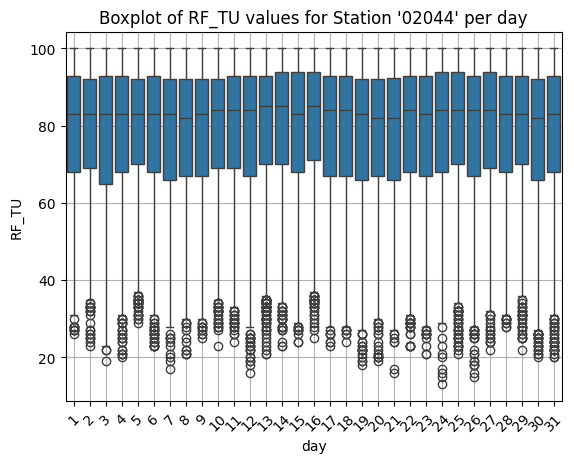

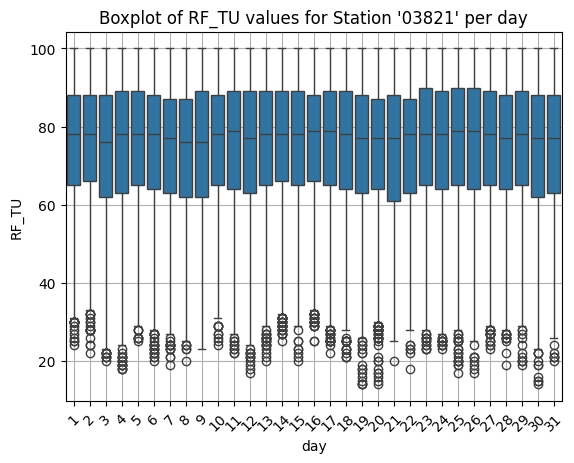

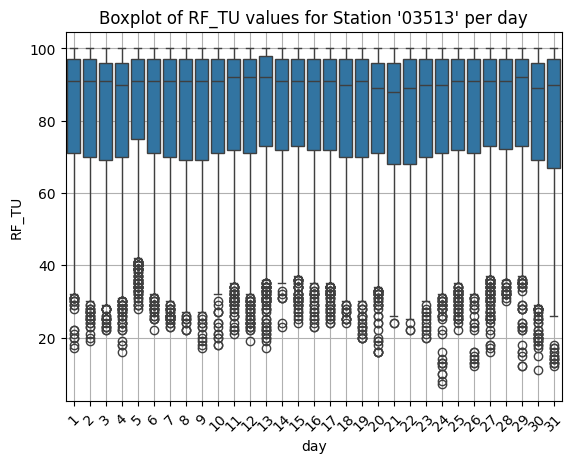

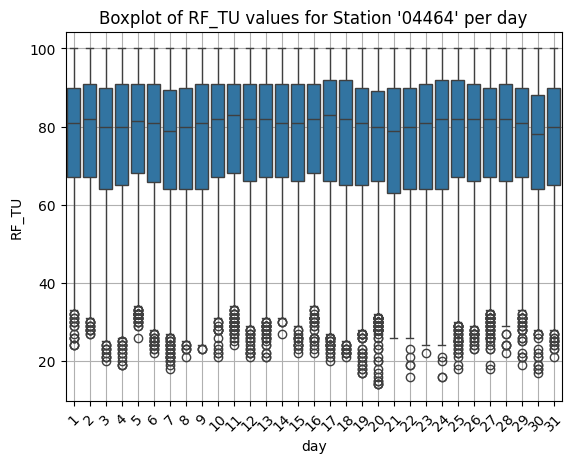

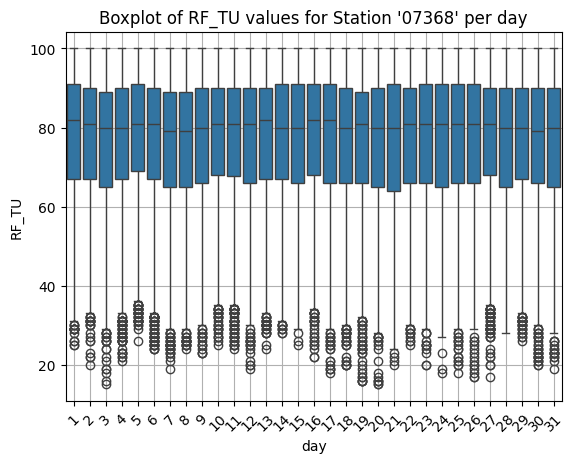

In [122]:
#Tagesanalyse RF_TU Boxplot pro Station
for key, tmpDf in stationDataDictionary.items():
    sns.boxplot(data= tmpDf, x= 'day', y= 'RF_TU')
    plt.title(f"Boxplot of RF_TU values for Station '{key}' per day")
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.show()

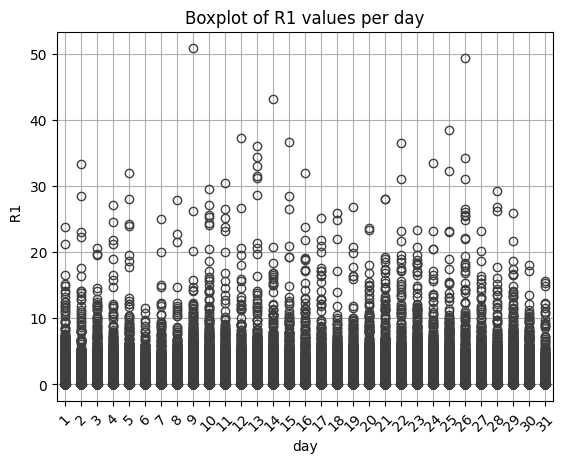

In [123]:
#Tagesanalyse R1 Boxplot für rowwiseDf
sns.boxplot(data= rowwiseDf, x= 'day', y= '  R1')
plt.title("Boxplot of R1 values per day")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

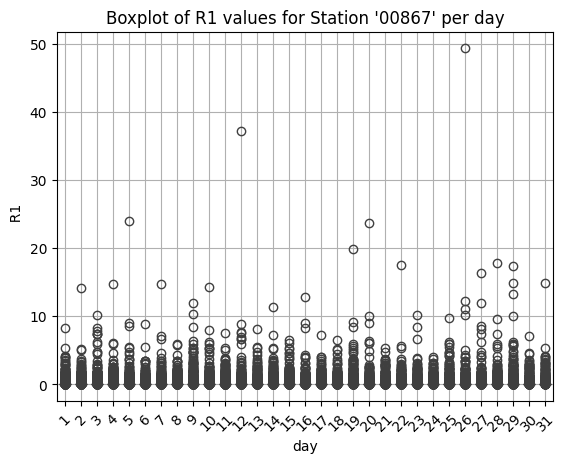

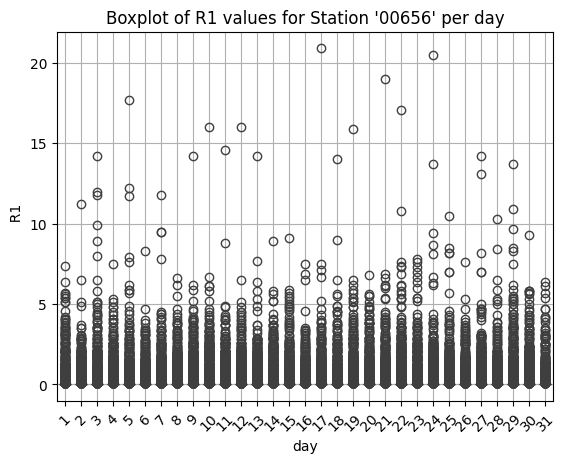

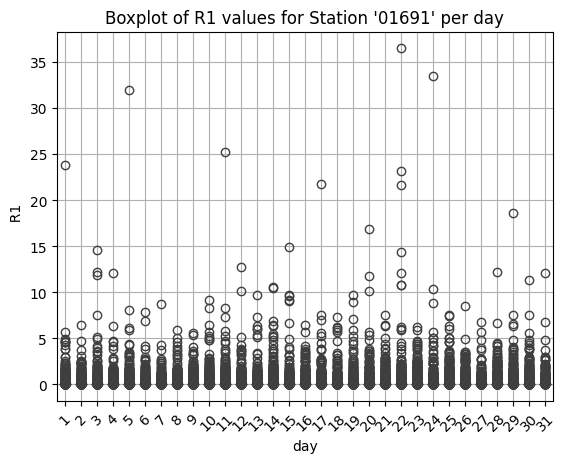

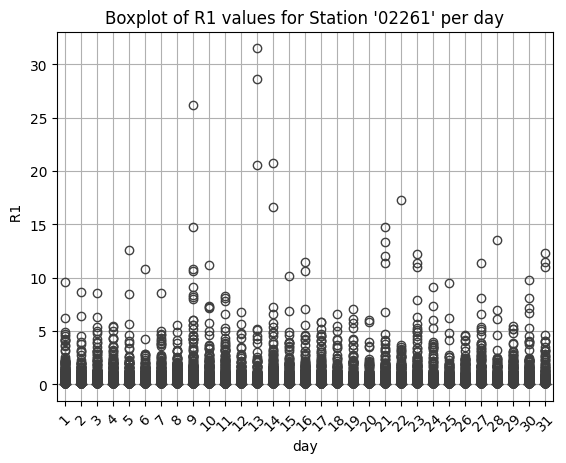

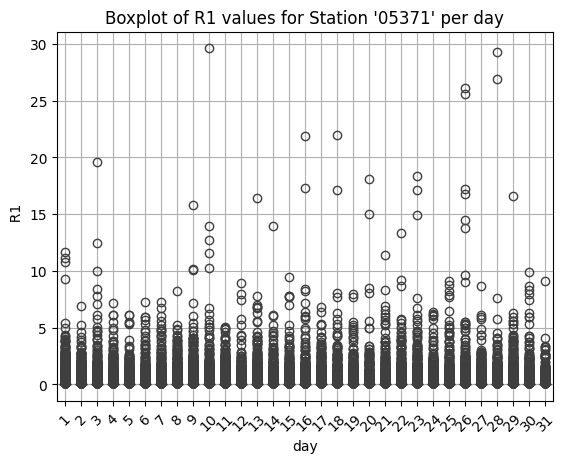

...

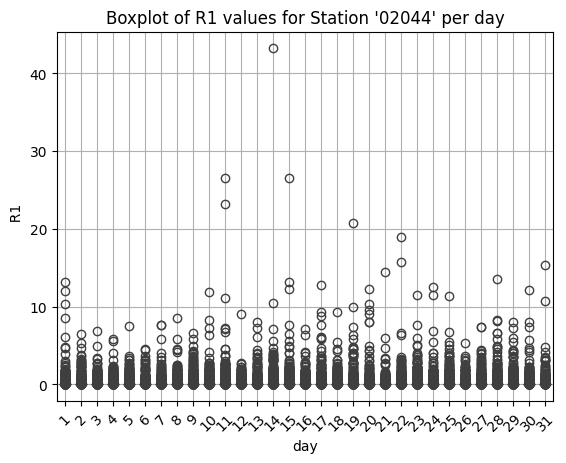

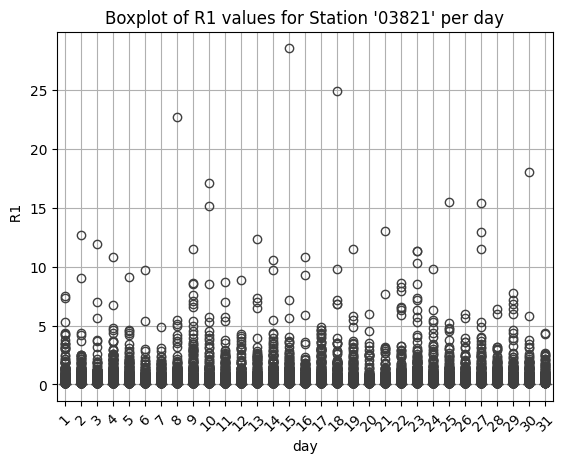

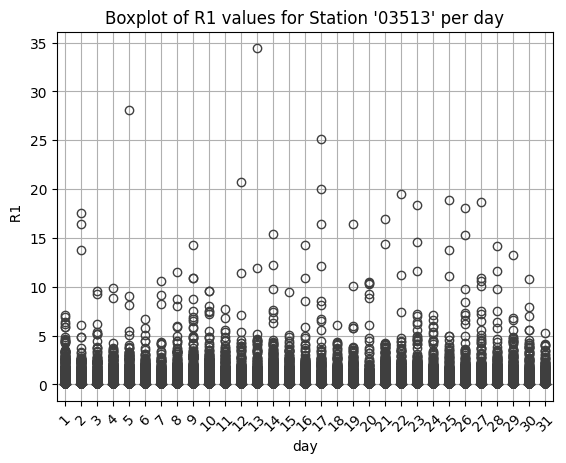

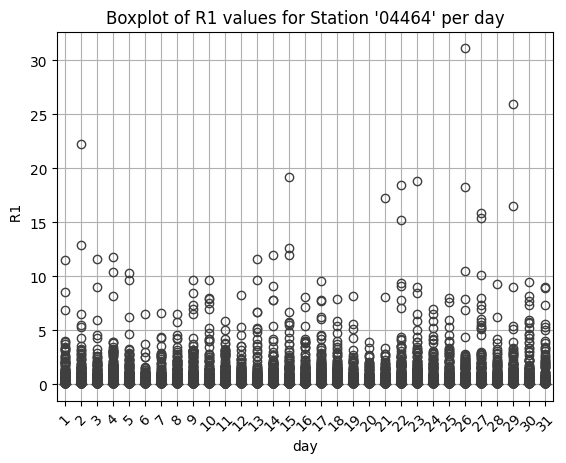

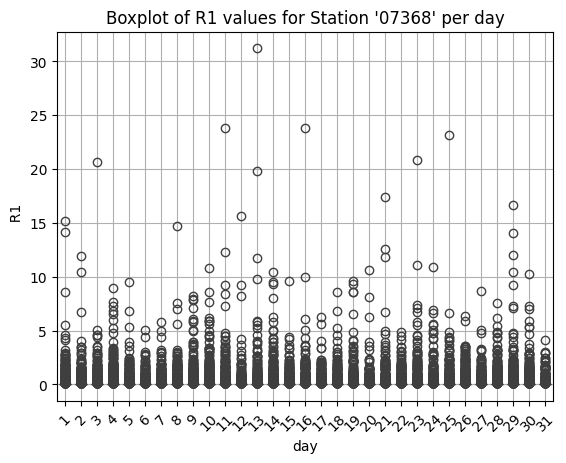

In [124]:
#Tagesanalyse R1 Boxplot pro Station
for key, tmpDf in stationDataDictionary.items():
    sns.boxplot(data= tmpDf, x= 'day', y= '  R1')
    plt.title(f"Boxplot of R1 values for Station '{key}' per day")
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.show()

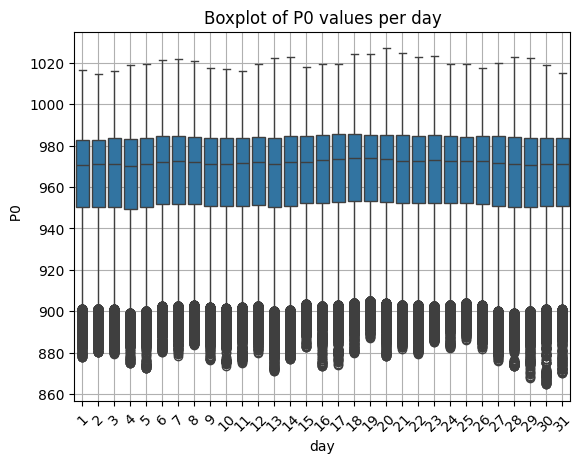

In [125]:
#Tagesanalyse P0 Boxplot für rowwiseDf
sns.boxplot(data= rowwiseDf, x= 'day', y= '  P0')
plt.title("Boxplot of P0 values per day")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

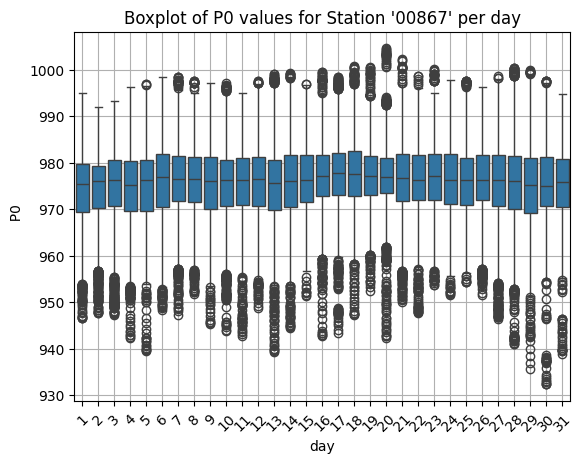

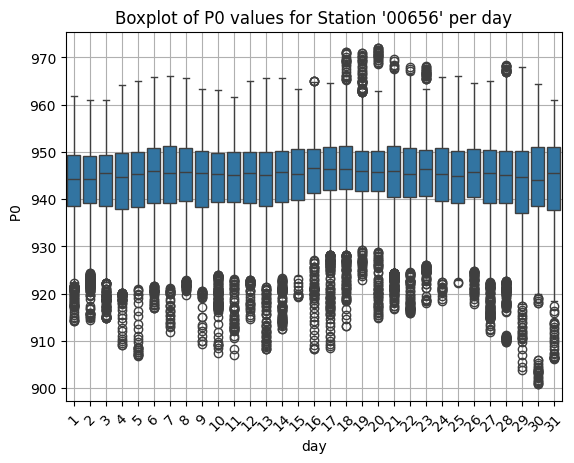

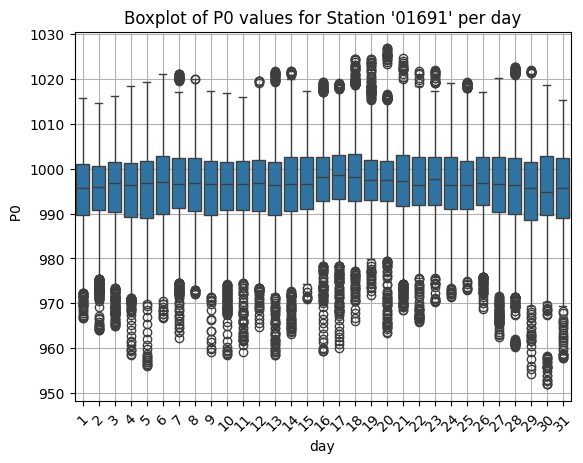

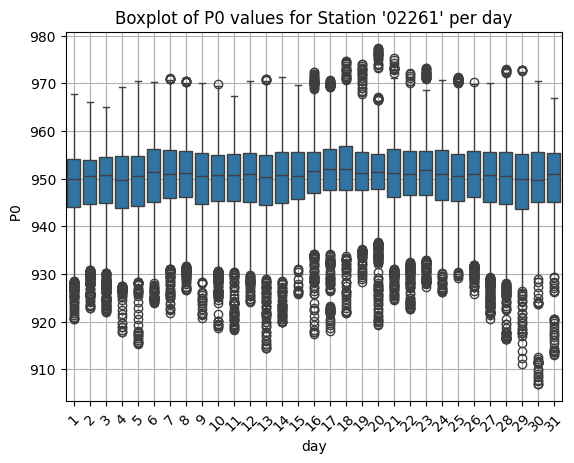

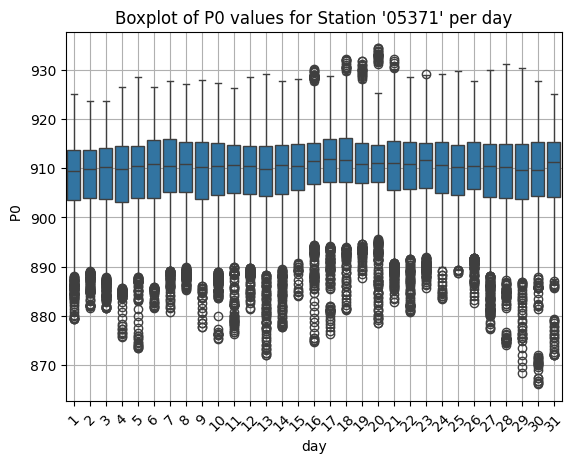

...

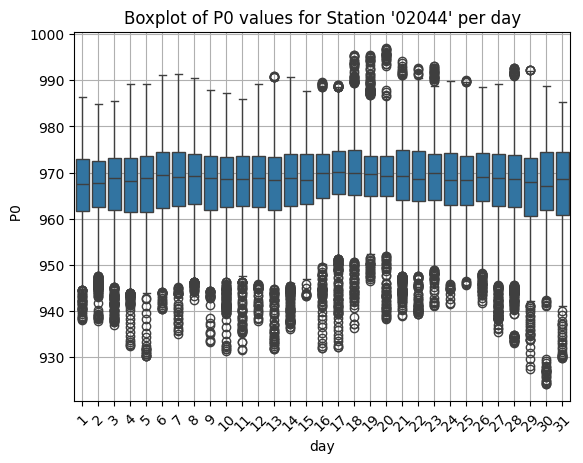

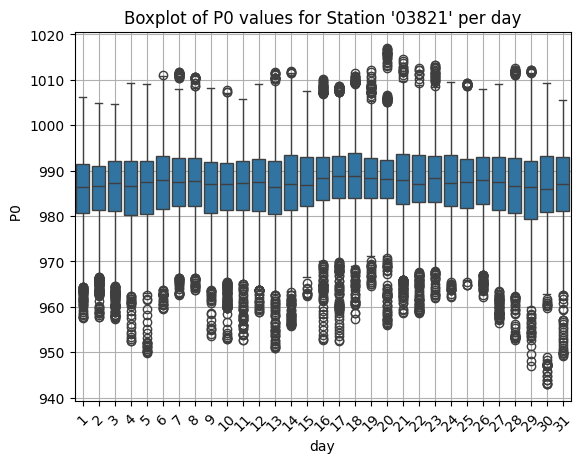

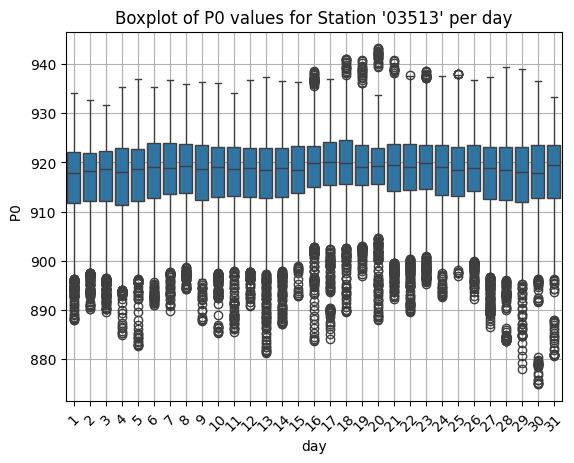

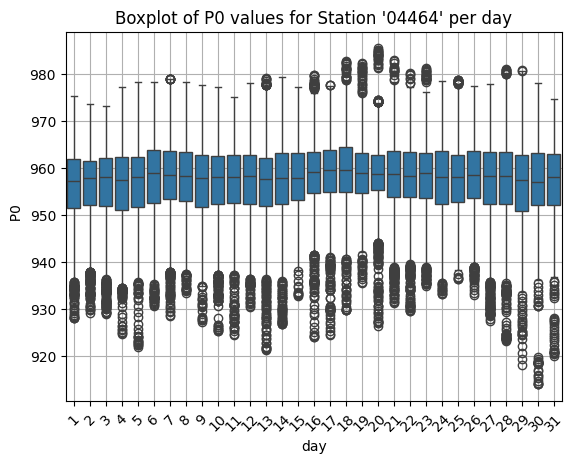

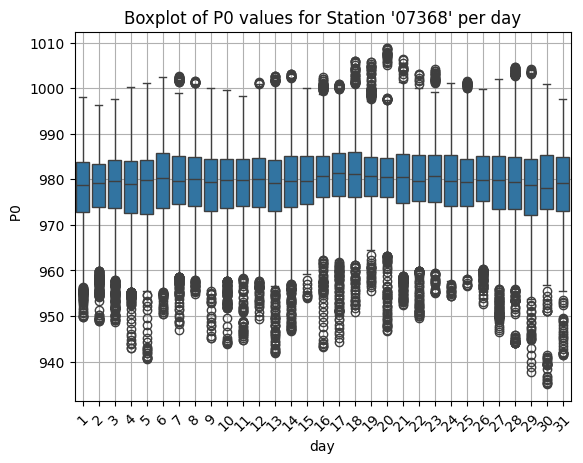

In [126]:
#Tagesanalyse P0 Boxplot pro Station
for key, tmpDf in stationDataDictionary.items():
    sns.boxplot(data= tmpDf, x= 'day', y= '  P0')
    plt.title(f"Boxplot of P0 values for Station '{key}' per day")
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.show()

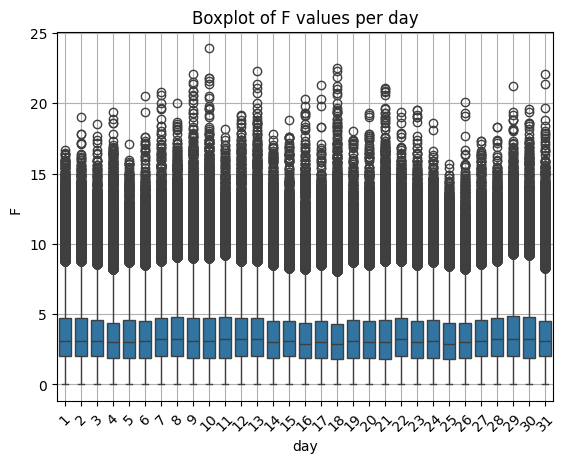

In [127]:
#Tagesanalyse F Boxplot für rowwiseDf
sns.boxplot(data= rowwiseDf, x= 'day', y= '   F')
plt.title("Boxplot of F values per day")
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

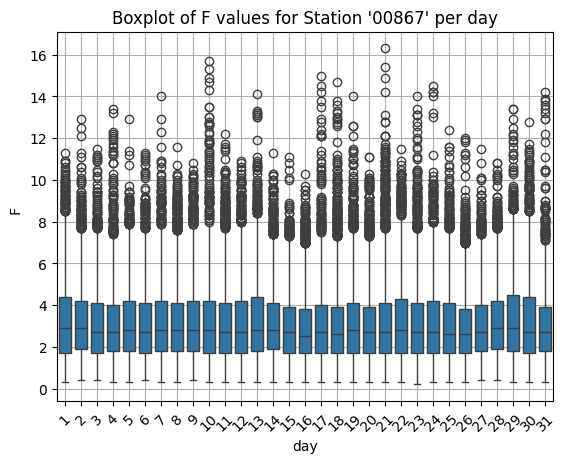

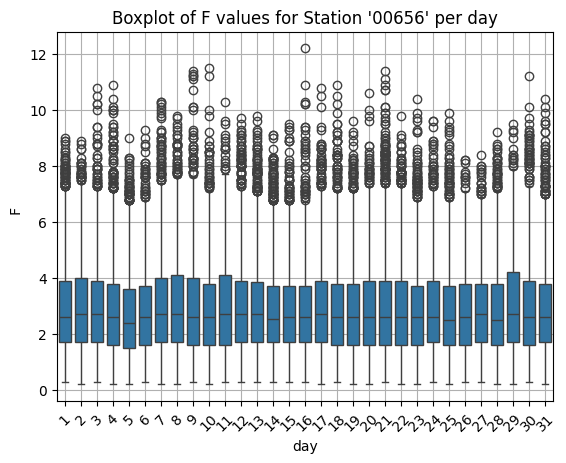

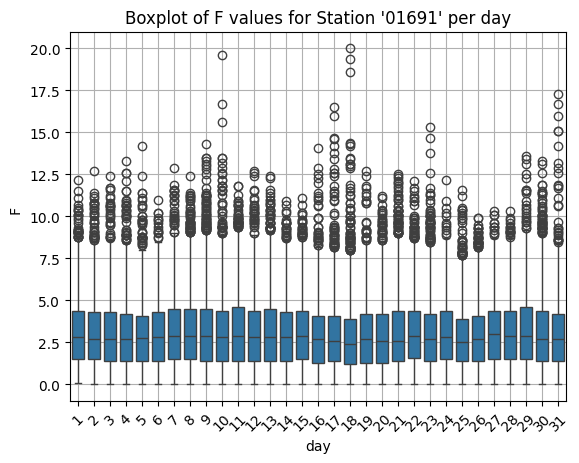

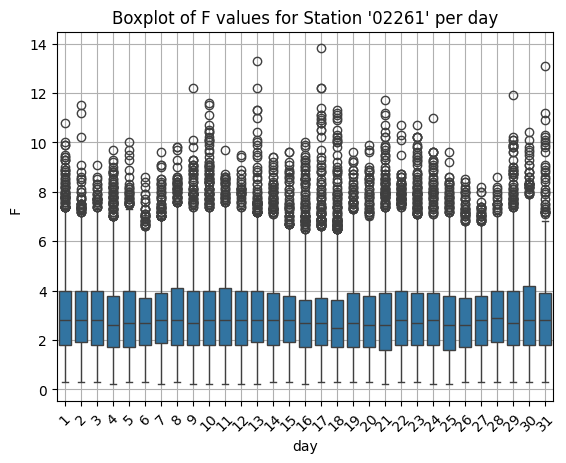

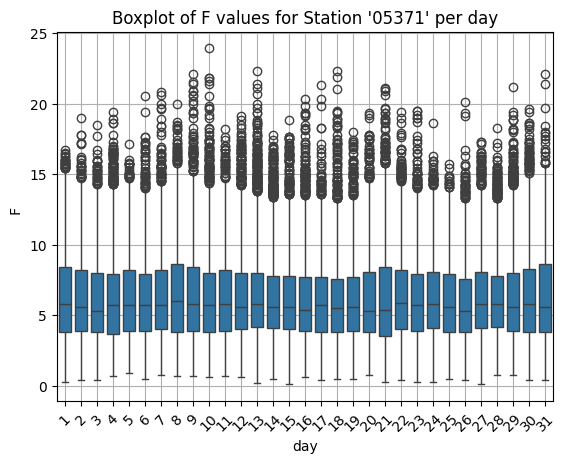

...

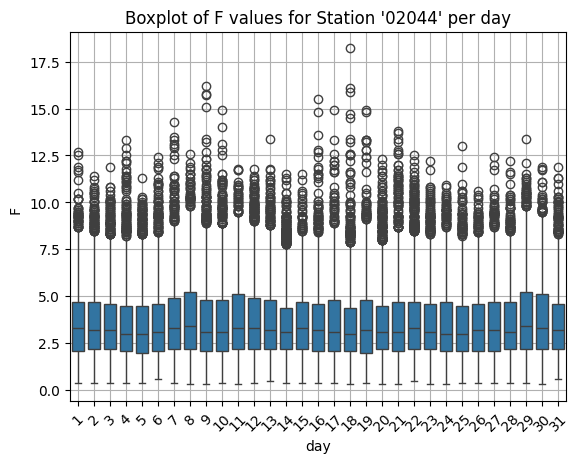

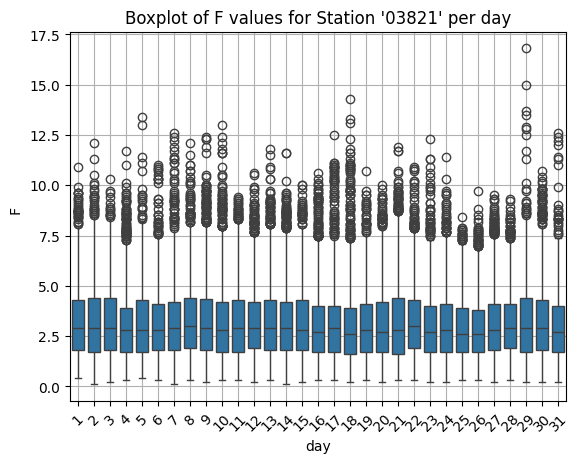

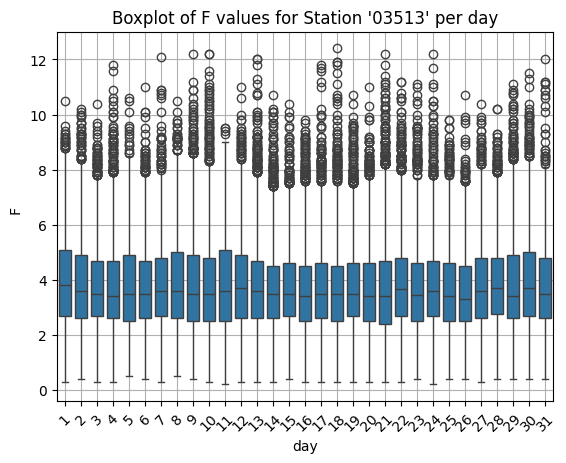

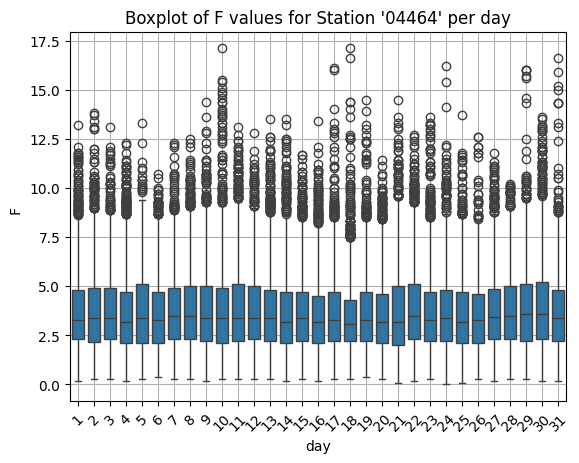

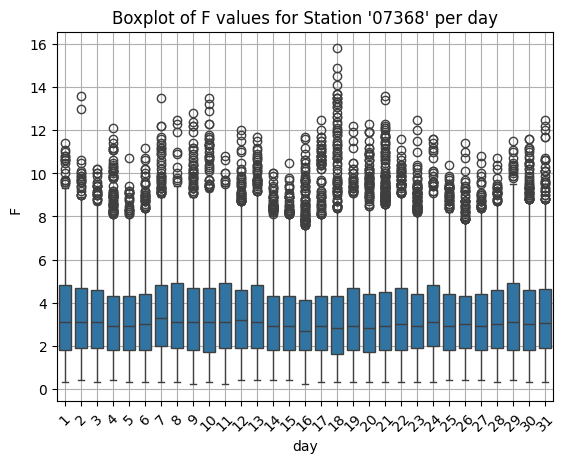

In [128]:
#Tagesanalyse F Boxplot pro Station
for key, tmpDf in stationDataDictionary.items():
    sns.boxplot(data= tmpDf, x= 'day', y= '   F')
    plt.title(f"Boxplot of F values for Station '{key}' per day")
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.show()

In [129]:
#Monatsanalyse

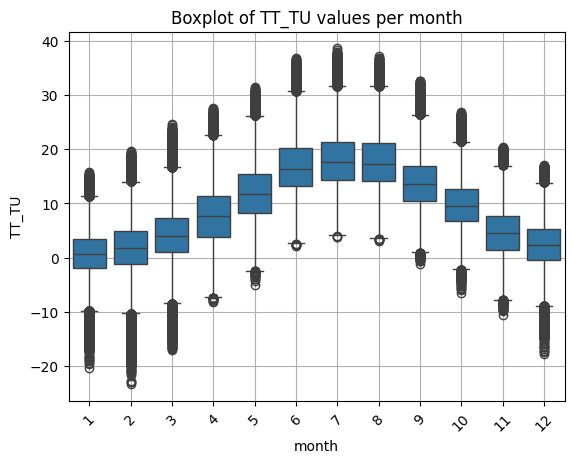

In [130]:
#Monatsanalyse TT_TU Boxplot für rowwiseDf
sns.boxplot(data= rowwiseDf, x= 'month', y= 'TT_TU')
plt.title("Boxplot of TT_TU values per month")
plt.xticks(rotation=45)
plt.grid(True)

plt.savefig("../results/TT_TU_monthly.png", dpi=300, bbox_inches="tight")
plt.show()
plt.close()

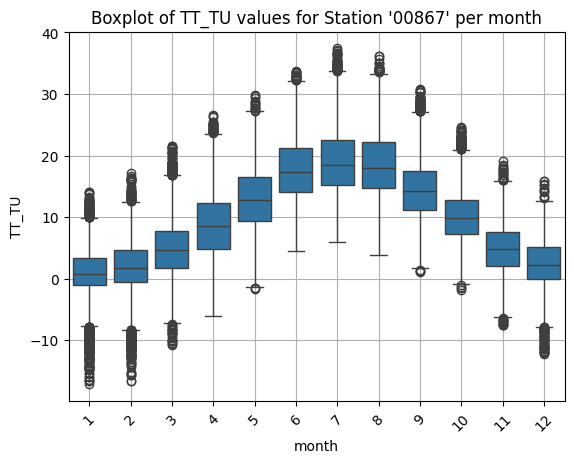

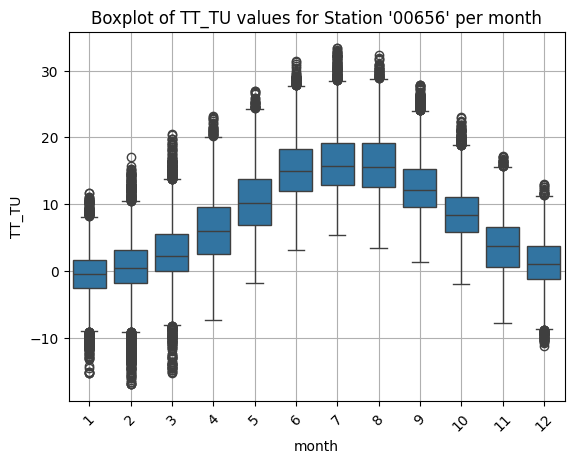

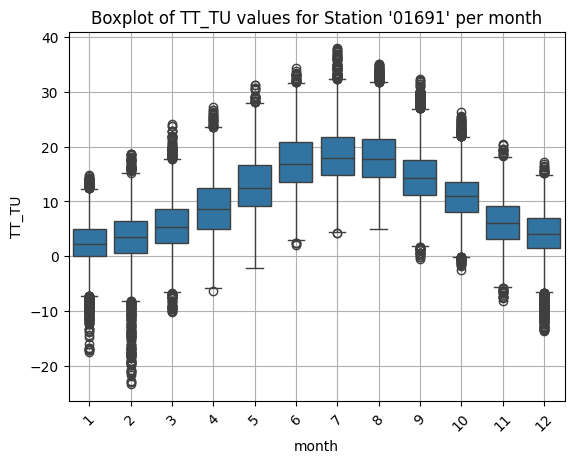

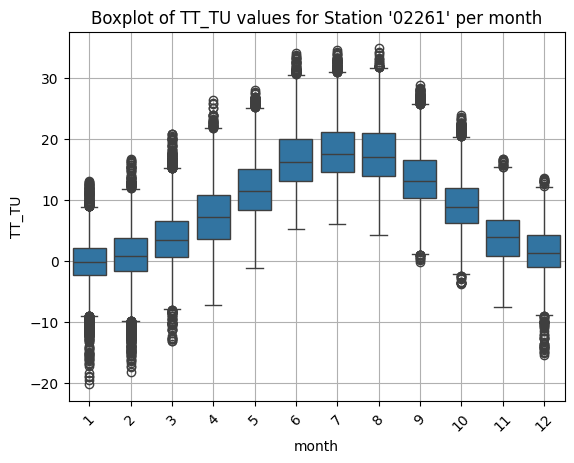

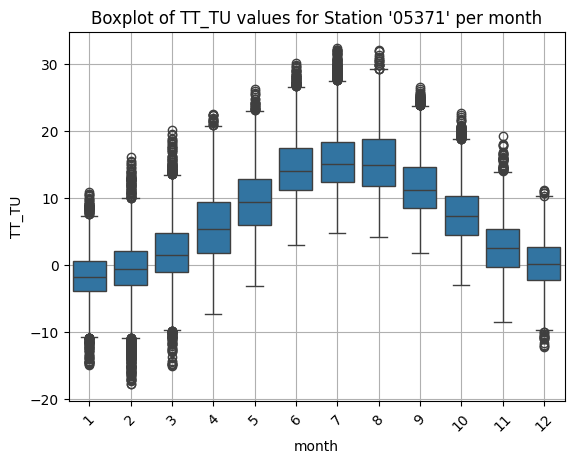

...

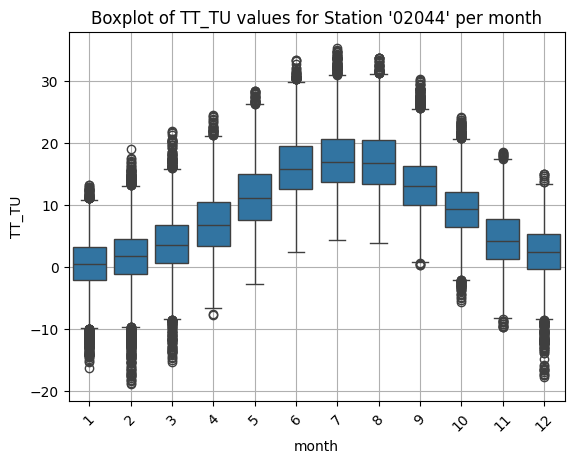

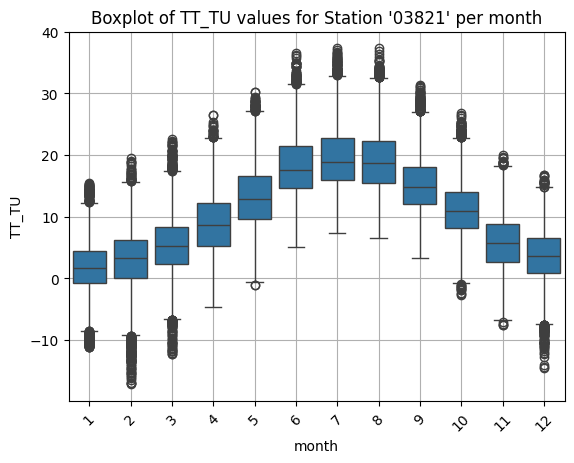

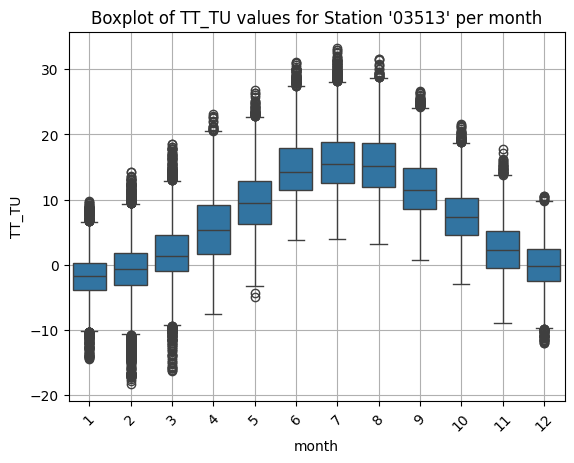

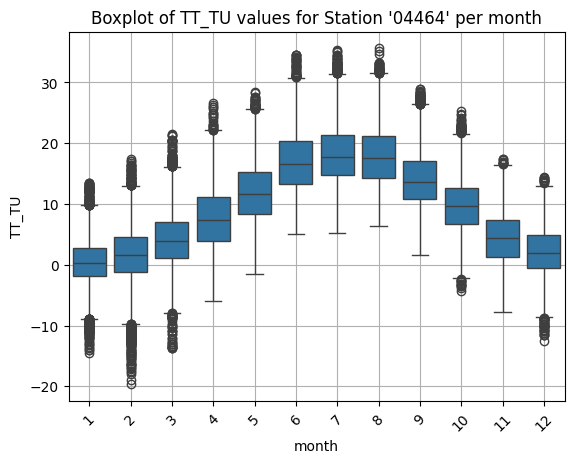

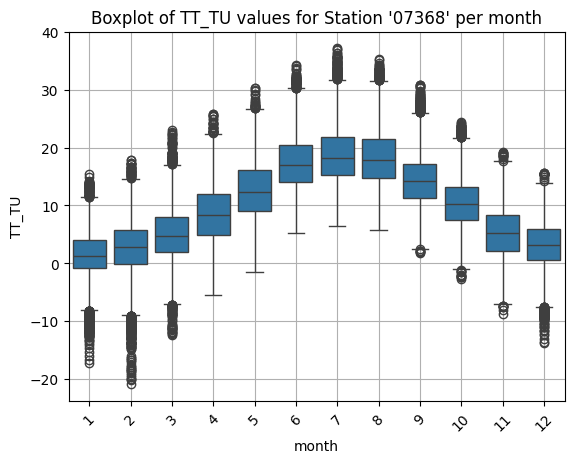

In [131]:
#Monatsanalyse TT_TU Boxplot pro Station
for key, tmpDf in stationDataDictionary.items():
    sns.boxplot(data= tmpDf, x= 'month', y= 'TT_TU')
    plt.title(f"Boxplot of TT_TU values for Station '{key}' per month")
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.show()

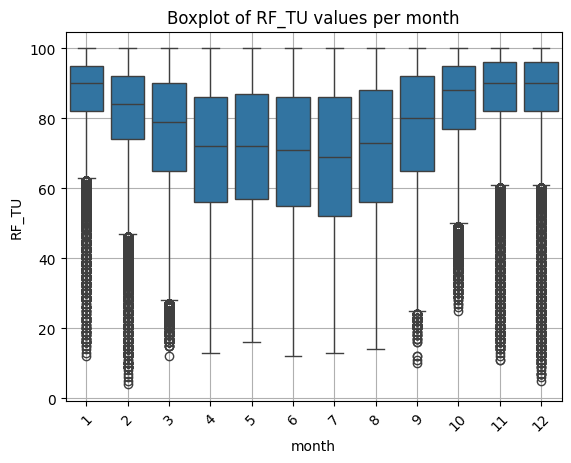

In [132]:
#Monatsanalyse RF_TU Boxplot für rowwiseDf
sns.boxplot(data= rowwiseDf, x= 'month', y= 'RF_TU')
plt.title("Boxplot of RF_TU values per month")
plt.xticks(rotation=45)
plt.grid(True)

plt.savefig("../results/RF_TU_monthly.png", dpi=300, bbox_inches="tight")
plt.show()
plt.close()

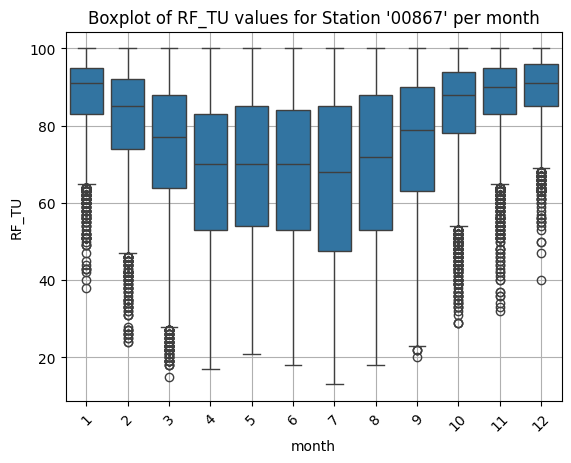

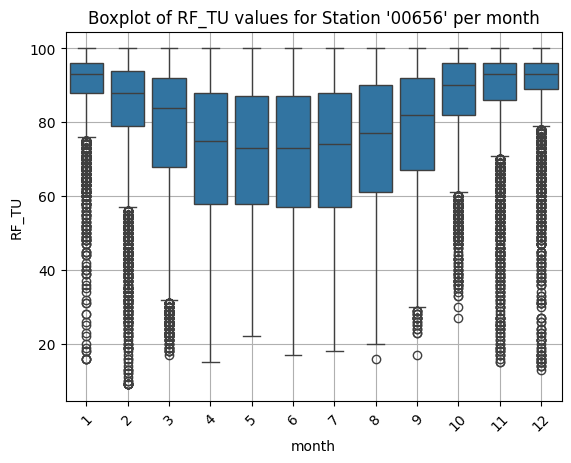

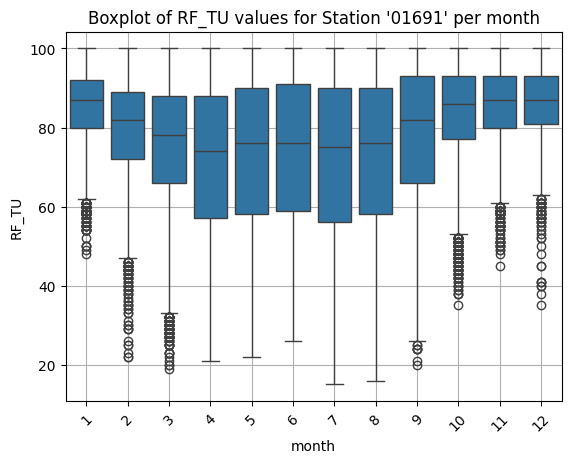

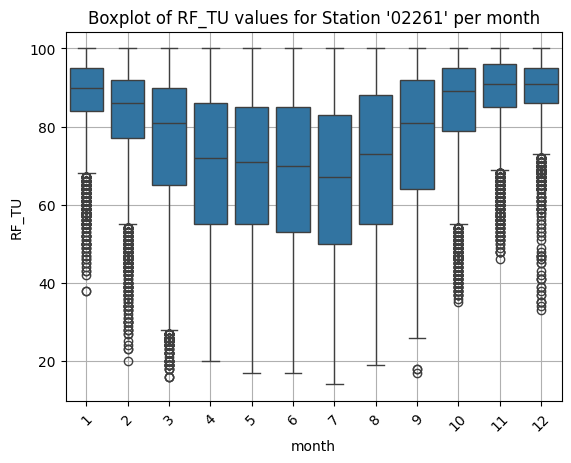

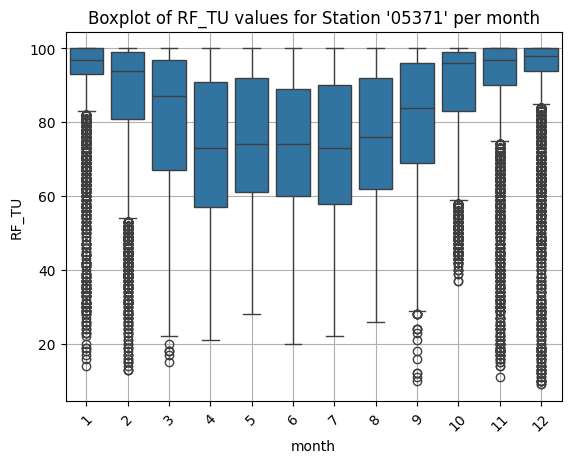

...

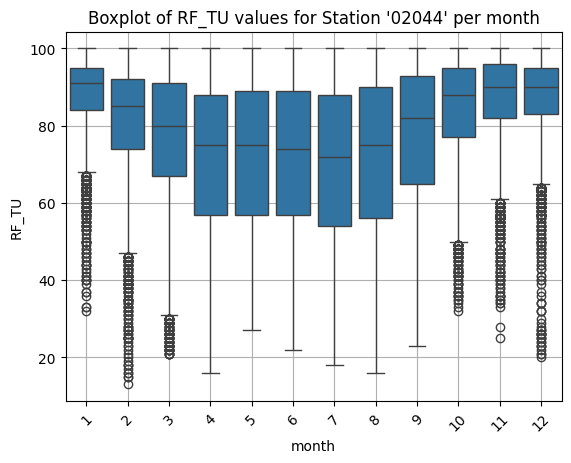

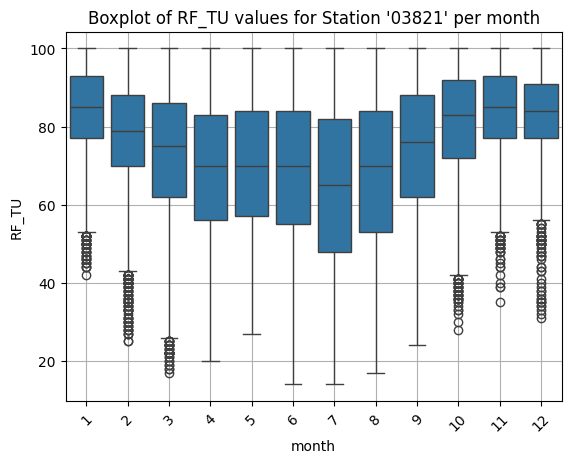

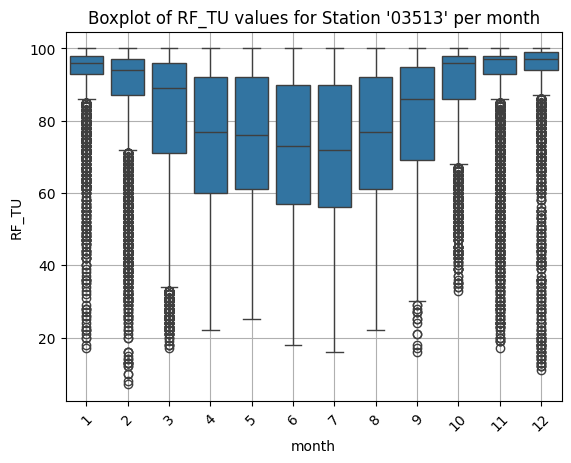

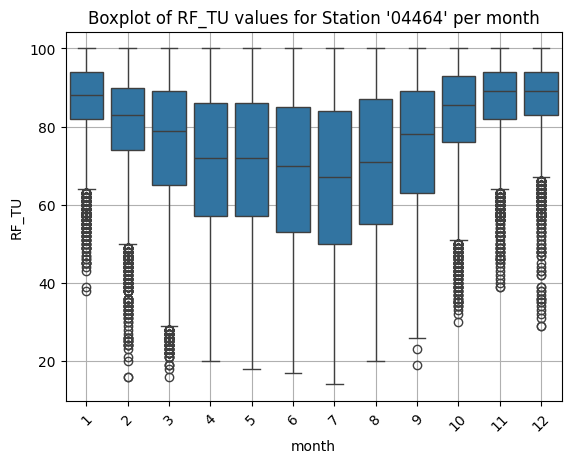

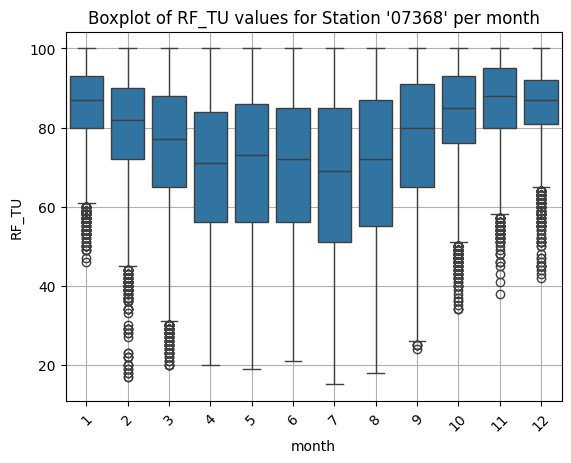

In [133]:
#Monatsanalyse RF_TU Boxplot pro Station
for key, tmpDf in stationDataDictionary.items():
    sns.boxplot(data= tmpDf, x= 'month', y= 'RF_TU')
    plt.title(f"Boxplot of RF_TU values for Station '{key}' per month")
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.show()

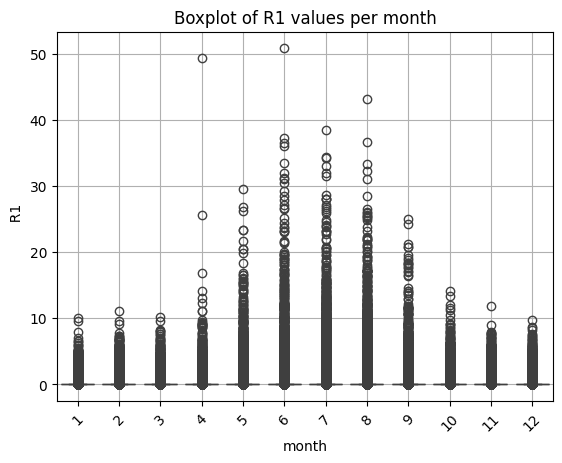

In [134]:
#Monatsanalyse R1 Boxplot für rowwiseDf
sns.boxplot(data= rowwiseDf, x= 'month', y= '  R1')
plt.title("Boxplot of R1 values per month")
plt.xticks(rotation=45)
plt.grid(True)

plt.savefig("../results/R1_monthly.png", dpi=300, bbox_inches="tight")
plt.show()
plt.close()

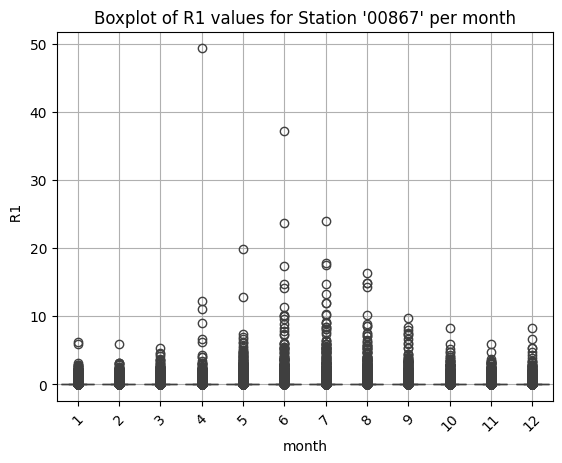

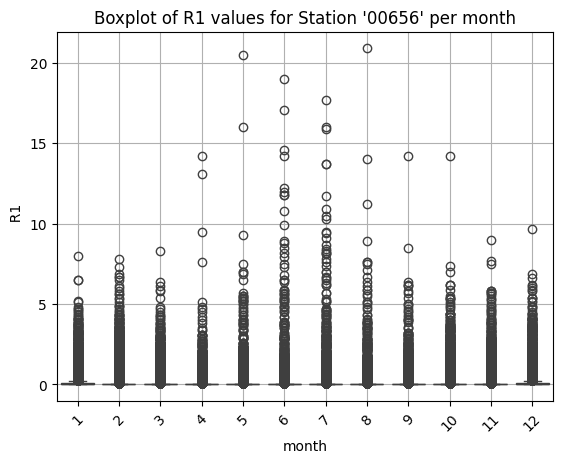

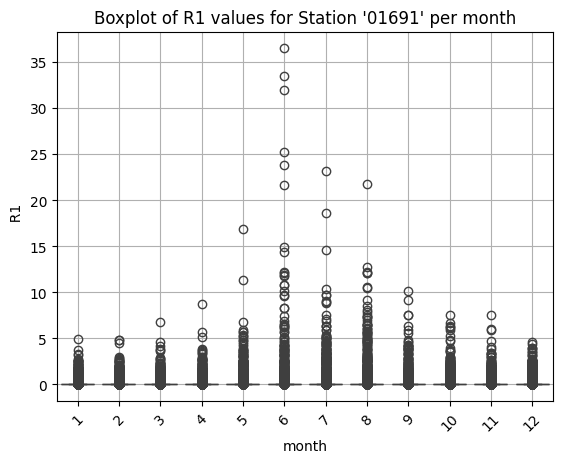

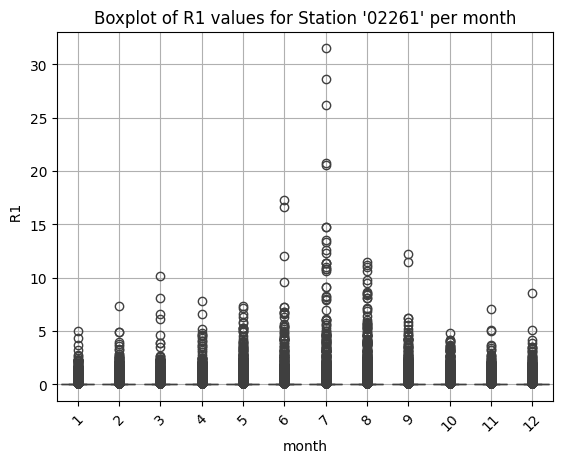

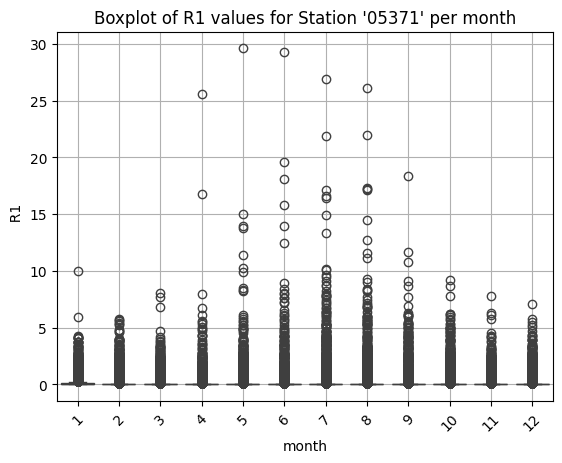

...

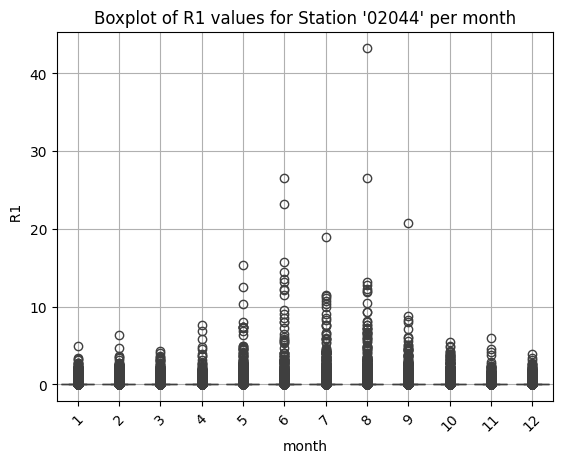

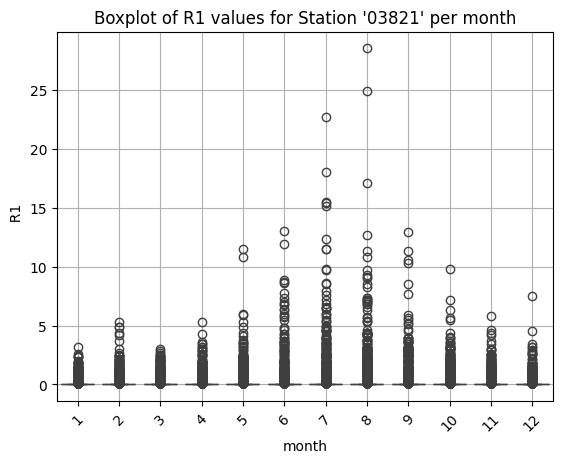

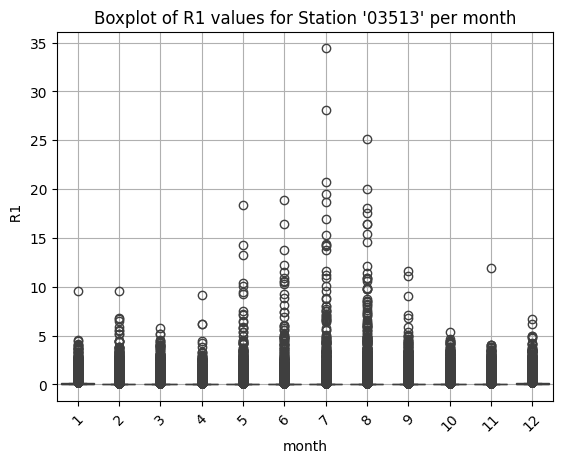

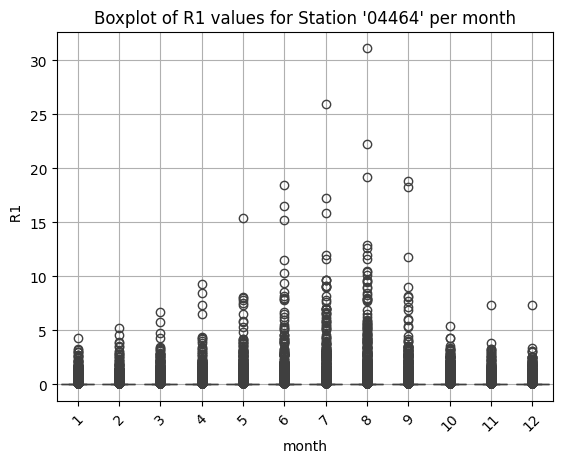

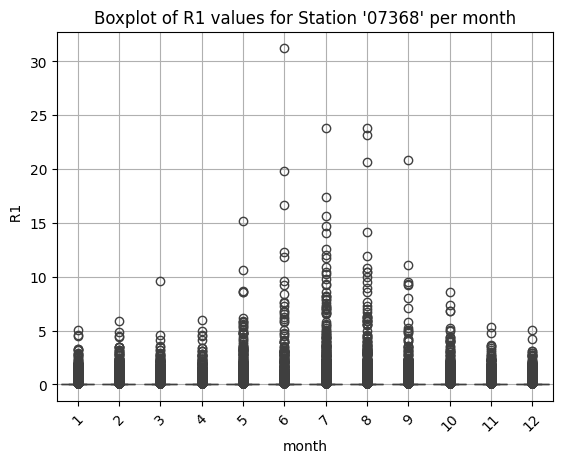

In [135]:
#Monatsanalyse R1 Boxplot pro Station
for key, tmpDf in stationDataDictionary.items():
    sns.boxplot(data= tmpDf, x= 'month', y= '  R1')
    plt.title(f"Boxplot of R1 values for Station '{key}' per month")
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.show()

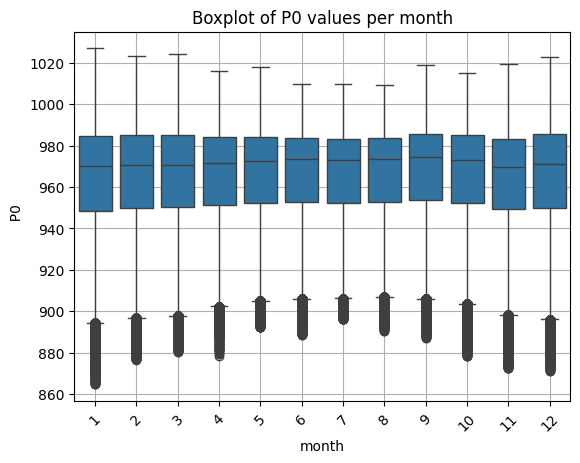

In [136]:
#Monatsanalyse P0 Boxplot für rowwiseDf
sns.boxplot(data= rowwiseDf, x= 'month', y= '  P0')
plt.title("Boxplot of P0 values per month")
plt.xticks(rotation=45)
plt.grid(True)

plt.savefig("../results/P0_monthly.png", dpi=300, bbox_inches="tight")
plt.show()
plt.close()

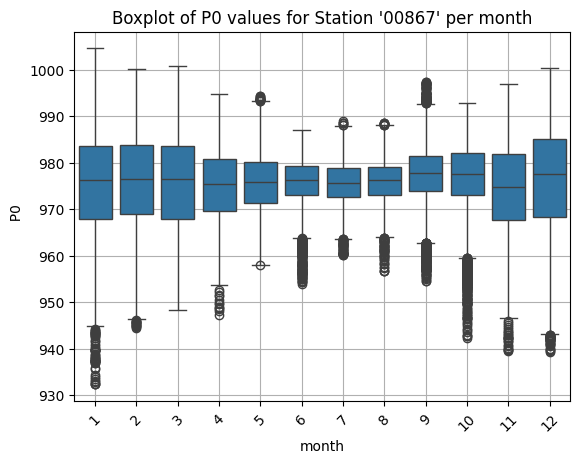

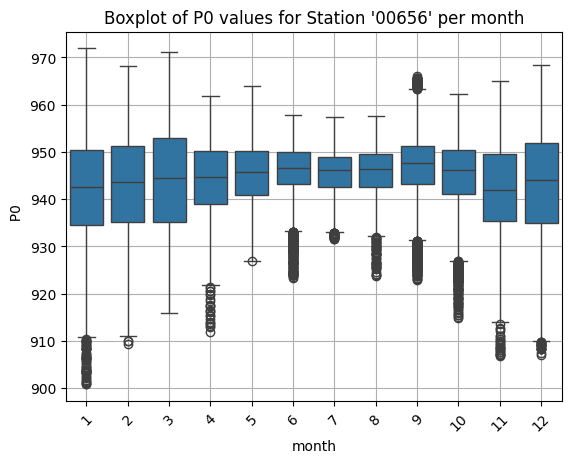

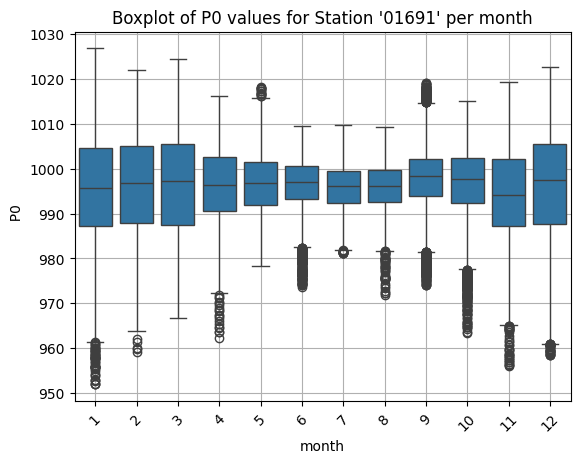

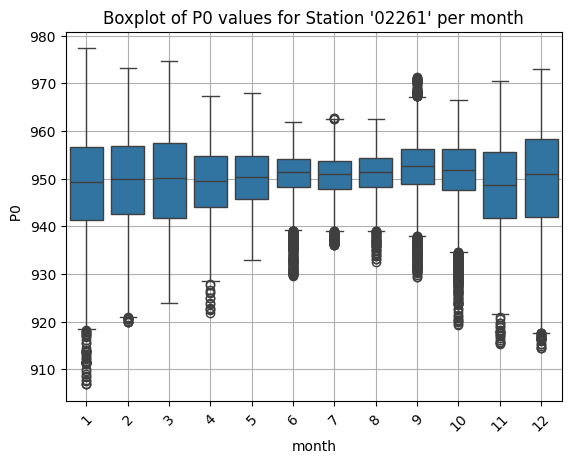

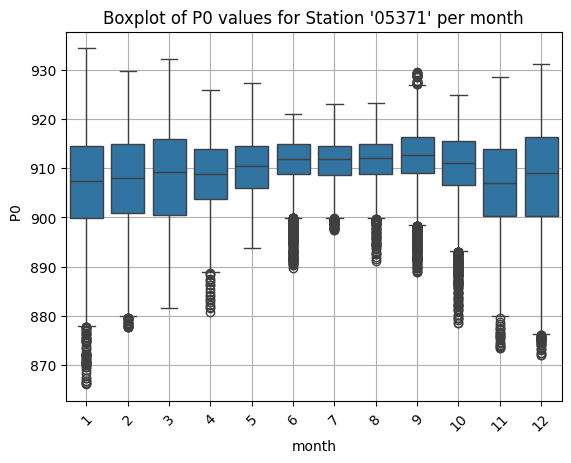

...

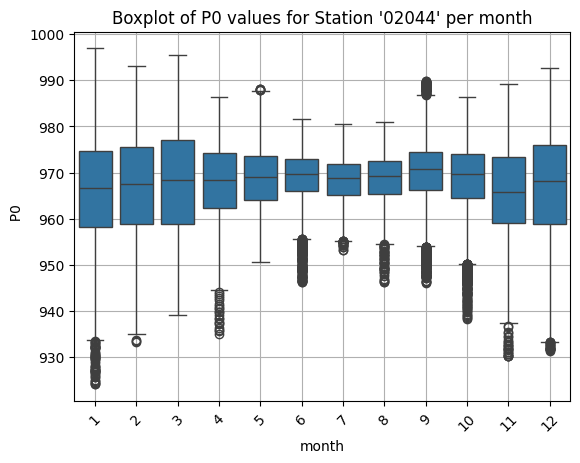

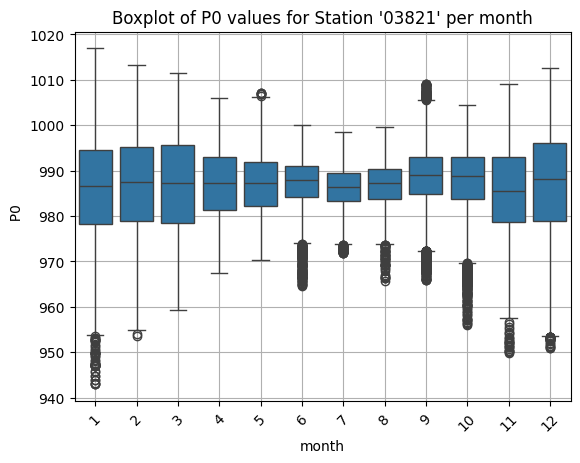

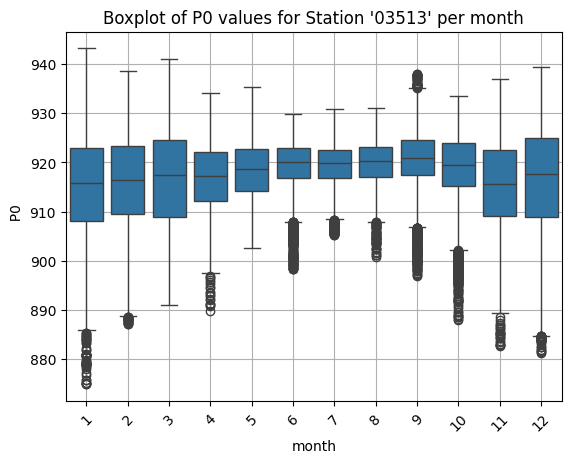

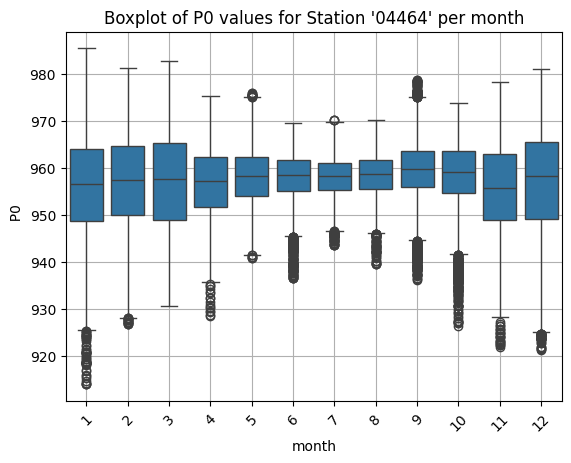

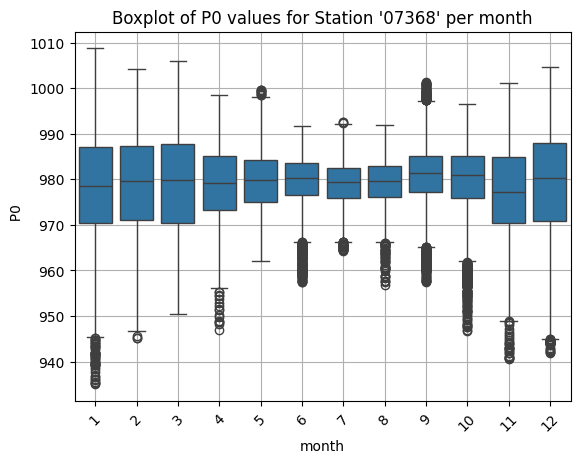

In [137]:
#Monatsanalyse P0 Boxplot pro Station
for key, tmpDf in stationDataDictionary.items():
    sns.boxplot(data= tmpDf, x= 'month', y= '  P0')
    plt.title(f"Boxplot of P0 values for Station '{key}' per month")
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.show()

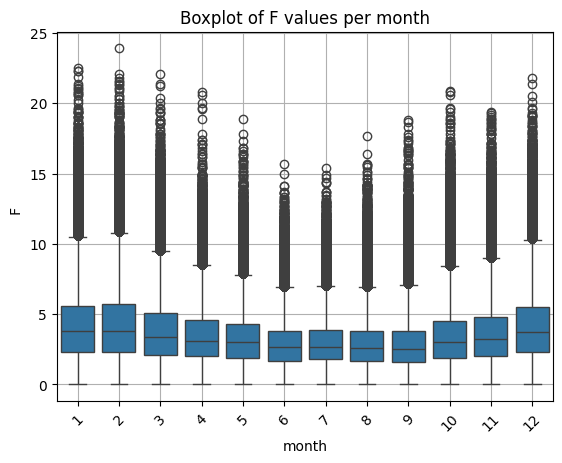

In [138]:
#Monatsanalyse F Boxplot für rowwiseDf
sns.boxplot(data= rowwiseDf, x= 'month', y= '   F')
plt.title("Boxplot of F values per month")
plt.xticks(rotation=45)
plt.grid(True)

plt.savefig("../results/F_monthly.png", dpi=300, bbox_inches="tight")
plt.show()
plt.close()

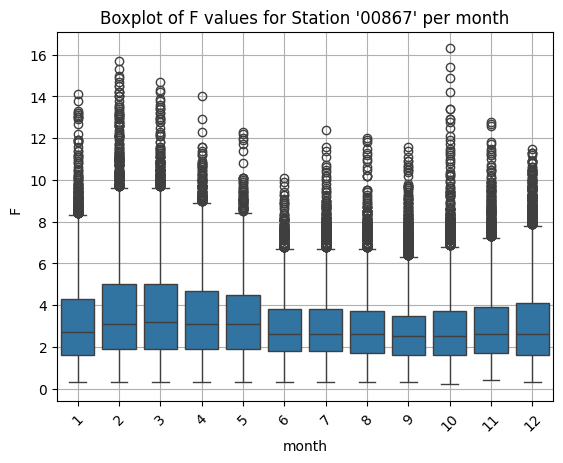

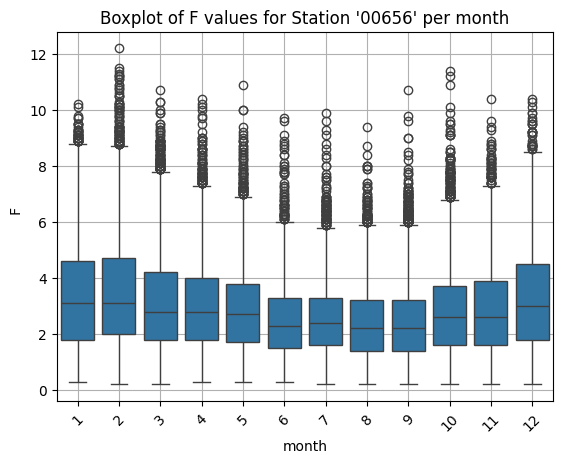

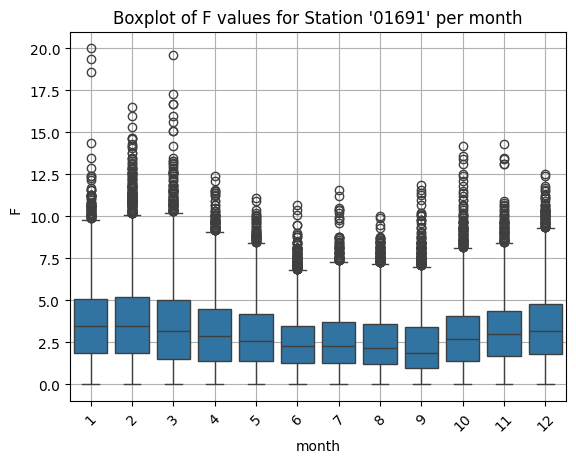

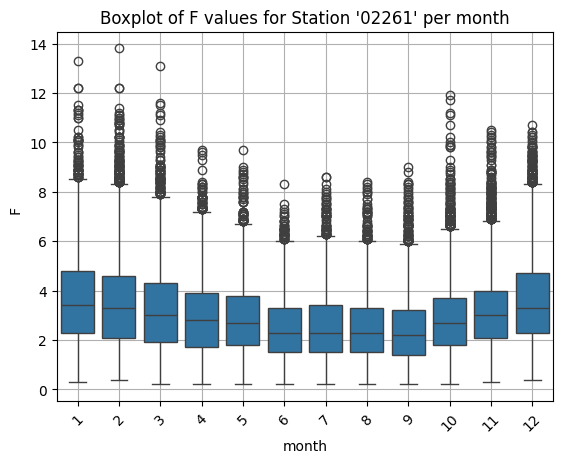

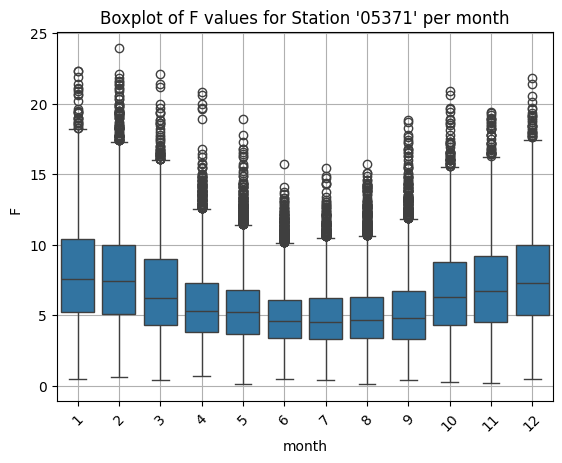

...

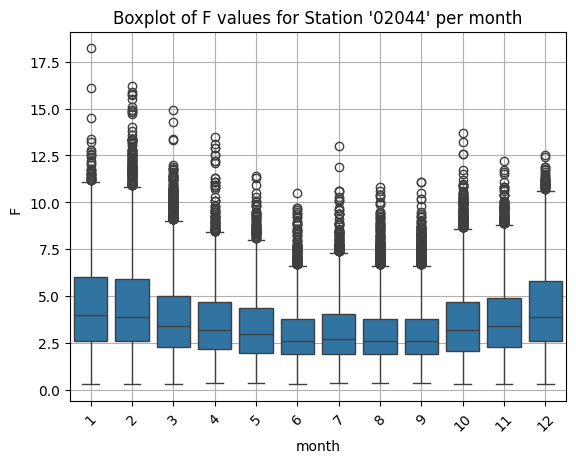

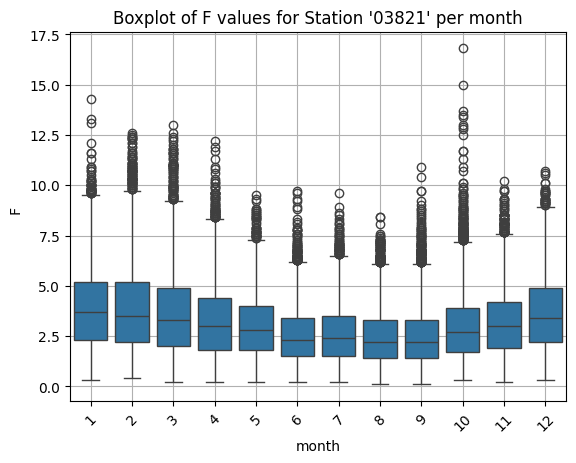

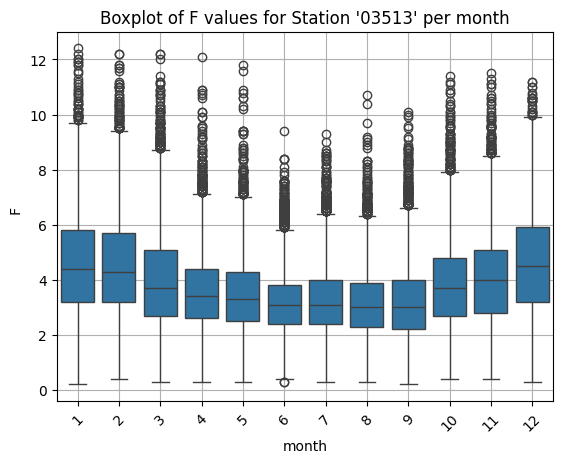

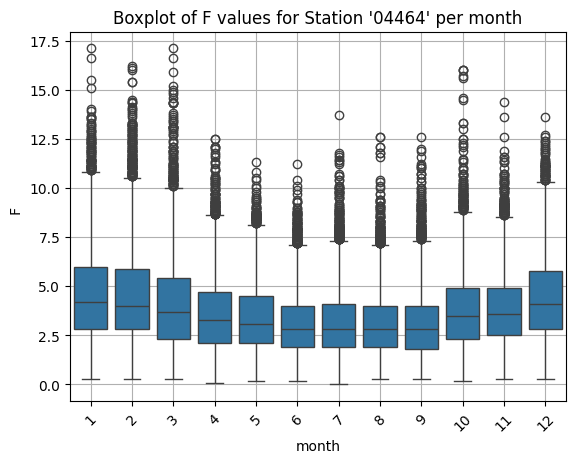

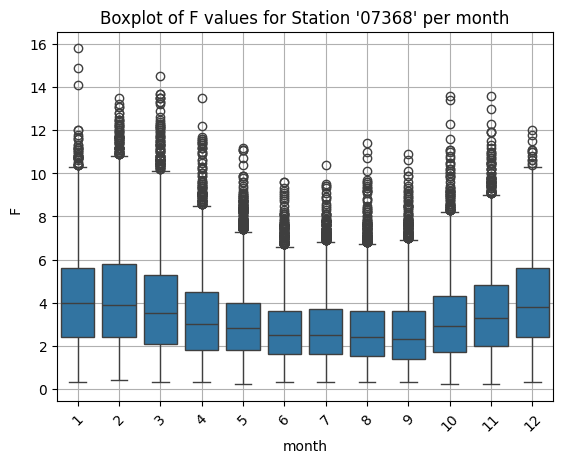

In [139]:
#Monatsanalyse F Boxplot pro Station
for key, tmpDf in stationDataDictionary.items():
    sns.boxplot(data= tmpDf, x= 'month', y= '   F')
    plt.title(f"Boxplot of F values for Station '{key}' per month")
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.show()

In [140]:
#interparametrische Konsitenz Check

In [141]:
#bei hoher Temperatur ist 100% Luftfeuchtigkeit unwahrscheinlich
rowwiseDf[(rowwiseDf["TT_TU"] > 30) & (rowwiseDf["RF_TU"] == 100)]

,MESS_DATUM,STATIONS_ID,TT_TU,RF_TU,R1,RS_IND,WRTR,P,P0,F,...,geoBreite,geoLaenge,Stationsname,hour,day,month,hour_sin,hour_cos,month_sin,month_cos


In [142]:
#es sollte nur Regnen wenn Regen auch indiziert wird
rowwiseDf[(rowwiseDf["  R1"] > 0) & (rowwiseDf["RS_IND"] == 0)]

,MESS_DATUM,STATIONS_ID,TT_TU,RF_TU,R1,RS_IND,WRTR,P,P0,F,...,geoBreite,geoLaenge,Stationsname,hour,day,month,hour_sin,hour_cos,month_sin,month_cos


In [143]:
rowwiseDf[(rowwiseDf["  R1"] == 0) & (rowwiseDf["RS_IND"] == 1)]

,MESS_DATUM,STATIONS_ID,TT_TU,RF_TU,R1,RS_IND,WRTR,P,P0,F,...,geoBreite,geoLaenge,Stationsname,hour,day,month,hour_sin,hour_cos,month_sin,month_cos
8,2014-01-01 08:00:00,867.0,-1.6,94.0,0.0,1.0,NaN,1018.0,975.0,2.4,...,50.3066,10.9679,Lautertal-Oberlauter,8,1,1,0.866025,-0.500000,5.000000e-01,0.866025
13,2014-01-01 13:00:00,867.0,0.1,92.0,0.0,1.0,NaN,1016.4,973.7,3.4,...,50.3066,10.9679,Lautertal-Oberlauter,13,1,1,-0.258819,-0.965926,5.000000e-01,0.866025
27,2014-01-02 03:00:00,867.0,1.1,87.0,0.0,1.0,NaN,1009.1,966.9,3.2,...,50.3066,10.9679,Lautertal-Oberlauter,3,2,1,0.707107,0.707107,5.000000e-01,0.866025
28,2014-01-02 04:00:00,867.0,1.3,86.0,0.0,1.0,NaN,1008.1,966.0,3.8,...,50.3066,10.9679,Lautertal-Oberlauter,4,2,1,0.866025,0.500000,5.000000e-01,0.866025
29,2014-01-02 05:00:00,867.0,1.7,83.0,0.0,1.0,NaN,1007.5,965.4,4.3,...,50.3066,10.9679,Lautertal-Oberlauter,5,2,1,0.965926,0.258819,5.000000e-01,0.866025
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1665275,2023-12-30 11:00:00,7368.0,7.4,77.0,0.0,1.0,6.0,1014.8,977.0,6.4,...,51.0007,10.3621,Eisenach,11,30,12,0.258819,-0.965926,-2.449294e-16,1.000000
1665290,2023-12-31 02:00:00,7368.0,6.6,81.0,0.0,1.0,6.0,1010.9,973.2,1.4,...,51.0007,10.3621,Eisenach,2,31,12,0.500000,0.866025,-2.449294e-16,1.000000
1665297,2023-12-31 09:00:00,7368.0,5.7,79.0,0.0,1.0,6.0,1005.9,968.2,2.2,...,51.0007,10.3621,Eisenach,9,31,12,0.707107,-0.707107,-2.449294e-16,1.000000
1665301,2023-12-31 13:00:00,7368.0,7.5,70.0,0.0,1.0,6.0,1002.4,965.1,4.0,...,51.0007,10.3621,Eisenach,13,31,12,-0.258819,-0.965926,-2.449294e-16,1.000000


In [144]:
#es sollte keine windrichtung angezeigt werden wenn kein Wind ist
rowwiseDf[(rowwiseDf['   F'] == 0) & (rowwiseDf['   D'] > 0)]

,MESS_DATUM,STATIONS_ID,TT_TU,RF_TU,R1,RS_IND,WRTR,P,P0,F,...,geoBreite,geoLaenge,Stationsname,hour,day,month,hour_sin,hour_cos,month_sin,month_cos


In [145]:
#druck auf Meereshöhe sollte höher sein als in höheren Lagen
rowwiseDf[rowwiseDf['  P0'] > rowwiseDf['   P']]

,MESS_DATUM,STATIONS_ID,TT_TU,RF_TU,R1,RS_IND,WRTR,P,P0,F,...,geoBreite,geoLaenge,Stationsname,hour,day,month,hour_sin,hour_cos,month_sin,month_cos
